# Download data, do initial EDA

## Download the data

In [4]:
import collections

file_dict = collections.OrderedDict()
# file_dict['submission.csv'] = 'https://s3.amazonaws.com/drivendata/data/49/public/submission_format.csv'
# file_dict['train.csv'] = 'https://s3.amazonaws.com/drivendata/data/49/public/train_labels.csv'
# file_dict['raw_chimps.tgz'] = 'https://s3.amazonaws.com/drivendata-public-assets/raw_chimps.tgz'

    
file_dict['micro_chimps.tgz'] = 'https://s3.amazonaws.com/drivendata-public-assets/micro_chimps.tgz'

In [3]:
for file,url in file_dict.items():
    url_q = "'" + url + "'"
    ! wget --continue --no-check-certificate --no-proxy -O $file $url_q

--2017-10-31 16:33:11--  https://s3.amazonaws.com/drivendata/data/49/public/submission_format.csv
Resolving s3.amazonaws.com (s3.amazonaws.com)... 52.216.99.109
Connecting to s3.amazonaws.com (s3.amazonaws.com)|52.216.99.109|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 9710963 (9.3M) [text/csv]
Saving to: 'submission.csv'

submission.csv      100%[===================>]   9.26M   942KB/s    in 11s     

2017-10-31 16:33:23 (859 KB/s) - 'submission.csv' saved [9710963/9710963]

--2017-10-31 16:33:23--  https://s3.amazonaws.com/drivendata/data/49/public/train_labels.csv
Resolving s3.amazonaws.com (s3.amazonaws.com)... 52.216.2.11
Connecting to s3.amazonaws.com (s3.amazonaws.com)|52.216.2.11|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 22658668 (22M) [text/csv]
Saving to: 'train.csv'

train.csv           100%[===================>]  21.61M  73.4KB/s    in 2m 14s  

2017-10-31 16:35:37 (166 KB/s) - 'train.csv' saved [22658668/22658668

In [5]:
for file,url in file_dict.items():
    url_q = "'" + url + "'"
    ! wget --continue --no-check-certificate --no-proxy -O $file $url_q

--2017-10-31 16:42:07--  https://s3.amazonaws.com/drivendata-public-assets/micro_chimps.tgz
Resolving s3.amazonaws.com (s3.amazonaws.com)... 52.216.224.171
Connecting to s3.amazonaws.com (s3.amazonaws.com)|52.216.224.171|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 3801323520 (3.5G) [application/x-tar]
Saving to: 'micro_chimps.tgz'

micro_chimps.tgz    100%[===================>]   3.54G   986KB/s    in 40m 32s 

2017-10-31 17:22:40 (1.49 MB/s) - 'micro_chimps.tgz' saved [3801323520/3801323520]



## Unpack the pictures

In [6]:
!ls *.tgz  

micro_chimps.tgz


In [7]:
!mkdir -p micro_chimps

In [12]:
!rm -rf micro_chimps/micro

In [13]:
!tar -xf micro_chimps.tgz -C micro_chimps/

In [ ]:
!ls -ls micro_chimps/micro

# Do the EDA on tables and small videos

## Basic EDA

In [2]:
!ls -ls micro_chimps/micro | wc -l 

456003


In [3]:
!ls -laht micro_chimps/micro | head

total 4.3G
drwxr-xr-x 2 keras users  16M Nov  1 05:21 .
drwxr-xr-x 3 keras users 4.0K Nov  1 05:21 ..
-rw-r--r-- 1 keras users  30K Oct 12 21:33 6YMUYj2lyi.mp4
-rw-r--r-- 1 keras users  17K Oct 12 21:33 7J73HNoOI8.mp4
-rw-r--r-- 1 keras users  20K Oct 12 21:33 fh33q0Ubn4.mp4
-rw-r--r-- 1 keras users 4.8K Oct 12 21:33 ivRmgV7Txl.mp4
-rw-r--r-- 1 keras users 4.8K Oct 12 21:33 kwQwl1yiGf.mp4
-rw-r--r-- 1 keras users 4.7K Oct 12 21:33 sKELqVzG2g.mp4
-rw-r--r-- 1 keras users 4.7K Oct 12 21:33 uP36JPByzT.mp4
ls: write error: Broken pipe


In [1]:
import pandas as pd

df_train = pd.read_csv('train.csv')
df_submit = pd.read_csv('submission.csv')

In [6]:
print(df_train.shape,df_submit.shape)

(204130, 25) (87484, 25)


In [12]:
import glob

g = glob.glob('micro_chimps/micro/*')
len(g)

456002

In [14]:
filenames = [(file.split('/')[-1])for file in g]

In [17]:
len(set(filenames))

456002

In [8]:
df_train.shape,df_submit.shape

((204130, 25), (87484, 25))

In [20]:
df_train.columns

Index(['filename', 'bird', 'blank', 'cattle', 'chimpanzee', 'elephant',
       'forest buffalo', 'gorilla', 'hippopotamus', 'human', 'hyena',
       'large ungulate', 'leopard', 'lion', 'other (non-primate)',
       'other (primate)', 'pangolin', 'porcupine', 'reptile', 'rodent',
       'small antelope', 'small cat', 'wild dog', 'duiker', 'hog'],
      dtype='object')

In [4]:
ANIMALS = ['bird', 'blank', 'cattle', 'chimpanzee', 'elephant',
       'forest buffalo', 'gorilla', 'hippopotamus', 'human', 'hyena',
       'large ungulate', 'leopard', 'lion', 'other (non-primate)',
       'other (primate)', 'pangolin', 'porcupine', 'reptile', 'rodent',
       'small antelope', 'small cat', 'wild dog', 'duiker', 'hog']

In [ ]:
ANIMALS_SUBSET = ['duiker','hog','other (primate)','human''chimpanzee','blank']

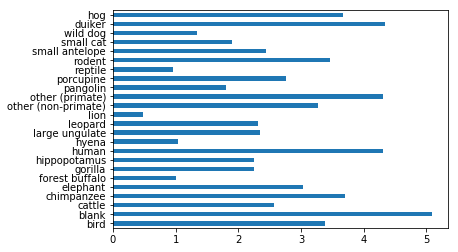

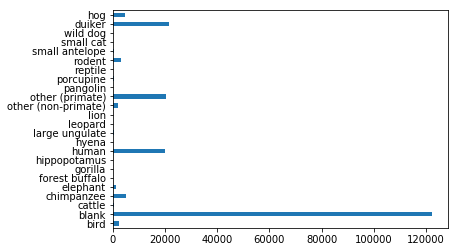

In [31]:
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt

df_train[ANIMALS].sum(axis=0).apply(lambda x : np.log10(x+1)).plot(kind='barh')
plt.show()
df_train[ANIMALS].sum(axis=0).apply(lambda x : x).plot(kind='barh')
plt.show()

In [34]:
len(df_train.filename.unique()),len(df_submit.filename.unique())

(204130, 87484)

In [48]:
annotation_list = list(df_train.filename.unique())
annotation_list.extend(df_submit.filename.unique())

In [49]:
annotation_list

291614

In [50]:
df_minus_files = set(filenames)-set(annotation_list)
files_minus_df = set(annotation_list) - set(filenames)

In [54]:
len(df_minus_files),len(files_minus_df)

(164388, 0)

## Extract animal name into a column for convenience

In [58]:
# only 375 videos with 2 animals
df_train[df_train.sum(axis=1)>1].shape

(374, 25)

In [2]:
df_train['animal'] = ''
df_train.loc[df_train.sum(axis=1)>1,'animal'] = '2 animals'

In [5]:
df_train.loc[df_train.sum(axis=1)==1, 'animal'] = df_train[df_train.sum(axis=1)==1][ANIMALS].idxmax(axis=1)

In [6]:
df_train[df_train.animal == 'leopard']

,filename,bird,blank,cattle,chimpanzee,elephant,forest buffalo,gorilla,hippopotamus,human,...,pangolin,porcupine,reptile,rodent,small antelope,small cat,wild dog,duiker,hog,animal
621,0BAXu18xcf.mp4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,leopard
860,0GFVOpmeax.mp4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,leopard
1217,0N8B9H0JPU.mp4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,leopard
2950,0sIeFzacy1.mp4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,leopard
3217,0xTUwM4ZJI.mp4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,leopard
4013,1ClEBBJ03d.mp4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,leopard
7882,2O5ulRIIvz.mp4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,leopard
8389,2XR7alz1NF.mp4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,leopard
8949,2hxyETLDcU.mp4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,leopard
10829,3GREuPkaOh.mp4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,leopard


In [7]:
df_train.animal.value_counts()

blank                  122270
duiker                  21471
other (primate)         20198
human                   20000
chimpanzee               5019
hog                      4557
rodent                   2896
bird                     2217
other (non-primate)      1862
elephant                 1085
porcupine                 569
2 animals                 374
cattle                    372
small antelope            273
large ungulate            224
leopard                   209
hippopotamus              175
gorilla                   171
small cat                  79
pangolin                   63
wild dog                   21
hyena                      10
forest buffalo              9
reptile                     4
lion                        2
Name: animal, dtype: int64

## Classify video with PCA-like methods

### Play with moviepy

In [51]:
from IPython.display import FileLink

local_file = FileLink("../slow_max_space/raw/U4Df3Yns2f.mp4")
display(local_file)

/home/keras/notebook/slow_max_space/raw/U4Df3Yns2f.mp4

In [50]:
import moviepy.editor as mpe

animal = 'leopard'
video_id = df_train[df_train.animal == animal].sample(n=1).filename.values[0]
video = mpe.VideoFileClip("micro_chimps/micro/{}".format(video_id))

print(video_id)

video.ipython_display(width=256)


 97%|█████████▋| 30/31 [00:00<00:00, 620.08it/s]

U4Df3Yns2f.mp4


In [ ]:
import moviepy.editor as mpe

In [113]:
import scipy as scipy
def create_data_matrix_from_video(clip, k=5, scale=64):
    return np.vstack([scipy.misc.imresize(rgb2gray(clip.get_frame(i/float(k))).astype(int), 
                      scale).flatten() for i in range(k * int(clip.duration))]).T

In [115]:
def rgb2gray(rgb):
    return np.dot(rgb[...,:3], [0.299, 0.587, 0.114])

In [184]:
video.get_frame

15.0

In [177]:
video.get_frame(500).shape

(64, 64, 3)

In [185]:
scale = 100   # Adjust scale to change resolution of image
dims = (int(64 * (scale/100)), int(64 * (scale/100)))

M = create_data_matrix_from_video(video, 25, scale)

In [186]:
dims

(64, 64)

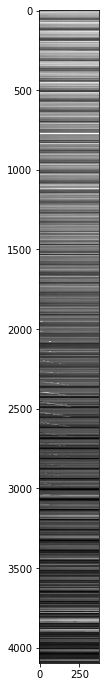

In [188]:
plt.figure(figsize=(12, 12))
plt.imshow(M, cmap='gray')

In [187]:
M.shape

(4096, 375)

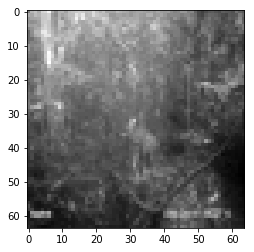

In [194]:
plt.imshow(np.reshape(M[:,70], dims), cmap='gray')

### Play with various methods of matrix decomposition

~1s to factorize 1 64x64 video, with 200k videos = 2 days just for factorization

In [195]:
from sklearn import decomposition

scale = 100   # Adjust scale to change resolution of image
dims = (int(64 * (scale/100)), int(64 * (scale/100)))

M = create_data_matrix_from_video(video, 100, scale)

u, s, v = decomposition.randomized_svd(M, 2)
low_rank = u @ np.diag(s) @ v

In [140]:
u.shape, s.shape, v.shape

((1600, 2), (2,), (2, 1500))

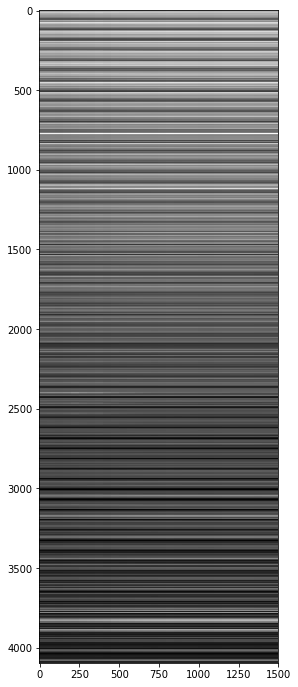

In [162]:
low_rank = u @ np.diag(s) @ v
plt.figure(figsize=(12, 12))
plt.imshow(low_rank, cmap='gray')

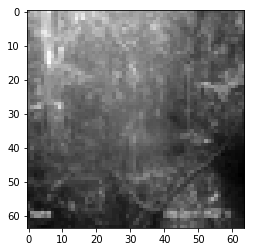

In [196]:
plt.imshow(np.reshape(low_rank[:,70], dims), cmap='gray')

### Robust PCA

In [ ]:
from tensorly.decomposition import robust_pca
low_rank_part, sparse_part = robust_pca(X, reg_E=0.01, learning_rate=1.2, n_iter_max=50)

### Incremental PCA on the subset of videos

In [11]:
import moviepy.editor as mpe
import pandas as pd



ANIMALS_SUBSET = ['duiker','hog','other (primate)','human''chimpanzee','blank']

video_ids = df_train[df_train.animal.isin(ANIMALS_SUBSET)].sample(n=5000).filename.values


In [13]:
np.save('video_ids',  video_ids)


In [14]:
!ls -laht  video_ids.npy

-rw-r--r-- 1 keras users 117K Nov  5 07:48 video_ids.npy


In [9]:
video_ids[0]

'FWdiNLrVQY.mp4'

In [31]:
import numpy as np
import scipy

def rgb2gray(rgb):
    return np.dot(rgb[...,:3], [0.299, 0.587, 0.114])

def create_data_matrix_from_video(clip, k=5, scale=64):
    return np.vstack([scipy.misc.imresize(rgb2gray(clip.get_frame(i/float(k))).astype(int), 
                      scale).flatten() for i in range(k * int(clip.duration))]).T


video_id = video_ids[0]
video = mpe.VideoFileClip("micro_chimps/micro/{}".format(video_id))
M = create_data_matrix_from_video(video, 2, 100)
M.shape

(4096, 30)

In [28]:
4096 * 15 * 2

122880

In [27]:
1600 * 30

48000

In [26]:
M.shape

(1600, 30)

In [10]:
import gc

del X
gc.collect()

511

In [15]:
import gc

del X
gc.collect()

183

In [16]:
import numpy as np
from sklearn.decomposition import IncrementalPCA
import tqdm 
import scipy

X = np.zeros((5000, 4096 * 15 * 2))

counter = 0

def rgb2gray(rgb):
    return np.dot(rgb[...,:3], [0.299, 0.587, 0.114])

def create_data_matrix_from_video(clip, k=25, scale=64):
    return np.vstack([scipy.misc.imresize(rgb2gray(clip.get_frame(i/float(k))).astype(int), 
                      scale).flatten() for i in range(k * int(clip.duration))]).T


with tqdm.tqdm(total=len(video_ids)) as pbar:

        
    for video_id in video_ids:
        video = mpe.VideoFileClip("micro_chimps/micro/{}".format(video_id))
        M = create_data_matrix_from_video(video, 2, 100)
        X[counter,...] = M.reshape(1,-1)
        counter += 1
        
        pbar.update(1)    
    #if counter > 0:
    #    break



100%|██████████| 5000/5000 [10:50<00:00,  7.78it/s]


In [23]:
np.save('vids_processed_pca',X)

In [ ]:
!ls *.npy

In [17]:
np.save('vids_processed_pca_1',X)

In [3]:
X[9743,0:100]

array([ 0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
        0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
        0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
        0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
        0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
        0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
        0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
        0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.])

In [8]:
X.shape

(10000, 122880)

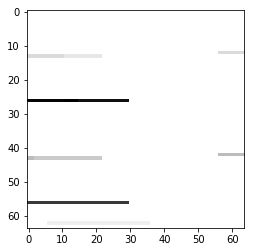

In [10]:
import matplotlib.pyplot as plt

plt.imshow(np.reshape(X[0,4096:4096*2], (64,64)), cmap='gray')
plt.show()

In [18]:
from sklearn.decomposition import IncrementalPCA
import numpy as np
import gc

X = np.load('vids_processed_pca_1.npy')
ipca = IncrementalPCA(n_components=2, batch_size=100)   
ipca.fit(X)
components = ipca.transform(X) 
np.save('components',components)
components.shape

(5000, 2)

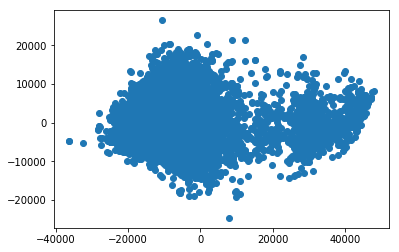

In [19]:
import matplotlib.pyplot as plt

plt.scatter(components[:,0], components[:,1])
plt.show()

In [21]:
components[:,0].shape

(5000,)

In [22]:
df_explore = pd.DataFrame()
df_explore['video_id'] = video_ids
df_explore['pc1'] = components[:,0]
df_explore['pc2'] = components[:,1]

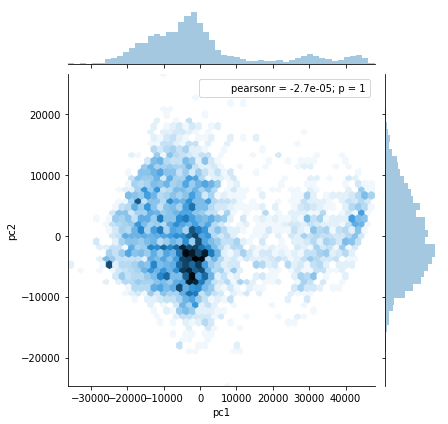

In [35]:
import seaborn as sns
g = sns.jointplot("pc1", "pc2", data=df_explore, kind="hex")
plt.show()

In [43]:
import moviepy.editor as mpe

video_id = df_explore[(df_explore.pc1.between(-6000,-5000)) & (df_explore.pc2.between(-5500,-5000))].sample(n=1).video_id.values[0]
video = mpe.VideoFileClip("micro_chimps/micro/{}".format(video_id))

video.ipython_display(width=256)


 97%|█████████▋| 30/31 [00:00<00:00, 587.06it/s]


In [40]:
import moviepy.editor as mpe

video_id = df_explore[(df_explore.pc1.between(35000,40000)) & (df_explore.pc2.between(-500,500))].sample(n=1).video_id.values[0]
video = mpe.VideoFileClip("micro_chimps/micro/{}".format(video_id))

video.ipython_display(width=256)


 97%|█████████▋| 30/31 [00:00<00:00, 559.31it/s]


In [44]:
import moviepy.editor as mpe

video_id = df_explore[(df_explore.pc1.between(25000,30000)) & (df_explore.pc2.between(-500,500))].sample(n=1).video_id.values[0]
video = mpe.VideoFileClip("micro_chimps/micro/{}".format(video_id))

video.ipython_display(width=256)


 97%|█████████▋| 30/31 [00:00<00:00, 714.67it/s]


In [48]:
import moviepy.editor as mpe

video_id = df_explore[(df_explore.pc1.between(-25000,-20000)) & (df_explore.pc2.between(-5500,-5000))].sample(n=1).video_id.values[0]
video = mpe.VideoFileClip("micro_chimps/micro/{}".format(video_id))

video.ipython_display(width=256)


 97%|█████████▋| 30/31 [00:00<00:00, 659.14it/s]


# Basic motion detector for images

In [75]:
import moviepy.editor as mpe
import pandas as pd

ANIMALS_SUBSET = ['duiker','hog','other (primate)','human''chimpanzee']
video_ids = df_train[df_train.animal.isin(ANIMALS_SUBSET)].sample(n=5000).filename.values

NameError: name 'df_train' is not defined

In [137]:
video_idx = 750
print( df_train[df_train.filename == video_ids[video_idx]].animal) 
video = mpe.VideoFileClip("micro_chimps/micro/{}".format(video_ids[video_idx]))
video.ipython_display(width=256)

  0%|          | 0/31 [00:00<?, ?it/s]

79219    other (primate)
Name: animal, dtype: object


 97%|█████████▋| 30/31 [00:00<00:00, 649.12it/s]


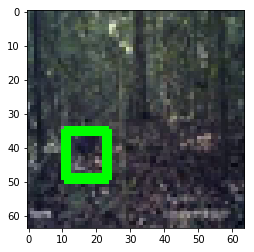

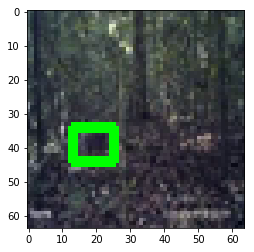

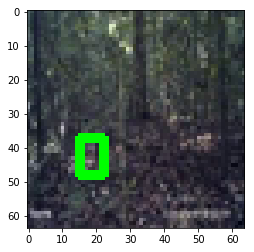

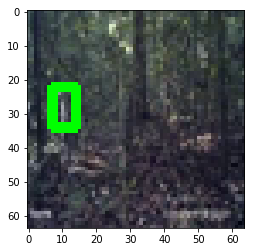

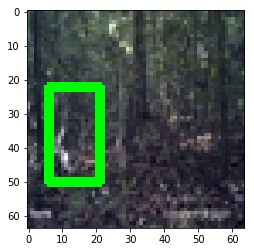

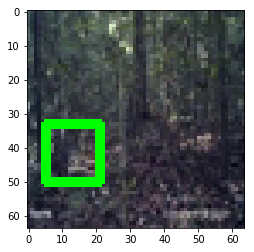

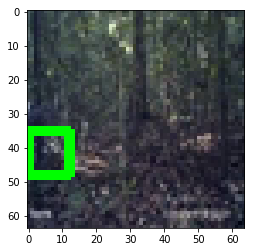

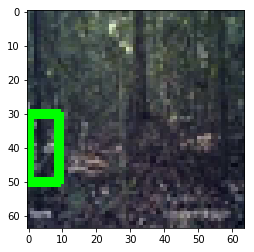

In [141]:
import imageio
import cv2

reader = imageio.get_reader("micro_chimps/micro/{}".format(video_ids[video_idx]))

min_area = 50
img_mean = np.zeros((64,64))
total_frames = 0

"""
for i, im in enumerate(reader):
    gray = cv2.cvtColor(im, cv2.COLOR_BGR2GRAY)
    gray = cv2.GaussianBlur(gray, (3, 3), 0)
    img_mean += gray
    total_frames += 1

img_mean *= (1/total_frames) 
img_mean = img_mean.astype('uint8')
plt.imshow(img_mean)
plt.show()    
""" 
lastFrame = None

for i, im in enumerate(reader):

    gray = cv2.cvtColor(im, cv2.COLOR_BGR2GRAY)
    gray = cv2.GaussianBlur(gray, (3, 3), 0)
    
    if lastFrame is None:
        lastFrame = gray

    # compute the absolute difference between the current frame and
    # first frame
    frameDelta = cv2.absdiff(lastFrame, gray)
    thresh = cv2.threshold(frameDelta, 25, 255, cv2.THRESH_BINARY)[1]
    
    # dilate the thresholded image to fill in holes, then find contours
    # on thresholded image
    thresh = cv2.dilate(thresh, None, iterations=2)

    im2, cnts, hierarchy  = cv2.findContours(thresh.copy(), cv2.RETR_EXTERNAL,cv2.CHAIN_APPROX_SIMPLE)

    # loop over the contours
    for c in cnts:
        # if the contour is too small, ignore it
        if cv2.contourArea(c) < min_area:
            continue

        # compute the bounding box for the contour, draw it on the frame,
        # and update the text
        (x, y, w, h) = cv2.boundingRect(c)

        plt.imshow(         cv2.rectangle(im, (x, y), (x + w, y + h), (0, 255, 0), 2) )
        plt.show()
    
    lastFrame = gray
    
    if i>30:
        break

In [128]:
for cnt in cnts:
    print(cv2.contourArea(cnt)) 

824.0


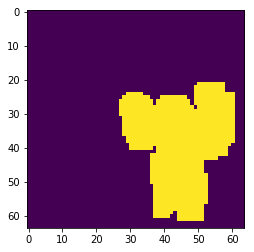

In [107]:
plt.imshow(im2)
plt.show()

In [ ]:
im2, cnts, hierarchy 

In [ ]:
import argparse
import datetime
import imutils
import time
import cv2

# resize the frame, convert it to grayscale, and blur it
frame = imutils.resize(frame, width=500)
gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
gray = cv2.GaussianBlur(gray, (21, 21), 0)

# if the first frame is None, initialize it
if firstFrame is None:
    firstFrame = gray
    continue

# Write a generator to take images from video 

blank                  122270
duiker                  21471
other (primate)         20198
human                   20000
chimpanzee               5019
hog                      4557
rodent                   2896
bird                     2217
other (non-primate)      1862
elephant                 1085
porcupine                 569
2 animals                 374
cattle                    372
small antelope            273
large ungulate            224
leopard                   209
hippopotamus              175
gorilla                   171
small cat                  79
pangolin                   63
wild dog                   21
hyena                      10
forest buffalo              9
reptile                     4
lion                        2

In [19]:
import pandas as pd
from sklearn.model_selection import train_test_split 
import gc

df_train = pd.read_csv('train.csv')
df_submit = pd.read_csv('submission.csv')

ANIMALS = ['bird', 'blank', 'cattle', 'chimpanzee', 'elephant',
       'forest buffalo', 'gorilla', 'hippopotamus', 'human', 'hyena',
       'large ungulate', 'leopard', 'lion', 'other (non-primate)',
       'other (primate)', 'pangolin', 'porcupine', 'reptile', 'rodent',
       'small antelope', 'small cat', 'wild dog', 'duiker', 'hog']

ANIMALS_SUBSET = ['duiker','hog','other (primate)','human''chimpanzee','blank']

df_train['animal'] = ''
df_train.loc[df_train.sum(axis=1)>1,'animal'] = '2 animals'
df_train.loc[df_train.sum(axis=1)==1, 'animal'] = df_train[df_train.sum(axis=1)==1][ANIMALS].idxmax(axis=1)


df_sample = pd.DataFrame()
df_sample = df_train[df_train.animal == 'blank'].sample(n=20000)
df_sample = df_sample.append(df_train[df_train.animal == 'duiker'])
df_sample = df_sample.append(df_train[df_train.animal == 'other (primate)'])
df_sample = df_sample.append(df_train[df_train.animal == 'human'])
df_sample = df_sample.append(df_train[df_train.animal == 'chimpanzee'])
df_sample = df_sample.append(df_train[df_train.animal == 'hog'])

train_vids, valid_vids = train_test_split(df_sample.filename.values, test_size=0.2, random_state=42, stratify = df_sample.animal.values)

video_2_animal_train = dict(zip(df_train[df_train.filename.isin(train_vids)].filename,df_train[df_train.filename.isin(train_vids)].animal))
video_2_animal_valid = dict(zip(df_train[df_train.filename.isin(valid_vids)].filename,df_train[df_train.filename.isin(valid_vids)].animal))


#del df_sample,df_train,df_submit
gc.collect()

170

In [3]:
import pandas as pd
from sklearn.model_selection import train_test_split 
import gc

df_train = pd.read_csv('train.csv')
df_submit = pd.read_csv('submission.csv')

ANIMALS = ['bird', 'blank', 'cattle', 'chimpanzee', 'elephant',
       'forest buffalo', 'gorilla', 'hippopotamus', 'human', 'hyena',
       'large ungulate', 'leopard', 'lion', 'other (non-primate)',
       'other (primate)', 'pangolin', 'porcupine', 'reptile', 'rodent',
       'small antelope', 'small cat', 'wild dog', 'duiker', 'hog']

ANIMALS_SUBSET = ['duiker','hog','other (primate)','human''chimpanzee','blank']

df_train['animal'] = ''
df_train.loc[df_train.sum(axis=1)>1,'animal'] = '2 animals'
df_train.loc[df_train.sum(axis=1)==1, 'animal'] = df_train[df_train.sum(axis=1)==1][ANIMALS].idxmax(axis=1)

df_sample = pd.DataFrame()

# just take the dataset as is
for animal in ANIMALS:
    df_sample = df_sample.append(df_train[df_train.animal == animal])

train_vids, valid_vids = train_test_split(df_sample.filename.values, test_size=0.2, random_state=42, stratify = df_sample.animal.values)
video_2_animal_train = dict(zip(df_train[df_train.filename.isin(train_vids)].filename,df_train[df_train.filename.isin(train_vids)].animal))
video_2_animal_valid = dict(zip(df_train[df_train.filename.isin(valid_vids)].filename,df_train[df_train.filename.isin(valid_vids)].animal))

#del df_sample,df_train,df_submit
gc.collect()

55

In [5]:
df_train.shape

(204130, 26)

In [4]:
df_sample.shape

(203756, 26)

In [20]:
train_vids, valid_vids = train_test_split(df_sample.filename.values, test_size=0.2, random_state=42, stratify = df_sample.animal.values)

In [92]:
df_sample.animal.value_counts()

duiker             21471
other (primate)    20198
blank              20000
human              20000
chimpanzee          5019
hog                 4557
Name: animal, dtype: int64

array(['fMypGlwlL3.mp4', '3GYOZJP9Az.mp4', 'z5td9mFQeI.mp4', ...,
       'ww6ROxwPdm.mp4', 'OHLH00BWje.mp4', 'gAGQc5HaFX.mp4'], dtype=object)

In [103]:
len(video_2_animal_valid)

18249

In [7]:
for key,value in video_2_animal.items():
    print (key,value)
    break

g9rA2U25UX.mp4 other (primate)


In [33]:
import imageio
import numpy as np 
from random import randint

video_id = 'g9rA2U25UX.mp4'
reader = imageio.get_reader("micro_chimps/micro/{}".format(video_id))

video_matrix = None

def gallery(array, ncols=5):
    nindex, height, width, intensity = array.shape
    nrows = nindex//ncols
    assert nindex == nrows*ncols
    # want result.shape = (height*nrows, width*ncols, intensity)
    result = (array.reshape(nrows, ncols, height, width, intensity)
              .swapaxes(1,2)
              .reshape(height*nrows, width*ncols, intensity))
    return result

for i, im in enumerate(reader):
    if video_matrix is None:
        video_matrix = im
    else:
        video_matrix = np.vstack((video_matrix,im))
        
video_matrix = video_matrix.reshape(30,64,64,3)   

# select 25 frames at random
start = randint(0, 5)
video_matrix = video_matrix[start:start+25]
# reshape all the frames of one video into 5*5 grid
video_matrix = gallery(video_matrix)

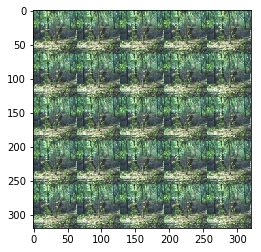

In [34]:
plt.imshow(video_matrix)
plt.show()

In [44]:
list(video_2_animal.keys())[0]

'g9rA2U25UX.mp4'

In [52]:
idx_2_value

{'2 animals': 1,
 'bird': 5,
 'blank': 7,
 'cattle': 6,
 'chimpanzee': 9,
 'duiker': 11,
 'elephant': 19,
 'forest buffalo': 10,
 'gorilla': 3,
 'hippopotamus': 13,
 'hog': 23,
 'human': 20,
 'hyena': 22,
 'large ungulate': 15,
 'leopard': 24,
 'lion': 4,
 'other (non-primate)': 18,
 'other (primate)': 12,
 'pangolin': 17,
 'porcupine': 8,
 'reptile': 0,
 'rodent': 21,
 'small antelope': 14,
 'small cat': 16,
 'wild dog': 2}

In [45]:
video_2_animal['g9rA2U25UX.mp4']

'other (primate)'

In [17]:
video_matrix_rs.shape

AttributeError: 'tuple' object has no attribute 'shape'

In [ ]:

def rgb2gray(rgb):
    return np.dot(rgb[...,:3], [0.299, 0.587, 0.114])


# with tqdm.tqdm(total=len(video_ids)) as pbar:

        
    for video_id in video_ids:
        video = mpe.VideoFileClip("micro_chimps/micro/{}".format(video_id))
        M = create_data_matrix_from_video(video, 2, 100)
        X[counter,...] = M.reshape(1,-1)
        counter += 1
        

def rgb2gray(rgb):
    return np.dot(rgb[...,:3], [0.299, 0.587, 0.114])

def create_data_matrix_from_video(clip, k=5, scale=64):
    return np.vstack([scipy.misc.imresize(rgb2gray(clip.get_frame(i/float(k))).astype(int), 
                      scale).flatten() for i in range(k * int(clip.duration))]).T


In [37]:
import os


'micro_chimps/micro/g9rA2U25UX.mp4'

In [38]:
!ls 'micro_chimps/micro/g9rA2U25UX.mp4'

micro_chimps/micro/g9rA2U25UX.mp4


In [106]:
import torch
import torch.utils.data as data
import torchvision.transforms as transforms
# from PIL import Image, ImageDraw, ImageFont
import cv2
import imageio
import numpy as np 
from random import randint
import os

def gallery(array, ncols=5):
    nindex, height, width, intensity = array.shape
    nrows = nindex//ncols
    assert nindex == nrows*ncols
    # want result.shape = (height*nrows, width*ncols, intensity)
    result = (array.reshape(nrows, ncols, height, width, intensity)
              .swapaxes(1,2)
              .reshape(height*nrows, width*ncols, intensity))
    return result

class JungleDatasetVideo(data.Dataset):
    def __init__(self,
                 root,
                 video_dict,
                 transform=None,
                 dataset_name='micro_chimps'):
        self.root = root
        self.video_dict = video_dict
        self.transform = transform
        self.name = dataset_name
        self.video_ids = list(self.video_dict.keys())
        
        unique_values = list(set([x for x in self.video_dict.values()]))
        self.idx_2_value = {i:value for i,value in enumerate(unique_values) }
        self.value_2_idx = {value:i for i,value in enumerate(unique_values) }
        del unique_values

    def __getitem__(self, index):
        video_id = self.video_ids[index]
        reader = imageio.get_reader(os.path.join(self.root, video_id))
        video_matrix = None
                                    
        for i, im in enumerate(reader):
            if video_matrix is None:
                video_matrix = im
            else:
                video_matrix = np.vstack((video_matrix,im))
        video_matrix = video_matrix.reshape(30,64,64,3)   
        # select 25 frames at random
        start = randint(0, 5)
        video_matrix = video_matrix[start:start+25]
        # reshape all the frames of one video into 5*5 grid
        video_matrix = gallery(video_matrix)
        # one hot encode the class output
        gt = self.value_2_idx[self.video_dict[video_id]]

        if self.transform is not None:
            video_matrix = self.transform(video_matrix)
        return video_matrix, gt

    def __len__(self):
        return len(self.video_ids)





In [1]:
from JungleDataset import JungleDatasetVideo
from CustomAugmentation import CustomAugmentation

In [11]:
from JungleDataset import JungleDatasetVideo
from CustomAugmentation import CustomAugmentation

jungleDataset = JungleDatasetVideo(root = 'micro_chimps/micro',
                 video_dict = video_2_animal_train,
                 transform=CustomAugmentation(size=299, crop=299),
                 dataset_name='micro_chimps')

In [12]:
img,gt = jungleDataset.__getitem__(0)

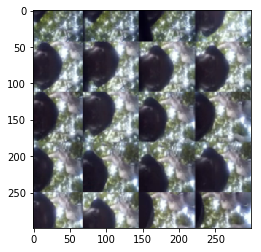

In [13]:
import matplotlib.pyplot as plt
import numpy as np

img = img.cpu().numpy().astype(np.float32).transpose((1, 2, 0))
img += -img.min()
img *= (1/img.max())

plt.imshow(img)
plt.show()

In [109]:
video_matrix, gt = jungleDataset.__getitem__(1)

In [79]:
jungleDataset.video_ids[0]

'g9rA2U25UX.mp4'

In [80]:
video_2_animal['g9rA2U25UX.mp4']

'other (primate)'

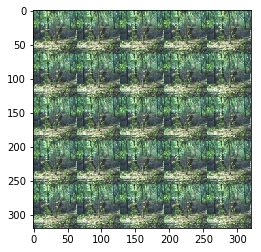

In [83]:
import argparse
import os
import shutil
import time

import torch
import torch.nn as nn
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torch.optim
import torch.utils.data
import torchvision.transforms as transforms
import torchvision.datasets as datasets
import torchvision.models as models

from Inception4 import inceptionv4

In [85]:
inception = inceptionv4(pretrained=True)

Downloading: "https://s3.amazonaws.com/pytorch/models/inceptionv4-58153ba9.pth" to /home/keras/.torch/models/inceptionv4-58153ba9.pth
100%|██████████| 171130880/171130880 [05:50<00:00, 488384.22it/s] 


In [86]:
class FineTuneModel(nn.Module):
    def __init__(self,
                 original_model,
                 arch,
                 num_classes,
                 freeze):
        super(FineTuneModel, self).__init__()

        if arch.startswith('alexnet') :
            self.features = original_model.features
            self.classifier = nn.Sequential(
                nn.Dropout(),
                nn.Linear(256 * 6 * 6, 4096),
                nn.ReLU(inplace=True),
                nn.Dropout(),
                nn.Linear(4096, 4096),
                nn.ReLU(inplace=True),
                nn.Linear(4096, num_classes),
            )
            self.modelName = 'alexnet'
        elif arch.startswith('resnet') :
            # Everything except the last linear layer
            self.features = nn.Sequential(*list(original_model.children())[:-1])
            self.classifier = nn.Sequential(
                nn.Linear(512, num_classes)
            )
            self.modelName = 'resnet'
        elif arch.startswith('vgg16'):
            self.features = original_model.features
            self.classifier = nn.Sequential(
                nn.Dropout(),
                nn.Linear(25088, 4096),
                nn.ReLU(inplace=True),
                nn.Dropout(),
                nn.Linear(4096, 4096),
                nn.ReLU(inplace=True),
                nn.Linear(4096, num_classes),
            )
            self.modelName = 'vgg16'
        elif arch.startswith('inception4'):
            self.features = original_model.features
            self.classifier = nn.Sequential(
                nn.Dropout(),
                nn.Linear(1536, 1536),
                nn.ReLU(inplace=True),
                nn.Dropout(),
                nn.Linear(1536, 1536),
                nn.ReLU(inplace=True),
                nn.Linear(1536, num_classes),
            )
            self.modelName = 'vgg16'            
        else :
            raise("Finetuning not supported on this architecture yet")

        # Freeze those weights
        if freeze == True:
            for p in self.features.parameters():
                p.requires_grad = False


In [88]:
model = FineTuneModel(inception, 'inception4', 4,False)

In [ ]:
python3 finetune_inception4.py --arch inception4 --workers 4 --epochs 50 --start-epoch 0 --batch-size 1024 --lr 1e-4 --print-freq 10 --lognumber inception4 micro_chimps/micro

In [89]:
model

FineTuneModel (
  (features): Sequential (
    (0): BasicConv2d (
      (conv): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), bias=False)
      (bn): BatchNorm2d(32, eps=0.001, momentum=0, affine=True)
      (relu): ReLU (inplace)
    )
    (1): BasicConv2d (
      (conv): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), bias=False)
      (bn): BatchNorm2d(32, eps=0.001, momentum=0, affine=True)
      (relu): ReLU (inplace)
    )
    (2): BasicConv2d (
      (conv): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn): BatchNorm2d(64, eps=0.001, momentum=0, affine=True)
      (relu): ReLU (inplace)
    )
    (3): Mixed_3a (
      (maxpool): MaxPool2d (size=(3, 3), stride=(2, 2), dilation=(1, 1))
      (conv): BasicConv2d (
        (conv): Conv2d(64, 96, kernel_size=(3, 3), stride=(2, 2), bias=False)
        (bn): BatchNorm2d(96, eps=0.001, momentum=0, affine=True)
        (relu): ReLU (inplace)
      )
    )
    (4): Mixed_4a (
      (block0): Se

# Predict script

## Test

In [2]:
import pandas as pd

df_submit = pd.read_csv('submission.csv')


In [33]:
import pandas as pd

def get_predict_videos():
    df_submit = pd.read_csv('submission.csv')
    predict_dict = dict(zip(list(df_submit.filename.values),['all_animals'] * len(list(df_submit.filename.values)) ))
    return predict_dict


predict_dict = get_predict_videos()
df_predict = pd.DataFrame(list(predict_dict.items()))
df_predict.to_csv('df_predict.csv')

In [32]:
df_predict[-10:]

,0,1
87474,NGyt9GzSyV.mp4,all_animals
87475,PCbIujo0RU.mp4,all_animals
87476,426nCI4bf2.mp4,all_animals
87477,OL3QBDzAcj.mp4,all_animals
87478,eAKGiWyYef.mp4,all_animals
87479,6ZtZHWTfqh.mp4,all_animals
87480,2pvKZo7HWQ.mp4,all_animals
87481,V8FNzGKdLm.mp4,all_animals
87482,ZL8RPYOPgI.mp4,all_animals
87483,ZeZPboj0wH.mp4,all_animals


In [19]:
import torch.utils.data
from JungleDataset import JungleDatasetVideo
from CustomAugmentation import CustomAugmentation,ValidAugmentation   

dataset = JungleDatasetVideo(root = 'micro_chimps/micro/',
                   video_dict = predict_dict,
                   transform = ValidAugmentation(size=224, crop=224),
                   dataset_name='predict_chimps')

In [31]:
dataset.video_ids[-10:]

['NGyt9GzSyV.mp4',
 'PCbIujo0RU.mp4',
 '426nCI4bf2.mp4',
 'OL3QBDzAcj.mp4',
 'eAKGiWyYef.mp4',
 '6ZtZHWTfqh.mp4',
 '2pvKZo7HWQ.mp4',
 'V8FNzGKdLm.mp4',
 'ZL8RPYOPgI.mp4',
 'ZeZPboj0wH.mp4']

In [ ]:
1+1

In [34]:
import torch.utils.data
from JungleDataset import JungleDatasetVideo
from CustomAugmentation import CustomAugmentation,ValidAugmentation

predict_loader = torch.utils.data.DataLoader(
    JungleDatasetVideo(root = 'micro_chimps/micro/',
                   video_dict = predict_dict,
                   transform = ValidAugmentation(size=224, crop=224),
                   dataset_name='predict_chimps'),
    batch_size=32,
    shuffle=False,
    num_workers=4,
    pin_memory=True)

In [1]:
# standard pytorch imports
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torch.distributed as dist
import torch.optim
import torch.utils.data
import torch.utils.data.distributed
import torchvision.transforms as transforms
import torchvision.datasets as datasets
import torchvision.models as models

# standard ds and os tools
import pandas as pd
import numpy as np
import tqdm
import os

# custom written classes
from JungleDataset import JungleDatasetVideo
from CustomAugmentation import CustomAugmentation,ValidAugmentation
from FineTuneModel import FineTuneModel

# stupid hack - add params instead of doing a proper CLI parsing
# also works with jupyter notebooks
args = type('test', (), {})()
args.finetune = True
args.resume = 'weights/vgg16_augs_best.pth.tar'
args.batch_size = 128
args.workers = 12
args.lognumber = 'vgg16_augs'
args.numclasses = 6
args.arch = 'vgg16'
args.evaluate = False

def get_predict_videos():
    df_submit = pd.read_csv('submission.csv')
    predict_dict = dict(zip(list(df_submit.filename.values),['all_animals'] * len(list(df_submit.filename.values)) ))
    return predict_dict
predict_dict = get_predict_videos()
df_predict = pd.DataFrame(list(predict_dict.items()))
df_predict.to_csv('df_predict.csv')

# create model
if args.finetune:
    print("=> using pre-trained model '{}'".format(args.arch))
    original_model = models.__dict__[args.arch](pretrained=True)
    # original_model = inceptionv4(pretrained=True)
    model = FineTuneModel(original_model, args.arch, args.numclasses,False)
else:
    print("=> creating model '{}'".format(args.arch))
    model = models.__dict__[args.arch]()
if args.arch.startswith('alexnet') or args.arch.startswith('vgg'):
    model.features = torch.nn.DataParallel(model.features)
    model.cuda()
else:
    model = torch.nn.DataParallel(model).cuda()

# optionally resume from a checkpoint
if args.resume:
    if os.path.isfile(args.resume):
        print("=> loading checkpoint '{}'".format(args.resume))
        checkpoint = torch.load(args.resume)
        args.start_epoch = checkpoint['epoch']
        best_prec1 = checkpoint['best_prec1']
        model.load_state_dict(checkpoint['state_dict'])
        print("=> loaded checkpoint '{}' (epoch {})".format(args.evaluate, checkpoint['epoch']))
    else:
        print("=> no checkpoint found at '{}'".format(args.resume))

cudnn.benchmark = True    
print('Total dictionary length is {}'.format( len(predict_dict) ) )

predict_folder = JungleDatasetVideo(root = 'micro_chimps/micro/',
                   video_dict = predict_dict,
                   transform = ValidAugmentation(size=224, crop=224),
                   dataset_name='predict_chimps')
    
predict_loader = torch.utils.data.DataLoader(
    dataset = predict_folder,
    batch_size=args.batch_size,
    shuffle=False,
    num_workers=args.workers,
    pin_memory=True)

print('Total predict folder length is {}'.format( len(predict_folder) ) )

def predict(predict_loader,
            model,
            iter_number,
            data):
    # switch to evaluate mode
    model.eval()
    pointer = 0 
    with tqdm.tqdm(total=iter_number) as pbar:
        for i, (input, target) in enumerate(predict_loader):
            # target = target.cuda(async=True)
            input_var = torch.autograd.Variable(input, volatile=True)
            # target_var = torch.autograd.Variable(target, volatile=True)
            # compute output
            output = model(input_var)
            
            data[pointer:pointer+input_var.size()[0], ...] = output.data.cpu().numpy()
            # For treating last batch properly
            pointer = pointer + input.size()[0]
            pbar.update(1)
            # Save every 1000 batches
            if (i+1)%100==0:
                print('Save triggered')
                np.save(args.lognumber,data)
            if i > 0:
                break

iter_number = len(predict_folder)
data = np.zeros((iter_number, args.numclasses), dtype=np.float32)
predict(predict_loader,
        model,
        len(predict_loader),
        data)
np.save(args.lognumber,data)



=> using pre-trained model 'vgg16'
=> loading checkpoint 'weights/vgg16_augs_best.pth.tar'


  0%|          | 0/684 [00:00<?, ?it/s]

=> loaded checkpoint 'False' (epoch 23)
Total dictionary length is 87484
Total predict folder length is 87484


  0%|          | 2/684 [00:40<5:22:22, 28.36s/it]


In [9]:
data[255]


array([ 1.08795345, -2.85127211,  4.78341484, -5.55305147,  1.00388193,
        1.54927886], dtype=float32)

In [14]:
128*12

1536

In [22]:
data = np.empty((iter_number, args.numclasses), dtype=np.float32)

In [26]:
data[-2]

array([ 0.,  0.,  0.,  0.,  0.,  0.], dtype=float32)

## Test

In [49]:
def get_train_videos():
    df_train = pd.read_csv('train.csv')
    predict_dict = dict(zip(list(df_train.filename.values),['all_animals'] * len(list(df_train.filename.values)) ))
    return predict_dict

predict_dict = get_train_videos()
df_predict = pd.DataFrame(list(predict_dict.items()))
df_predict.to_csv('df_predict_train.csv')

In [50]:
df_predict

,0,1
0,gNE1XhrD3j.mp4,all_animals
1,eMrDFdUyRS.mp4,all_animals
2,oZjUHtBD1e.mp4,all_animals
3,aiJW0i1NMM.mp4,all_animals
4,dnjc9jc1EW.mp4,all_animals
5,qVzfwV82OK.mp4,all_animals
6,DiDo7Z9JoQ.mp4,all_animals
7,ZCtWc3dSHF.mp4,all_animals
8,cUnqHyNNzb.mp4,all_animals
9,gr2OMnSvyy.mp4,all_animals


# Clean up predictions and prepare to submit

## Basic preparation

In [35]:
!ls -laht | head

total 21G
drwxrwxrwx 10  1001  1001 4.0K Nov 13 07:04 .
-rw-r--r--  1 keras users  14M Nov 13 07:04 jungle.ipynb
-rw-r--r--  1 root  root  7.7M Nov 13 07:04 vgg_16_best_test.npy
-rw-r--r--  1 keras users 2.8M Nov 13 06:31 df_predict.csv
-rw-r--r--  1 keras users 4.1K Nov 13 06:31 predict_64.py
-rw-r--r--  1 keras users 5.4K Nov 13 06:30 predict_train.py
-rw-r--r--  1 root  root  3.6M Nov 13 06:28 resnet50.npy
-rw-r--r--  1 root  root  1.3M Nov 13 06:13 resnet50_train.csv
-rw-r--r--  1 root  root  3.6M Nov 13 06:08 vgg16_best.npy


In [117]:
# check the class succession in the custom generator for good measure

import pandas as pd
from JungleDataset import JungleDatasetVideo
from CustomAugmentation import CustomAugmentation,ValidAugmentation

def train_test_split():
    from sklearn.model_selection import train_test_split     
    df_train = pd.read_csv('train.csv')
    df_submit = pd.read_csv('submission.csv')

    # remove lion
    ANIMALS = ['bird', 'blank', 'cattle', 'chimpanzee', 'elephant',
           'forest buffalo', 'gorilla', 'hippopotamus', 'human', 'hyena',
           'large ungulate', 'leopard',  'other (non-primate)',
           'other (primate)', 'pangolin', 'porcupine', 'reptile', 'rodent',
           'small antelope', 'small cat', 'wild dog', 'duiker', 'hog']

    ANIMALS_SUBSET = ['duiker','hog','other (primate)','human''chimpanzee','blank']

    df_train['animal'] = ''
    df_train.loc[df_train.sum(axis=1)>1,'animal'] = '2 animals'
    df_train.loc[df_train.sum(axis=1)==1, 'animal'] = df_train[df_train.sum(axis=1)==1][ANIMALS].idxmax(axis=1)


    df_sample = pd.DataFrame()

    # just take the dataset as is w/o any limitations
    for animal in ANIMALS:
        df_sample = df_sample.append(df_train[df_train.animal == animal])

    train_vids, valid_vids = train_test_split(df_sample.filename.values,
                                              test_size=0.2,
                                              random_state=42,
                                              stratify = df_sample.animal.values)

    video_2_animal_train = dict(zip(df_train[df_train.filename.isin(train_vids)].filename,df_train[df_train.filename.isin(train_vids)].animal))
    video_2_animal_valid = dict(zip(df_train[df_train.filename.isin(valid_vids)].filename,df_train[df_train.filename.isin(valid_vids)].animal))

    return video_2_animal_train,video_2_animal_valid

video_2_animal_train,video_2_animal_valid = train_test_split()
    
train_folder = JungleDatasetVideo(root = 'micro_chimps/micro/',
                       video_dict = video_2_animal_train,
                       transform=CustomAugmentation(size=224, crop=224),
                        dataset_name='micro_chimps')  

map_dict = train_folder.idx_2_value

['bird', 'blank', 'cattle', 'chimpanzee', 'duiker', 'elephant', 'forest buffalo', 'gorilla', 'hippopotamus', 'hog', 'human', 'hyena', 'large ungulate', 'leopard', 'other (non-primate)', 'other (primate)', 'pangolin', 'porcupine', 'reptile', 'rodent', 'small antelope', 'small cat', 'wild dog']


['human', 'gorilla', 'hog', 'other (non-primate)', 'pangolin', 'wild dog', 'cattle', 'small antelope', 'chimpanzee', 'duiker', 'reptile', 'hippopotamus', 'forest buffalo', 'blank', 'large ungulate', 'elephant', 'bird', 'lion', 'other (primate)', 'hyena', 'porcupine', 'leopard', 'rodent', 'small cat']

In [118]:
map_dict

{0: 'bird',
 1: 'blank',
 2: 'cattle',
 3: 'chimpanzee',
 4: 'duiker',
 5: 'elephant',
 6: 'forest buffalo',
 7: 'gorilla',
 8: 'hippopotamus',
 9: 'hog',
 10: 'human',
 11: 'hyena',
 12: 'large ungulate',
 13: 'leopard',
 14: 'other (non-primate)',
 15: 'other (primate)',
 16: 'pangolin',
 17: 'porcupine',
 18: 'reptile',
 19: 'rodent',
 20: 'small antelope',
 21: 'small cat',
 22: 'wild dog'}

In [32]:
preds.shape, df_submit.shape, df_predict.shape

((87484, 23), (87484, 24), (87484, 3))

In [46]:
df_predict = pd.read_csv('df_predict.csv')
df_submit = pd.read_csv('submission.csv')

In [47]:
df_submit[0:10]

,filename,bird,blank,cattle,chimpanzee,elephant,forest buffalo,gorilla,hippopotamus,human,...,other (primate),pangolin,porcupine,reptile,rodent,small antelope,small cat,wild dog,duiker,hog
0,001Ay6nkVD.mp4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,009Of0AOw7.mp4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,00BqeS6Kmm.mp4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,00L6LKgIh9.mp4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,00QNcIeaMT.mp4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5,00QsaMLbPW.mp4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
6,00WsHACCUm.mp4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
7,00XTOzsHav.mp4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
8,00XbLwBfXD.mp4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
9,00cte5GeiC.mp4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [64]:
df_predict[df_predict.filename == '00BqeS6Kmm.mp4']

,filename,class,bird_pred,blank_pred,cattle_pred,chimpanzee_pred,duiker_pred,elephant_pred,forest buffalo_pred,gorilla_pred,...,other (non-primate)_pred,other (primate)_pred,pangolin_pred,porcupine_pred,reptile_pred,rodent_pred,small antelope_pred,small cat_pred,wild dog_pred,lion_pred
17460,00BqeS6Kmm.mp4,all_animals,0.046005,0.646845,0.000077,0.017769,0.088297,0.002031,0.000155,0.000594,...,0.025446,0.045916,0.000652,0.002024,0.000032,0.080369,0.000468,0.003344,0.000176,0


In [54]:
df_submit.columns

Index(['filename', 'bird_x', 'blank_x', 'cattle_x', 'chimpanzee_x',
       'elephant_x', 'forest buffalo_x', 'gorilla_x', 'hippopotamus_x',
       'human_x', 'hyena_x', 'large ungulate_x', 'leopard_x', 'lion_x',
       'other (non-primate)_x', 'other (primate)_x', 'pangolin_x',
       'porcupine_x', 'reptile_x', 'rodent_x', 'small antelope_x',
       'small cat_x', 'wild dog_x', 'duiker_x', 'hog_x', 'bird_y', 'blank_y',
       'cattle_y', 'chimpanzee_y', 'elephant_y', 'forest buffalo_y',
       'gorilla_y', 'hippopotamus_y', 'human_y', 'hyena_y', 'large ungulate_y',
       'leopard_y', 'lion_y', 'other (non-primate)_y', 'other (primate)_y',
       'pangolin_y', 'porcupine_y', 'reptile_y', 'rodent_y',
       'small antelope_y', 'small cat_y', 'wild dog_y', 'duiker_y', 'hog_y'],
      dtype='object')

In [42]:
map_dict = {0: 'bird',
 1: 'blank',
 2: 'cattle',
 3: 'chimpanzee',
 4: 'duiker',
 5: 'elephant',
 6: 'forest buffalo',
 7: 'gorilla',
 8: 'hippopotamus',
 9: 'hog',
 10: 'human',
 11: 'hyena',
 12: 'large ungulate',
 13: 'leopard',
 14: 'other (non-primate)',
 15: 'other (primate)',
 16: 'pangolin',
 17: 'porcupine',
 18: 'reptile',
 19: 'rodent',
 20: 'small antelope',
 21: 'small cat',
 22: 'wild dog'}

In [43]:
import pandas as pd
import numpy as np
from torch.nn import Softmax
import torch

df_predict = pd.read_csv('df_predict.csv')
del df_predict['Unnamed: 0']
df_predict.columns = ['filename','class']

df_submit = pd.read_csv('submission.csv')
    
preds = np.load('vgg_16_best_test.npy')

m = Softmax()
preds = m(torch.from_numpy(preds)).data.numpy()

for key,value in map_dict.items():
    df_predict[value+'_pred'] = preds[:,key]

df_predict['lion_pred'] = 0.0000001

ANIMALS_PRED = [(animal+'_pred') for animal in ANIMALS]
df_submit = df_submit.merge(df_predict[ANIMALS_PRED+['filename']], how='left', on='filename')    

for animal in ANIMALS:
    df_submit[animal] = df_submit[animal+'_pred']
    del df_submit[animal+'_pred']
    
df_submit = df_submit.set_index('filename')   
   
# Round values
for column in ANIMALS:
    df_submit[column] = df_submit[column].round(2)
     

In [ ]:
import pandas as pd
import numpy as np
from torch.nn import Softmax
import torch

def prepare_submit(numpy_preds,logname):
    df_predict = pd.read_csv('df_predict.csv')
    del df_predict['Unnamed: 0']
    df_predict.columns = ['filename','class']

    df_submit = pd.read_csv('submission.csv')

    preds = np.load(numpy_preds)

    m = Softmax()
    preds = m(torch.from_numpy(preds)).data.numpy()

    for key,value in map_dict.items():
        df_predict[value+'_pred'] = preds[:,key]

    df_predict['lion_pred'] = 0.0000001

    ANIMALS_PRED = [(animal+'_pred') for animal in ANIMALS]
    df_submit = df_submit.merge(df_predict[ANIMALS_PRED+['filename']], how='left', on='filename')    

    for animal in ANIMALS:
        df_submit[animal] = df_submit[animal+'_pred']
        del df_submit[animal+'_pred']

    df_submit = df_submit.set_index('filename')   

    # Round values
    for column in ANIMALS:
        df_submit[column] = df_submit[column].round(2)

    df_submit = df_submit.clip(0.003,0.9)

    df_submit.to_csv('submissions/{}'.format(logname))

In [43]:
df_submit = pd.read_csv('submission.csv')


In [45]:
df_submit_check = pd.read_csv('lstm_reg_submit_train.csv')

In [49]:
set(df_submit_check['0']) - set(df_submit.filename)

set()

In [50]:
df_submit.head()

,filename,bird,blank,cattle,chimpanzee,elephant,forest buffalo,gorilla,hippopotamus,human,...,other (primate),pangolin,porcupine,reptile,rodent,small antelope,small cat,wild dog,duiker,hog
0,001Ay6nkVD.mp4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,009Of0AOw7.mp4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,00BqeS6Kmm.mp4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,00L6LKgIh9.mp4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,00QNcIeaMT.mp4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [46]:
df_submit_check.head()

,Unnamed: 0,0,1
0,0,Ks36s0XXFk.mp4,all_animals
1,1,LOHUo3Ntoj.mp4,all_animals
2,2,YZ09S71JDC.mp4,all_animals
3,3,nAPOLSM9c0.mp4,all_animals
4,4,Ku0fcqYKsJ.mp4,all_animals


In [44]:
df_submit = df_submit.clip(0.003,0.9)

In [45]:
from IPython.display import FileLink

df_submit.to_csv('submissions/vgg16_best.csv')
FileLink('submissions/vgg16_best.csv')

/home/keras/notebook/jungle/submissions/vgg16_best.csv

## Try various clipping techniques

In [76]:
for animal in ANIMALS:
    print (animal)
    print ( df_submit[pd.isnull(df_submit[animal])].shape )

bird
(0, 24)
blank
(0, 24)
cattle
(0, 24)
chimpanzee
(0, 24)
elephant
(0, 24)
forest buffalo
(0, 24)
gorilla
(0, 24)
hippopotamus
(0, 24)
human
(0, 24)
hyena
(0, 24)
large ungulate
(0, 24)
leopard
(0, 24)
lion
(0, 24)
other (non-primate)
(0, 24)
other (primate)
(0, 24)
pangolin
(0, 24)
porcupine
(0, 24)
reptile
(0, 24)
rodent
(0, 24)
small antelope
(0, 24)
small cat
(0, 24)
wild dog
(0, 24)
duiker
(0, 24)
hog
(0, 24)


In [69]:
!ls -laht submissions/

total 95M
-rw-r--r-- 1 keras users  17M Nov 10 04:47 vgg16_all_classes_round_2_order_clip.csv
drwxr-xr-x 2 keras users 4.0K Nov 10 04:47 .
drwxrwxrwx 9  1001  1001 4.0K Nov 10 04:45 ..
-rw-r--r-- 1 keras users  19M Nov 10 04:40 vgg16_all_classes_round_2_order.csv
-rw-r--r-- 1 keras users  15M Nov 10 04:15 vgg16_all_classes_round_2_clip.csv
-rw-r--r-- 1 keras users  20M Nov 10 04:01 vgg16_all_classes_round_2.csv
-rw-r--r-- 1 keras users  13M Nov  8 06:34 vgg16_6_classes_round_2_clip0595.csv
-rw-r--r-- 1 keras users  13M Nov  8 06:27 vgg16_6_classes_round_2.csv


In [ ]:
df_submit[]

In [68]:
from IPython.display import FileLink

FileLink('submissions/vgg16_all_classes_round_2_order_clip.csv')

/home/keras/notebook/jungle/submissions/vgg16_all_classes_round_2_order_clip.csv

In [28]:
df_predict.shape,df_submit.shape,preds.shape

((87484, 3), (87484, 25), (87484, 6))

In [13]:
map_dict

{0: 'blank',
 1: 'other (primate)',
 2: 'hog',
 3: 'chimpanzee',
 4: 'duiker',
 5: 'human'}

In [20]:
preds[0]

array([  1.10062212e-03,   2.53433282e-05,   9.19006705e-01,
         8.63332934e-06,   7.97896460e-02,   6.90299930e-05], dtype=float32)

In [43]:
df_submit[0:1]

,bird,blank,cattle,chimpanzee,elephant,forest buffalo,gorilla,hippopotamus,human,hyena,...,other (primate),pangolin,porcupine,reptile,rodent,small antelope,small cat,wild dog,duiker,hog
filename,,,,,,,,,,,,,,,,,,,,,
001Ay6nkVD.mp4,0.05,0.5,0.05,0.05,0.05,0.05,0.05,0.05,0.06,0.05,...,0.14,0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.18,0.05


In [44]:
0.71/24

0.029583333333333333

In [66]:
df_submit = df_submit.clip(0.01, 0.99)
df_submit

,bird,blank,cattle,chimpanzee,elephant,forest buffalo,gorilla,hippopotamus,human,hyena,...,other (primate),pangolin,porcupine,reptile,rodent,small antelope,small cat,wild dog,duiker,hog
filename,,,,,,,,,,,,,,,,,,,,,
001Ay6nkVD.mp4,0.01,0.05,0.01,0.02,0.38,0.01,0.01,0.01,0.47,0.01,...,0.01,0.01,0.01,0.01,0.01,0.01,0.01,0.01,0.01,0.01
009Of0AOw7.mp4,0.01,0.85,0.01,0.01,0.01,0.01,0.01,0.01,0.01,0.01,...,0.01,0.01,0.01,0.01,0.01,0.01,0.01,0.01,0.08,0.01
00BqeS6Kmm.mp4,0.05,0.65,0.01,0.02,0.01,0.01,0.01,0.01,0.03,0.01,...,0.05,0.01,0.01,0.01,0.08,0.01,0.01,0.01,0.09,0.01
00L6LKgIh9.mp4,0.01,0.71,0.01,0.08,0.01,0.01,0.01,0.01,0.04,0.01,...,0.12,0.01,0.01,0.01,0.01,0.01,0.01,0.01,0.02,0.01
00QNcIeaMT.mp4,0.11,0.11,0.01,0.15,0.01,0.01,0.01,0.01,0.08,0.01,...,0.38,0.01,0.01,0.01,0.02,0.01,0.01,0.01,0.10,0.01
00QsaMLbPW.mp4,0.01,0.71,0.01,0.01,0.01,0.01,0.01,0.01,0.02,0.01,...,0.04,0.01,0.01,0.01,0.01,0.01,0.01,0.01,0.17,0.01
00WsHACCUm.mp4,0.01,0.90,0.01,0.01,0.01,0.01,0.01,0.01,0.04,0.01,...,0.01,0.01,0.01,0.01,0.01,0.01,0.01,0.01,0.02,0.01
00XTOzsHav.mp4,0.01,0.26,0.01,0.02,0.01,0.01,0.01,0.01,0.02,0.01,...,0.67,0.01,0.01,0.01,0.01,0.01,0.01,0.01,0.01,0.01
00XbLwBfXD.mp4,0.01,0.98,0.01,0.01,0.01,0.01,0.01,0.01,0.01,0.01,...,0.01,0.01,0.01,0.01,0.01,0.01,0.01,0.01,0.01,0.01


In [40]:
df_submit.to_csv('submissions/vgg16_all_classes_round_2_clip.csv')

In [30]:
df_submit[['blank','other (primate)','hog','chimpanzee','duiker','human']]


,blank,other (primate),hog,chimpanzee,duiker,human
0,0.00,0.00,0.92,0.00,0.08,0.00
1,0.00,0.97,0.01,0.00,0.01,0.00
2,0.00,0.00,0.81,0.00,0.19,0.00
3,0.00,0.00,0.01,0.00,0.00,0.99
4,0.00,0.00,0.00,0.00,1.00,0.00
5,1.00,0.00,0.00,0.00,0.00,0.00
6,0.00,0.00,0.97,0.00,0.03,0.00
7,0.00,0.04,0.92,0.00,0.03,0.01
8,0.90,0.00,0.07,0.00,0.02,0.01
9,0.00,0.00,0.00,0.00,0.00,1.00


# Local validation

## Investigate local validation vs clipping

### Clipping boilerplate

In [7]:
import pandas as pd
import numpy as np
from torch.nn import Softmax
import torch

ANIMALS = ['bird', 'blank', 'cattle', 'chimpanzee', 'elephant',
           'forest buffalo', 'gorilla', 'hippopotamus', 'human', 'hyena',
           'large ungulate', 'leopard', 'lion', 'other (non-primate)',
           'other (primate)', 'pangolin', 'porcupine', 'reptile', 'rodent',
           'small antelope', 'small cat', 'wild dog', 'duiker', 'hog']
    
ANIMALS_PRED = [(animal+'_pred') for animal in ANIMALS if animal != 'lion']
map_dict = {0: 'bird',
     1: 'blank',
     2: 'cattle',
     3: 'chimpanzee',
     4: 'duiker',
     5: 'elephant',
     6: 'forest buffalo',
     7: 'gorilla',
     8: 'hippopotamus',
     9: 'hog',
     10: 'human',
     11: 'hyena',
     12: 'large ungulate',
     13: 'leopard',
     14: 'other (non-primate)',
     15: 'other (primate)',
     16: 'pangolin',
     17: 'porcupine',
     18: 'reptile',
     19: 'rodent',
     20: 'small antelope',
     21: 'small cat',
     22: 'wild dog'}

def local_valid_score(df_predict,lb,hb):
    df_predict_clip = df_predict.copy()
    df_predict_clip[ANIMALS_PRED] = df_predict_clip[ANIMALS_PRED].clip(lb, hb)
    from sklearn.metrics import log_loss

    total_loss = 0
    i = 0
    df_class_loss = pd.DataFrame(columns=['animal','class_loss','lb','hb'])
    
    for animal in ANIMALS:
        if animal != 'lion':
            class_loss = ( log_loss(y_true=df_predict_clip[animal].values, y_pred = df_predict_clip[animal+'_pred'].values ) ) 

            if class_loss > 0:
                total_loss = total_loss + class_loss

            df_class_loss.loc[i] = animal,class_loss,lb,hb
            i += 1

    return total_loss,total_loss/24,df_class_loss

def do_local_validation(predict_df, numpy_preds, train_df, lb,hb):

    df_predict = pd.read_csv(predict_df)
    del df_predict['Unnamed: 0']
    df_predict.columns = ['filename','class']
    preds = np.load(numpy_preds)
    gt = pd.read_csv(train_df)
    m = Softmax()

    ANIMALS = ['bird', 'blank', 'cattle', 'chimpanzee', 'elephant',
               'forest buffalo', 'gorilla', 'hippopotamus', 'human', 'hyena',
               'large ungulate', 'leopard', 'lion', 'other (non-primate)',
               'other (primate)', 'pangolin', 'porcupine', 'reptile', 'rodent',
               'small antelope', 'small cat', 'wild dog', 'duiker', 'hog']

    df_predict = df_predict.merge(gt[ANIMALS+['filename']], how='left', on='filename')
    preds = m(torch.from_numpy(preds)).data.numpy()

    for key,value in map_dict.items():
        df_predict[value+'_pred'] = preds[:,key]

    # Round values
    for column in ANIMALS:
        if column!='lion':
            df_predict[column+'_pred'] = df_predict[column+'_pred'].round(2)  
    
    total_loss,lb_loss,df_class_loss = (local_valid_score(df_predict,lb,hb))
    
    return total_loss,lb_loss,df_class_loss


   

In [8]:
!ls -laht *.npy 

-rw-r--r-- 1 root  root  3.6M Nov 23 02:11 blstm_full_reg_overfit.npy
-rw-r--r-- 1 root  root  3.6M Nov 23 02:09 lstm_full_seq_rmsprop_overfit.npy
-rw-r--r-- 1 root  root  3.6M Nov 23 02:09 lstm_full_seq_overfit.npy
-rw-r--r-- 1 root  root  3.6M Nov 23 02:08 blstm_reg_overfit.npy
-rw-r--r-- 1 root  root  3.6M Nov 23 02:07 lstm_reg_overfit.npy
-rw-r--r-- 1 root  root  3.6M Nov 23 02:05 blstm_full_reg.npy
-rw-r--r-- 1 root  root  3.6M Nov 23 02:04 lstm_full_seq_rmsprop.npy
-rw-r--r-- 1 root  root  3.6M Nov 23 02:01 lstm_full_seq.npy
-rw-r--r-- 1 root  root  3.6M Nov 23 02:01 blstm_reg.npy
-rw-r--r-- 1 root  root  3.6M Nov 23 02:00 lstm_reg.npy
-rw-r--r-- 1 root  root  7.7M Nov 13 07:04 vgg_16_best_test.npy
-rw-r--r-- 1 root  root  3.6M Nov 13 06:28 resnet50.npy
-rw-r--r-- 1 root  root  3.6M Nov 13 06:08 vgg16_best.npy
-rw-r--r-- 1 root  root  3.6M Nov 13 05:48 vgg19.npy
-rw-r--r-- 1 root  root  3.6M Nov 13 05:13 vgg16.npy
-rw-r--r-- 1 keras users 2.4G Nov 11 14:33 predictors_inception4.n

In [9]:
# VGG16 after freeze training, finetuning and add finetuning with lower augmentations

total_loss,lb_loss,df_class_loss = do_local_validation('vgg16_train.csv','vgg16.npy','train.csv',0.004,0.9)    
print('Total loss: {} \nAveraged loss (LB score): {} \n'. format(total_loss,lb_loss))

# print (df_class_loss.sort_values(by='class_loss',ascending=False))

Total loss: 1.2567755990311977 
Averaged loss (LB score): 0.05236564995963324 



In [29]:
# VGG19 after training

total_loss,lb_loss,df_class_loss = do_local_validation('vgg19_train.csv','vgg19.npy','train.csv',0.004,0.9)    
print('Total loss: {} \nAveraged loss (LB score): {} \n'. format(total_loss,lb_loss))

Total loss: 1.2303770002404857 
Averaged loss (LB score): 0.05126570834335357 



In [37]:
# VGG16 - freeze layers, train, then finetune
# Also 0.045 when you do the best fine-tuning

total_loss,lb_loss,df_class_loss = do_local_validation('vgg16_best_train.csv','vgg16_best.npy','train.csv',0.003,0.9)    
print('Total loss: {} \nAveraged loss (LB score): {} \n'. format(total_loss,lb_loss))

Total loss: 1.0894254299184785 
Averaged loss (LB score): 0.04539272624660327 



In [42]:
# Resnet50 - just ft with a low lr

total_loss,lb_loss,df_class_loss = do_local_validation('resnet50_train.csv','resnet50.npy','train.csv',0.003,0.9)    
print('Total loss: {} \nAveraged loss (LB score): {} \n'. format(total_loss,lb_loss))

Total loss: 1.353379205628084 
Averaged loss (LB score): 0.0563908002345035 



In [41]:
# Lstm full rez models best epochs

total_loss,lb_loss,df_class_loss = do_local_validation('lstm_reg_train.csv','lstm_reg.npy','train.csv',0.003,0.99)    
print('Total loss: {} \nAveraged loss (LB score): {} \n'. format(total_loss,lb_loss))

total_loss,lb_loss,df_class_loss = do_local_validation('blstm_reg_train.csv','blstm_reg.npy','train.csv',0.003,0.99)    
print('Total loss: {} \nAveraged loss (LB score): {} \n'. format(total_loss,lb_loss))

total_loss,lb_loss,df_class_loss = do_local_validation('lstm_full_seq_train.csv','lstm_full_seq.npy','train.csv',0.003,0.99)    
print('Total loss: {} \nAveraged loss (LB score): {} \n'. format(total_loss,lb_loss))

# total_loss,lb_loss,df_class_loss = do_local_validation('lstm_full_seq_rmsprop_train.csv','lstm_full_seq_rmsprop.npy','train.csv',0.003,0.9)    
# print('Total loss: {} \nAveraged loss (LB score): {} \n'. format(total_loss,lb_loss))
                                                       
# total_loss,lb_loss,df_class_loss = do_local_validation('blstm_full_reg_train.csv','blstm_full_reg.npy','train.csv',0.003,0.9)    
# print('Total loss: {} \nAveraged loss (LB score): {} \n'. format(total_loss,lb_loss))                                                       

Total loss: 1.4870416902752728 
Averaged loss (LB score): 0.061960070428136366 

Total loss: 1.5080527848923846 
Averaged loss (LB score): 0.06283553270384935 

Total loss: 1.4860387213530353 
Averaged loss (LB score): 0.06191828005637647 



In [24]:
preds = np.load('lstm_reg_overfit.npy')

In [39]:
preds[40277]

array([ nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,
        nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,
        nan], dtype=float32)

In [37]:
np.argwhere(np.isnan(preds))

array([[ 3361,     0],
       [ 3361,     1],
       [ 3361,     2],
       ..., 
       [40277,    20],
       [40277,    21],
       [40277,    22]])

In [27]:
preds.min()

nan

In [40]:
#total_loss,lb_loss,df_class_loss = do_local_validation('lstm_reg_overfit_train.csv','lstm_reg_overfit.npy','train.csv',0.003,0.9)    
# print('Total loss: {} \nAveraged loss (LB score): {} \n'. format(total_loss,lb_loss))

total_loss,lb_loss,df_class_loss = do_local_validation('blstm_reg_overfit_train.csv','blstm_reg_overfit.npy','train.csv',0.003,0.9)    
print('Total loss: {} \nAveraged loss (LB score): {} \n'. format(total_loss,lb_loss))

total_loss,lb_loss,df_class_loss = do_local_validation('lstm_full_seq_overfit_train.csv','lstm_full_seq_overfit.npy','train.csv',0.003,0.9)    
print('Total loss: {} \nAveraged loss (LB score): {} \n'. format(total_loss,lb_loss))


ValueError: Input contains NaN, infinity or a value too large for dtype('float32').

In [9]:
!ls -laht *.csv

-rw-r--r-- 1 root  root  1.3M Nov 23 02:09 blstm_full_reg_overfit_train.csv
-rw-r--r-- 1 root  root  1.3M Nov 23 02:09 lstm_full_seq_rmsprop_overfit_train.csv
-rw-r--r-- 1 root  root  1.3M Nov 23 02:08 lstm_full_seq_overfit_train.csv
-rw-r--r-- 1 root  root  1.3M Nov 23 02:07 blstm_reg_overfit_train.csv
-rw-r--r-- 1 root  root  1.3M Nov 23 02:06 lstm_reg_overfit_train.csv
-rw-r--r-- 1 root  root  1.3M Nov 23 02:04 blstm_full_reg_train.csv
-rw-r--r-- 1 root  root  1.3M Nov 23 02:03 lstm_full_seq_rmsprop_train.csv
-rw-r--r-- 1 root  root  1.3M Nov 23 02:01 lstm_full_seq_train.csv
-rw-r--r-- 1 root  root  1.3M Nov 23 02:00 blstm_reg_train.csv
-rw-r--r-- 1 root  root  1.3M Nov 23 01:59 lstm_reg_train.csv
-rw-rw-r-- 1  1001  1001 1.4K Nov 22 20:49 short_videos.csv
-rw-rw-r-- 1  1001  1001  20K Nov 22 17:57 broken_videos.csv
-rw-r--r-- 1 root  root  2.8M Nov 22 12:26 inception4_features_rnn_submit.csv
-rw-r--r-- 1 keras users  16M Nov 18 13:20 file_sizes.csv
-rw-r--r-- 1 keras users  20M Nov

In [10]:
!ls -laht *.npy

-rw-r--r-- 1 root  root  3.6M Nov 23 02:11 blstm_full_reg_overfit.npy
-rw-r--r-- 1 root  root  3.6M Nov 23 02:09 lstm_full_seq_rmsprop_overfit.npy
-rw-r--r-- 1 root  root  3.6M Nov 23 02:09 lstm_full_seq_overfit.npy
-rw-r--r-- 1 root  root  3.6M Nov 23 02:08 blstm_reg_overfit.npy
-rw-r--r-- 1 root  root  3.6M Nov 23 02:07 lstm_reg_overfit.npy
-rw-r--r-- 1 root  root  3.6M Nov 23 02:05 blstm_full_reg.npy
-rw-r--r-- 1 root  root  3.6M Nov 23 02:04 lstm_full_seq_rmsprop.npy
-rw-r--r-- 1 root  root  3.6M Nov 23 02:01 lstm_full_seq.npy
-rw-r--r-- 1 root  root  3.6M Nov 23 02:01 blstm_reg.npy
-rw-r--r-- 1 root  root  3.6M Nov 23 02:00 lstm_reg.npy
-rw-r--r-- 1 root  root  7.7M Nov 13 07:04 vgg_16_best_test.npy
-rw-r--r-- 1 root  root  3.6M Nov 13 06:28 resnet50.npy
-rw-r--r-- 1 root  root  3.6M Nov 13 06:08 vgg16_best.npy
-rw-r--r-- 1 root  root  3.6M Nov 13 05:48 vgg19.npy
-rw-r--r-- 1 root  root  3.6M Nov 13 05:13 vgg16.npy
-rw-r--r-- 1 keras users 2.4G Nov 11 14:33 predictors_inception4.n

In [ ]:
resnet_50_ft_best.pth.tar
vgg19_augs_best.pth.tar

vgg16_augs_ft_add_less_augs_best.pth.tar
vgg16_augs_ft_add_best.pth.tar


### Do clipping for each class separately

In [10]:
total_loss,lb_loss,df_class_loss = do_local_validation('vgg16_train.csv','vgg16.npy','train.csv',0.004,0.9)    
print('Total loss: {} \nAveraged loss (LB score): {} \n'. format(total_loss,lb_loss))

Total loss: 1.2567755990311977 
Averaged loss (LB score): 0.05236564995963324 



In [18]:
import tqdm

df_local_valid = pd.DataFrame(columns=['animal','class_loss','lb','hb'])

lb_list = [0.0001,0.001,0.002,0.003,0.004,0.005, 0.01, 0.02, 0.05, 0.1]
hb_list = [0.5, 0.6, 0.7,0.8,0.9,0.95, 0.95, 0.97, 0.99, 0.999]

i = 0
with tqdm.tqdm(total=len(lb_list)*len(hb_list)) as pbar:
    for lb in lb_list:
        for hb in hb_list:
            i += 1
            # total_loss,lb_loss,df_class_loss = do_local_validation('vgg16_train.csv','vgg16.npy','train.csv',lb,hb)
            # total_loss,lb_loss,df_class_loss = do_local_validation('vgg19_train.csv','vgg19.npy','train.csv',0.004,0.9)   
            total_loss,lb_loss,df_class_loss  = do_local_validation('lstm_reg_train.csv','lstm_reg.npy','train.csv',lb,hb)  
            df_local_valid = df_local_valid.append(df_class_loss)
            pbar.update(1)


total_loss,lb_loss,df_class_loss = do_local_validation('lstm_reg_train.csv','lstm_reg.npy','train.csv',0.003,0.9)              

100%|██████████| 100/100 [01:21<00:00,  1.20it/s]


In [19]:
ANIMALS = ['bird', 'blank', 'cattle', 'chimpanzee', 'elephant',
           'forest buffalo', 'gorilla', 'hippopotamus', 'human', 'hyena',
           'large ungulate', 'leopard', 'lion', 'other (non-primate)',
           'other (primate)', 'pangolin', 'porcupine', 'reptile', 'rodent',
           'small antelope', 'small cat', 'wild dog', 'duiker', 'hog']

In [20]:
total_score = 0

best_clip_dictionary = {}

for animal in ANIMALS:
    if animal != 'lion':
        total_score += df_local_valid[df_local_valid.animal == animal].sort_values(by=['class_loss'], ascending=True)[0:1].class_loss.values[0]
        
        clip_values = ( df_local_valid[df_local_valid.animal == animal].sort_values(by=['class_loss'], ascending=True)[['lb','hb']][0:1].values[0] )
        best_clip_dictionary[animal] = (clip_values[0],clip_values[1])
        
    
print(total_score/24)    

0.0605270314343


In [21]:
best_clip_dictionary

{'bird': (0.0030000000000000001, 0.69999999999999996),
 'blank': (0.050000000000000003, 0.96999999999999997),
 'cattle': (0.001, 0.999),
 'chimpanzee': (0.0030000000000000001, 0.80000000000000004),
 'duiker': (0.0040000000000000001, 0.59999999999999998),
 'elephant': (0.001, 0.96999999999999997),
 'forest buffalo': (0.0001, 0.5),
 'gorilla': (0.0001, 0.94999999999999996),
 'hippopotamus': (0.001, 0.69999999999999996),
 'hog': (0.0050000000000000001, 0.94999999999999996),
 'human': (0.0050000000000000001, 0.94999999999999996),
 'hyena': (0.0001, 0.5),
 'large ungulate': (0.001, 0.999),
 'leopard': (0.001, 0.999),
 'other (non-primate)': (0.002, 0.69999999999999996),
 'other (primate)': (0.0040000000000000001, 0.80000000000000004),
 'pangolin': (0.0001, 0.5),
 'porcupine': (0.001, 0.5),
 'reptile': (0.0001, 0.5),
 'rodent': (0.002, 0.5),
 'small antelope': (0.001, 0.5),
 'small cat': (0.001, 0.69999999999999996),
 'wild dog': (0.0001, 0.5)}

### Legacy code

In [ ]:
total_loss,lb_loss,df_class_loss = do_local_validation('df_predict_train.csv','resnet50.npy','train.csv')    

print('Total loss: {} \nAveraged loss (LB score): {} \n'. format(total_loss,lb_loss))

print (df_class_loss.sort_values(by='class_loss',ascending=False))

In [91]:
# check the class succession in the custom generator for good measure

import pandas as pd
from JungleDataset import JungleDatasetVideo
from CustomAugmentation import CustomAugmentation,ValidAugmentation

def get_local_valid_videos():

    from sklearn.model_selection import train_test_split     

    df_train = pd.read_csv('train.csv')
    df_submit = pd.read_csv('submission.csv')

    # remove lion - because it cannot be split
    ANIMALS = ['bird', 'blank', 'cattle', 'chimpanzee', 'elephant',
           'forest buffalo', 'gorilla', 'hippopotamus', 'human', 'hyena',
           'large ungulate', 'leopard', 'other (non-primate)',
           'other (primate)', 'pangolin', 'porcupine', 'reptile', 'rodent',
           'small antelope', 'small cat', 'wild dog', 'duiker', 'hog']


    ANIMALS_SUBSET = ['duiker','hog','other (primate)','human''chimpanzee','blank']

    df_train['animal'] = ''
    df_train.loc[df_train.sum(axis=1)>1,'animal'] = '2 animals'
    df_train.loc[df_train.sum(axis=1)==1, 'animal'] = df_train[df_train.sum(axis=1)==1][ANIMALS].idxmax(axis=1)

    df_sample = pd.DataFrame()

    # just take the dataset as is w/o any limitations
    for animal in ANIMALS:
        df_sample = df_sample.append(df_train[df_train.animal == animal])

    train_vids, valid_vids = train_test_split(df_sample.filename.values,
                                              test_size=0.2,
                                              random_state=42,
                                              stratify = df_sample.animal.values)

    video_2_animal_valid = dict(zip(df_train[df_train.filename.isin(valid_vids)].filename,['all_animals'] * len(list(df_train.filename.values)) ))     
    
    return video_2_animal_valid

predict_dict = get_local_valid_videos()
df_predict = pd.DataFrame(list(predict_dict.items()))
df_predict.to_csv('df_predict_train.csv')

train_folder = JungleDatasetVideo(root = 'micro_chimps/micro/',
                       video_dict = video_2_animal_train,
                       transform=CustomAugmentation(size=224, crop=224),
                        dataset_name='micro_chimps')  

map_dict = train_folder.idx_2_value

['bird', 'blank', 'cattle', 'chimpanzee', 'duiker', 'elephant', 'forest buffalo', 'gorilla', 'hippopotamus', 'hog', 'human', 'hyena', 'large ungulate', 'leopard', 'other (non-primate)', 'other (primate)', 'pangolin', 'porcupine', 'reptile', 'rodent', 'small antelope', 'small cat', 'wild dog']


In [78]:
map_dict

{0: 'bird',
 1: 'blank',
 2: 'cattle',
 3: 'chimpanzee',
 4: 'duiker',
 5: 'elephant',
 6: 'forest buffalo',
 7: 'gorilla',
 8: 'hippopotamus',
 9: 'hog',
 10: 'human',
 11: 'hyena',
 12: 'large ungulate',
 13: 'leopard',
 14: 'other (non-primate)',
 15: 'other (primate)',
 16: 'pangolin',
 17: 'porcupine',
 18: 'reptile',
 19: 'rodent',
 20: 'small antelope',
 21: 'small cat',
 22: 'wild dog'}

In [4]:
valid_vids[0:10]

array(['kEMpMoDbfe.mp4', 'UtYZJU7I49.mp4', 'TRjXpts9VH.mp4',
       's6lUd14BPy.mp4', 'mbb0sqHHHJ.mp4', 'J1IcfJLwjT.mp4',
       'kxVtgR6BIY.mp4', 'w9DWGjGxBL.mp4', 'VluFXCV32t.mp4',
       'eOIovSSpDE.mp4'], dtype=object)

In [1]:
!ls -laht *.npy

-rw-r--r-- 1 root  root  3.6M Nov 12 06:16 resnet50.npy
-rw-r--r-- 1 keras users 2.4G Nov 11 14:33 predictors_inception4.npy
-rw-r--r-- 1 root  root  1.2G Nov 11 13:54 inception4_features.npy
-rw-r--r-- 1 root  root  3.6M Nov 11 08:39 vgg16_augs_all_class.npy
-rw-r--r-- 1 root  root  7.7M Nov 11 08:04 vgg16_augs_ft_add_less_augs.npy
-rw-r--r-- 1 root  root  7.7M Nov 10 03:57 vgg16_augs_all_class_test.npy
-rw-r--r-- 1 keras users 2.1M Nov  8 06:15 vgg16_augs.npy
-rw-r--r-- 1 keras users  79K Nov  5 08:05 components.npy
-rw-r--r-- 1 keras users 4.6G Nov  5 08:04 vids_processed_pca_1.npy
-rw-r--r-- 1 keras users 117K Nov  5 07:48 video_ids.npy
-rw-r--r-- 1 keras users 9.2G Nov  5 06:33 vids_processed_pca.npy


In [195]:
import pandas as pd
import numpy as np
from torch.nn import Softmax
import torch

df_predict = pd.read_csv('df_predict_train.csv')
del df_predict['Unnamed: 0']
df_predict.columns = ['filename','class']
preds = np.load('vgg16_augs_all_class.npy')
gt = pd.read_csv('train.csv')
m = Softmax()

ANIMALS = ['bird', 'blank', 'cattle', 'chimpanzee', 'elephant',
           'forest buffalo', 'gorilla', 'hippopotamus', 'human', 'hyena',
           'large ungulate', 'leopard', 'lion', 'other (non-primate)',
           'other (primate)', 'pangolin', 'porcupine', 'reptile', 'rodent',
           'small antelope', 'small cat', 'wild dog', 'duiker', 'hog']

df_predict = df_predict.merge(gt[ANIMALS+['filename']], how='left', on='filename')
preds = m(torch.from_numpy(preds)).data.numpy()

for key,value in map_dict.items():
    df_predict[value+'_pred'] = preds[:,key]
    
# Round values
for column in ANIMALS:
    if column!='lion':
        df_predict[column+'_pred'] = df_predict[column+'_pred'].round(2)  
        
ANIMALS_PRED = [(animal+'_pred') for animal in ANIMALS if animal != 'lion']

In [202]:
df_local_valid = pd.DataFrame(columns=['lb','hb','total_loss','score'])

i = 0
for lb in [0.0001,0.001,0.002,0.003,0.004,0.005, 0.01, 0.02, 0.05, 0.1]:
    for hb in [0.5, 0.6, 0.7,0.8,0.9,0.95, 0.95, 0.97, 0.99, 0.999]:
        i += 1
        scores = local_valid_score(lb,hb)
        df_local_valid.loc[i] = lb,hb,scores[0],scores[1]
        
df_local_valid.sort_values(by='score', ascending=True)        

,lb,hb,total_loss,score
35,0.0030,0.900,1.205371,0.050224
45,0.0040,0.900,1.208044,0.050335
25,0.0020,0.900,1.210312,0.050430
55,0.0050,0.900,1.214901,0.050621
34,0.0030,0.800,1.220076,0.050837
44,0.0040,0.800,1.222750,0.050948
24,0.0020,0.800,1.225018,0.051042
37,0.0030,0.950,1.226211,0.051092
36,0.0030,0.950,1.226211,0.051092
46,0.0040,0.950,1.228885,0.051204


In [225]:
total_loss,total_loss,df_class_loss = local_valid_score(0.0030,0.900)
df_class_loss.sort_values(by='class_loss',ascending=False)

,animal,class_loss
1,blank,0.399751
21,duiker,0.258580
13,other (primate),0.172308
8,human,0.077997
17,rodent,0.053023
3,chimpanzee,0.044822
22,hog,0.044244
12,other (non-primate),0.034879
0,bird,0.031206
15,porcupine,0.013725


In [221]:
def local_valid_score(lb,hb):
    df_predict_clip = df_predict.copy()
    df_predict_clip[ANIMALS_PRED] = df_predict_clip[ANIMALS_PRED].clip(lb, hb)
    from sklearn.metrics import log_loss

    total_loss = 0
    i = 0
    df_class_loss = pd.DataFrame(columns=['animal','class_loss'])
    
    for animal in ANIMALS:
        if animal != 'lion':
            class_loss = ( log_loss(y_true=df_predict_clip[animal].values, y_pred = df_predict_clip[animal+'_pred'].values ) ) 

            if class_loss > 0:
                total_loss = total_loss + class_loss

            df_class_loss.loc[i] = animal,class_loss
            i += 1

    return total_loss,total_loss/24,df_class_loss

In [26]:
total_loss/24

0.010797359144080023

## Investigate clipping and ROC AUC for each class 

443.0 bird 0.863293501269


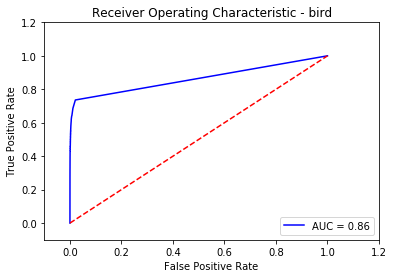

24454.0 blank 0.90233511525


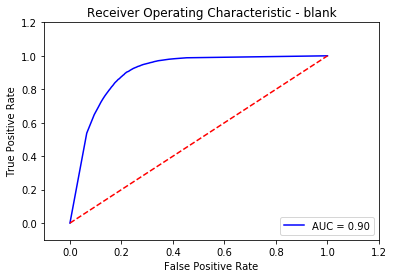

74.0 cattle 0.945675363401


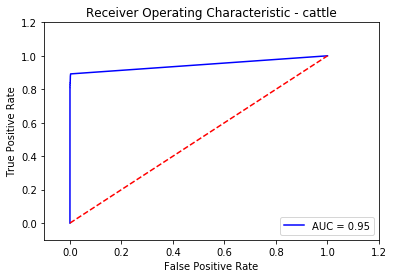

1004.0 chimpanzee 0.927396419655


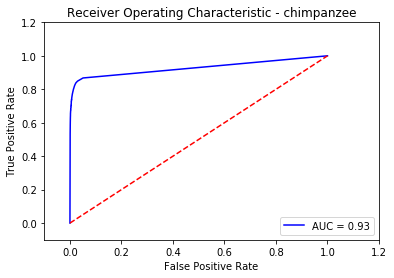

217.0 elephant 0.913531345444


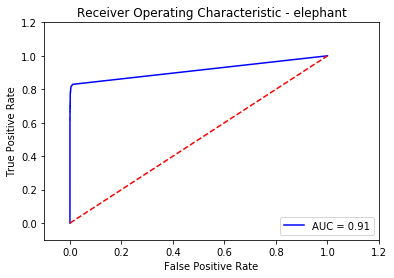

2.0 forest buffalo 0.749116564417


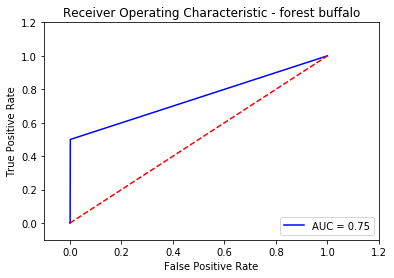

34.0 gorilla 0.881140513084


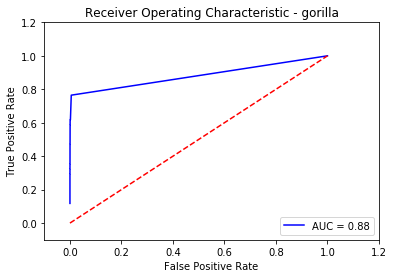

35.0 hippopotamus 0.78453296096


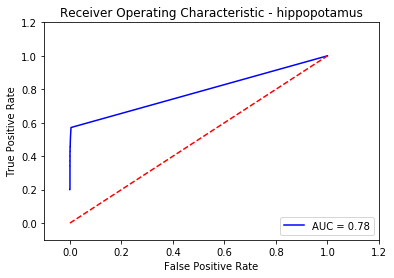

4000.0 human 0.970722426671


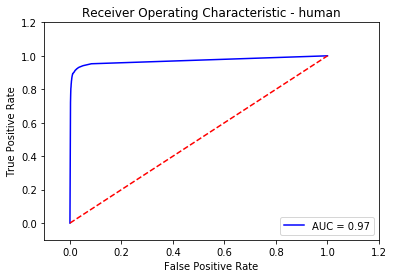

2.0 hyena 0.749496932515


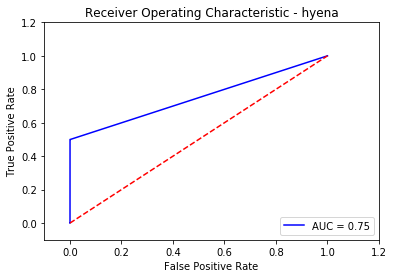

45.0 large ungulate 0.909951332422


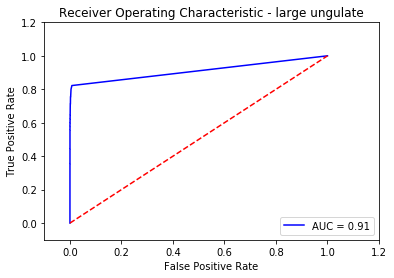

42.0 leopard 0.680518124715


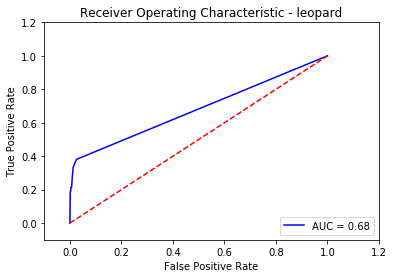

372.0 other (non-primate) 0.837195233987


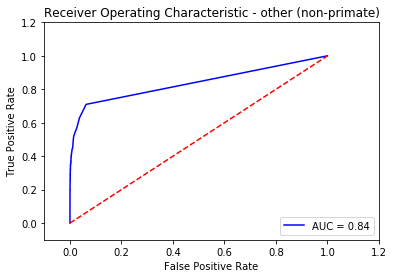

4040.0 other (primate) 0.923989876243


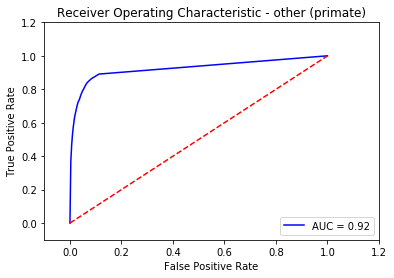

13.0 pangolin 0.803695004031


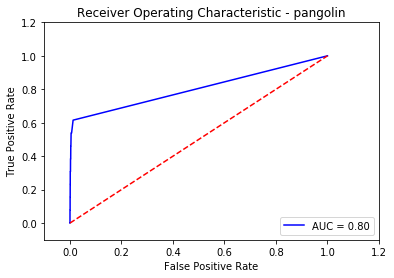

114.0 porcupine 0.849520865874


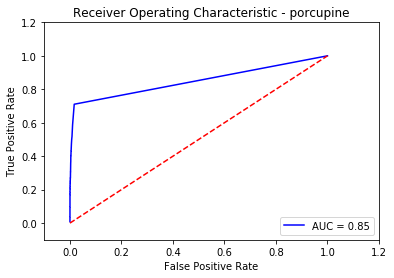

1.0 reptile 0.5


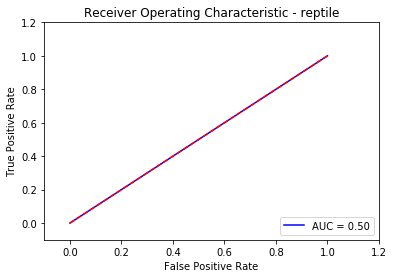

579.0 rodent 0.84699499363


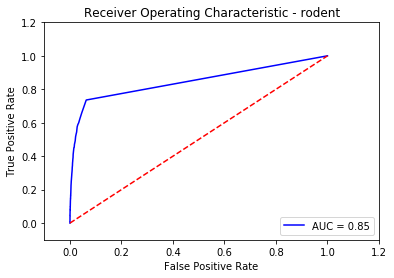

55.0 small antelope 0.796284291672


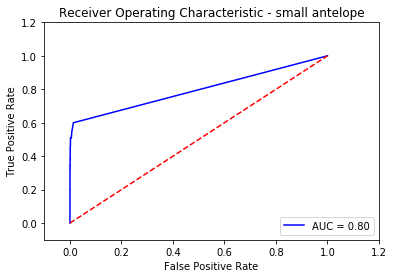

16.0 small cat 0.620073460821


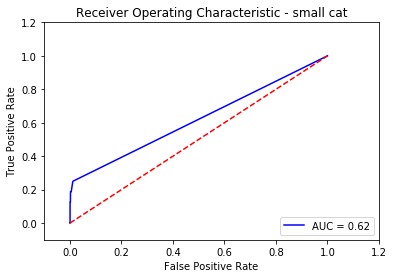

4.0 wild dog 0.748687052125


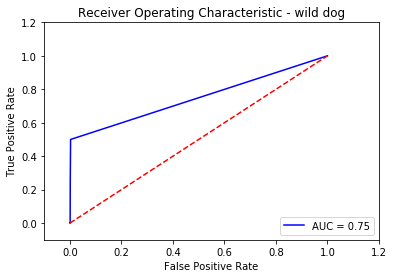

4294.0 duiker 0.857369865825


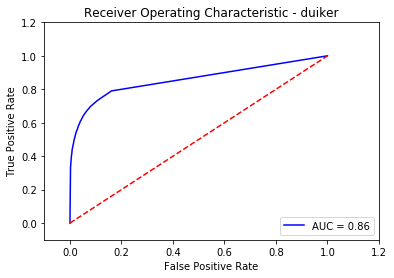

911.0 hog 0.928631926617


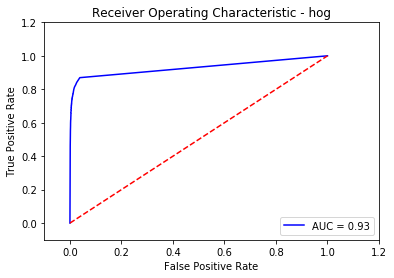

In [213]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt
import random


for animal in ANIMALS:
    if animal != 'lion':
        df_predict_clip = df_predict.copy()
        # df_predict_clip[ANIMALS_PRED] = df_predict_clip[ANIMALS_PRED].clip(0.003,0.9)    

        predictions = df_predict_clip[animal+'_pred'].values
        actual = df_predict_clip[animal].values

        fpr, tpr, ths = roc_curve(actual, predictions)
        roc_auc = auc(fpr, tpr)

        print(actual.sum(),animal,roc_auc)
        plt.title('Receiver Operating Characteristic - {}'.format(animal))
        plt.plot(fpr, tpr, 'b',label='AUC = %0.2f'% roc_auc)
        plt.legend(loc='lower right')
        plt.plot([0,1],[0,1],'r--')
        plt.xlim([-0.1,1.2])
        plt.ylim([-0.1,1.2])
        plt.ylabel('True Positive Rate')
        plt.xlabel('False Positive Rate')
        plt.show()


array([ 1.89999998,  0.89999998,  0.88999999,  0.88      ,  0.87      ,
        0.86000001,  0.85000002,  0.83999997,  0.82999998,  0.81999999,
        0.81      ,  0.80000001,  0.79000002,  0.77999997,  0.76999998,
        0.75999999,  0.75      ,  0.74000001,  0.72000003,  0.70999998,
        0.69999999,  0.69      ,  0.68000001,  0.67000002,  0.66000003,
        0.63999999,  0.63      ,  0.62      ,  0.61000001,  0.60000002,
        0.58999997,  0.57999998,  0.56999999,  0.56      ,  0.55000001,
        0.54000002,  0.52999997,  0.51999998,  0.50999999,  0.5       ,
        0.49000001,  0.47999999,  0.47      ,  0.44999999,  0.44      ,
        0.43000001,  0.41999999,  0.41      ,  0.40000001,  0.38999999,
        0.37      ,  0.36000001,  0.34999999,  0.33000001,  0.31999999,
        0.31      ,  0.30000001,  0.28999999,  0.28      ,  0.27000001,
        0.25      ,  0.23999999,  0.23      ,  0.22      ,  0.20999999,
        0.2       ,  0.19      ,  0.18000001,  0.17      ,  0.16

## Run a simple regression ensemble on each class - file size + 

In [54]:
import pandas as pd
import numpy as np
from torch.nn import Softmax
import torch

df_predict = pd.read_csv('df_predict_train.csv')
del df_predict['Unnamed: 0']
df_predict.columns = ['filename','class']
preds = np.load('vgg16_augs_all_class.npy')
gt = pd.read_csv('train.csv')
m = Softmax()

ANIMALS = ['bird', 'blank', 'cattle', 'chimpanzee', 'elephant',
           'forest buffalo', 'gorilla', 'hippopotamus', 'human', 'hyena',
           'large ungulate', 'leopard', 'lion', 'other (non-primate)',
           'other (primate)', 'pangolin', 'porcupine', 'reptile', 'rodent',
           'small antelope', 'small cat', 'wild dog', 'duiker', 'hog']

df_predict = df_predict.merge(gt[ANIMALS+['filename']], how='left', on='filename')
preds = m(torch.from_numpy(preds)).data.numpy()

for key,value in map_dict.items():
    df_predict[value+'_pred'] = preds[:,key]
    
# Round values
for column in ANIMALS:
    if column!='lion':
        df_predict[column+'_pred'] = df_predict[column+'_pred'].round(2)  
        
ANIMALS_PRED = [(animal+'_pred') for animal in ANIMALS if animal != 'lion']

In [74]:
df_predict.head()

,filename,class,bird,blank,cattle,chimpanzee,elephant,forest buffalo,gorilla,hippopotamus,...,other (non-primate)_pred,other (primate)_pred,pangolin_pred,porcupine_pred,reptile_pred,rodent_pred,small antelope_pred,small cat_pred,wild dog_pred,file_size
0,QDLqirEaE7.mp4,all_animals,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.931254
1,UQv2AYvBmS.mp4,all_animals,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.733759
2,StWE1tLid5.mp4,all_animals,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.730621
3,IBHkVevog9.mp4,all_animals,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4.205123
4,KJ15ozNF5C.mp4,all_animals,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.718253


In [56]:
df_predict.shape

(40752, 49)

In [58]:
import os
import tqdm 

df_predict['file_size'] = 0

with tqdm.tqdm(total=df_predict.shape[0]) as pbar:
    for i,row in df_predict.iterrows():
        df_predict.loc[i,'file_size'] =  os.path.getsize("micro_chimps/micro/{}".format(row['filename']))
        pbar.update(1)

100%|██████████| 40752/40752 [00:24<00:00, 1685.52it/s]


In [76]:
X_test[:,1]

array([ 0.,  0.,  0., ...,  0.,  0.,  0.])

In [73]:
df_predict['file_size'] = df_predict['file_size'].apply(lambda x: np.log10(x))

In [103]:
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split  
from sklearn.metrics import log_loss
    
    
LARGEST_CLASSES = ['blank','duiker','other (primate)','human','chimpanzee','hog','rodent']         

for animal in LARGEST_CLASSES:
    if column!='lion':
        y = df_predict[animal].values
        X = df_predict[['file_size',animal+'_pred']].values
        
        X_clip = df_predict[animal].clip(0.0030,0.99).values
        
        X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.5,random_state=42)
        lr = LinearRegression()
        lr.fit(X_train,y_train)
        
        y_pred_all = lr.predict(X)       
        y_pred_test = lr.predict(X_test) 
        
        loss_orig = log_loss(y_true = y, y_pred = X[:,1]) 
        loss_orig_clip = log_loss(y_true = y, y_pred = X_clip) 
        loss_test = log_loss(y_true = y_test, y_pred = y_pred_test) 
        loss_lr = log_loss(y_true = y, y_pred = y_pred_all) 
        loss_lr_clip = log_loss(y_true = y, y_pred = np.clip(y_pred_all,0.05,0.95) ) 
        
        
        print('For class {} (size - {}) logloss: \n \
              1) original wo clipping {} \n \
              2) original w clipping {}  \n \
              3) test lr {} \n \
              4) whole dataset lr {} \n \
              5) whole dataset lr + clip {} \n '
              .format(animal,df_predict[animal].sum(),loss_orig,loss_orig_clip,loss_test,loss_lr,loss_lr_clip))
        


For class blank (size - 24454.0) logloss: 
               1) original wo clipping 10.206363915708621 
               2) original w clipping 0.007232489226893235  
               3) test lr 0.7077678064161121 
               4) whole dataset lr 0.7084095884276956 
               5) whole dataset lr + clip 0.5622703430586298 
 
For class duiker (size - 4294.0) logloss: 
               1) original wo clipping 4.094452457816154 
               2) original w clipping 0.0037469211821993054  
               3) test lr 0.34067067418490193 
               4) whole dataset lr 0.33674490142078645 
               5) whole dataset lr + clip 0.33674490142078645 
 
For class other (primate) (size - 4040.0) logloss: 
               1) original wo clipping 4.192940181437751 
               2) original w clipping 0.003703005791160007  
               3) test lr 0.31486010645790474 
               4) whole dataset lr 0.3173747463307412 
               5) whole dataset lr + clip 0.31737511350630404 
 
For

In [81]:
y_pred_test.shape, X_test[:,1].shape

((20376,), (20376,))

# Analyze file sizes vs classes

In [80]:
# big files

import glob

g = glob.glob('../slow_max_space/raw/*')
len(g)

43321

In [81]:
g = glob.glob('micro_chimps/micro/*')
len(g)

456002

In [82]:
import pandas as pd

df_train = pd.read_csv('train.csv')
df_submit = pd.read_csv('submission.csv')

In [84]:
df_train['animal'] = ''
df_train.loc[df_train.sum(axis=1)>1,'animal'] = '2 animals'

In [85]:
df_train.loc[df_train.sum(axis=1)==1, 'animal'] = df_train[df_train.sum(axis=1)==1][ANIMALS].idxmax(axis=1)


In [110]:
import os
import tqdm 

df_train['file_size'] = 0

with tqdm.tqdm(total=df_train.shape[0]) as pbar:
    for i,row in df_train.iterrows():
        df_train.loc[i,'file_size'] =  os.path.getsize("micro_chimps/micro/{}".format(row['filename']))
        pbar.update(1)

100%|██████████| 204130/204130 [02:56<00:00, 1158.59it/s]


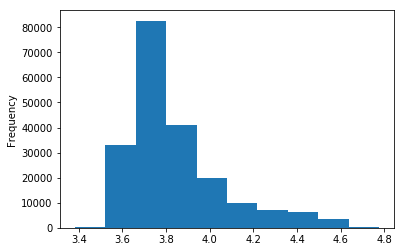

In [112]:
import matplotlib.pyplot as plt

df_train['file_size'].apply(lambda x: np.log10(x)).plot(kind='hist')
plt.show()

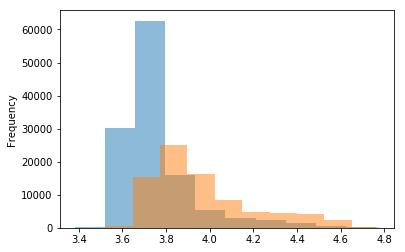

In [116]:
fig = plt.figure()
ax = fig.add_subplot(111)
df_train[df_train.animal=='blank']['file_size'].apply(lambda x: np.log10(x)).plot(kind='hist', ax=ax, alpha=0.5)
df_train[df_train.animal !='blank']['file_size'].apply(lambda x: np.log10(x)).plot(kind='hist', ax=ax, alpha=0.5)

plt.show()
# x.plot(kind='kde', ax=ax)
# y.plot(kind='kde', ax=ax, color='red')

# Extract inception4 features

In [230]:
def get_train_videos():

    from sklearn.model_selection import train_test_split     

    df_train = pd.read_csv('train.csv')
    df_submit = pd.read_csv('submission.csv')

    # remove lion - because it cannot be split
    ANIMALS = ['bird', 'blank', 'cattle', 'chimpanzee', 'elephant',
           'forest buffalo', 'gorilla', 'hippopotamus', 'human', 'hyena',
           'large ungulate', 'leopard', 'other (non-primate)',
           'other (primate)', 'pangolin', 'porcupine', 'reptile', 'rodent',
           'small antelope', 'small cat', 'wild dog', 'duiker', 'hog']

    df_train['animal'] = ''
    df_train.loc[df_train.sum(axis=1)>1,'animal'] = '2 animals'
    df_train.loc[df_train.sum(axis=1)==1, 'animal'] = df_train[df_train.sum(axis=1)==1][ANIMALS].idxmax(axis=1)

    df_sample = pd.DataFrame()

    # just take the dataset as is w/o any limitations
    for animal in ANIMALS:
        df_sample = df_sample.append(df_train[df_train.animal == animal])

    video_2_animal_train = dict(zip(df_sample.filename.values,['all_animals'] * len(list( df_sample.filename.values )) ))     
    
    return video_2_animal_train

In [231]:
video_2_animal_train = get_train_videos()

In [232]:
len(video_2_animalb`b_train)

203756

In [91]:
# standard pytorch imports
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torch.distributed as dist
import torch.optim
import torch.utils.data
import torch.utils.data.distributed
import torchvision.transforms as transforms
import torchvision.datasets as datasets
import torchvision.models as models

# standard ds and os tools
import pandas as pd
import numpy as np
import tqdm
import os

# custom written classes
from JungleDataset import JungleDatasetVideo
from CustomAugmentation import CustomAugmentation,ValidAugmentation
from FineTuneModel import FineTuneModel
from Inception4 import inceptionv4

# stupid hack - add params instead of doing a proper CLI parsing
# also works with jupyter notebooks
args = type('test', (), {})()
args.finetune = False
args.resume = False
args.batch_size = 160
args.workers = 12
args.lognumber = 'inception4_features'
args.numclasses = 23
args.arch = 'inception4'
args.evaluate = False

def get_train_videos():

    from sklearn.model_selection import train_test_split     

    df_train = pd.read_csv('train.csv')
    df_submit = pd.read_csv('submission.csv')

    # remove lion - because it cannot be split
    ANIMALS = ['bird', 'blank', 'cattle', 'chimpanzee', 'elephant',
           'forest buffalo', 'gorilla', 'hippopotamus', 'human', 'hyena',
           'large ungulate', 'leopard', 'other (non-primate)',
           'other (primate)', 'pangolin', 'porcupine', 'reptile', 'rodent',
           'small antelope', 'small cat', 'wild dog', 'duiker', 'hog']

    df_train['animal'] = ''
    df_train.loc[df_train.sum(axis=1)>1,'animal'] = '2 animals'
    df_train.loc[df_train.sum(axis=1)==1, 'animal'] = df_train[df_train.sum(axis=1)==1][ANIMALS].idxmax(axis=1)

    df_sample = pd.DataFrame()

    # just take the dataset as is w/o any limitations
    for animal in ANIMALS:
        df_sample = df_sample.append(df_train[df_train.animal == animal])

    video_2_animal_train = dict(zip(df_sample.filename.values,['all_animals'] * len(list( df_sample.filename.values )) ))     
    
    return video_2_animal_train



predict_dict = get_train_videos()

In [93]:
predict_dict['PdFGxX32wF.mp4']

'all_animals'

In [103]:
from numpy import random
video_matrix = random.random((299,299,3)) 
type(video_matrix)

numpy.ndarray

In [109]:
    video_matrix = video_matrix.astype('uint8')

In [110]:
from PIL import Image

pil_image = Image.fromarray(video_matrix)  

In [94]:
predict_dict = {'PdFGxX32wF.mp4':'all_animals'}

predict_folder = JungleDatasetVideo(root = 'micro_chimps/micro/',
                   video_dict = predict_dict,
                   transform = ValidAugmentation(size=299, crop=299),
                   dataset_name='predict_chimps')
    
predict_loader = torch.utils.data.DataLoader(
    dataset = predict_folder,
    batch_size=args.batch_size,
    shuffle=False,
    num_workers=args.workers,
    pin_memory=False)


for i, (input, target) in enumerate(predict_loader):
    print(i)



['all_animals']
0


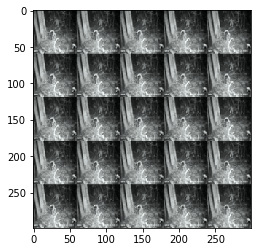

In [97]:
img = input[0].cpu().numpy().astype(np.float32).transpose((1, 2, 0))
img += -img.min()
img *= (1/img.max())

plt.imshow(img)
plt.show()

In [95]:
input.size()

torch.Size([1, 3, 299, 299])

# EDA on full data + ft motion detection

In [1]:
!ls -ls ../slow_max_space/raw | wc -l 

^C


In [1]:
import pandas as pd
import glob

df_train = pd.read_csv('train.csv')
df_submit = pd.read_csv('submission.csv')

g = glob.glob('../slow_max_space/raw/*')
filenames = [(file.split('/')[-1])for file in g]

In [2]:
len(g)

139168

In [ ]:
annotation_list = list(df_train.filename.unique())
annotation_list.extend(df_submit.filename.unique())

In [ ]:
df_minus_files = set(filenames)-set(annotation_list)
files_minus_df = set(annotation_list) - set(filenames)

In [ ]:
len(df_minus_files),len(files_minus_df)

In [9]:
df_train.head()

,filename,bird,blank,cattle,chimpanzee,elephant,forest buffalo,gorilla,hippopotamus,human,...,pangolin,porcupine,reptile,rodent,small antelope,small cat,wild dog,duiker,hog,animal
0,000libDc84.mp4,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,blank
1,003TeGtbkD.mp4,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,blank
2,006jFoesFi.mp4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,duiker
3,008uxqP8IN.mp4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,hog
4,0094UxdyyZ.mp4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,other (primate)


In [4]:
ANIMALS = ['bird', 'blank', 'cattle', 'chimpanzee', 'elephant',
       'forest buffalo', 'gorilla', 'hippopotamus', 'human', 'hyena',
       'large ungulate', 'leopard', 'lion', 'other (non-primate)',
       'other (primate)', 'pangolin', 'porcupine', 'reptile', 'rodent',
       'small antelope', 'small cat', 'wild dog', 'duiker', 'hog']
df_train['animal'] = ''
df_train.loc[df_train.sum(axis=1)>1,'animal'] = '2 animals'
df_train.loc[df_train.sum(axis=1)==1, 'animal'] = df_train[df_train.sum(axis=1)==1][ANIMALS].idxmax(axis=1)
df_train.animal.value_counts()

blank                  122270
duiker                  21471
other (primate)         20198
human                   20000
chimpanzee               5019
hog                      4557
rodent                   2896
bird                     2217
other (non-primate)      1862
elephant                 1085
porcupine                 569
2 animals                 374
cattle                    372
small antelope            273
large ungulate            224
leopard                   209
hippopotamus              175
gorilla                   171
small cat                  79
pangolin                   63
wild dog                   21
hyena                      10
forest buffalo              9
reptile                     4
lion                        2
Name: animal, dtype: int64

In [5]:
df_train['is_extracted'] = df_train.filename.isin(filenames)

In [6]:
df_train[df_train['is_extracted']==True].animal.value_counts()

blank                  18180
duiker                  3362
human                   2610
other (primate)         2088
chimpanzee               842
hog                      293
rodent                   254
bird                     238
elephant                 234
other (non-primate)      116
porcupine                 38
gorilla                   35
large ungulate            34
leopard                   30
2 animals                 28
hippopotamus              26
small cat                 13
small antelope             6
pangolin                   5
wild dog                   5
hyena                      1
forest buffalo             1
Name: animal, dtype: int64

In [46]:
import moviepy.editor as mpe

animal = 'blank'
video_id = df_train[(df_train.animal == animal) & (df_train['is_extracted']==True)].sample(n=1).filename.values[0]
print(video_id)
video = mpe.VideoFileClip("../slow_max_space/raw/{}".format(video_id))
video.ipython_display(width=500)


0a1KirDMws.mp4


100%|██████████| 361/361 [00:01<00:00, 241.78it/s]


183369.5


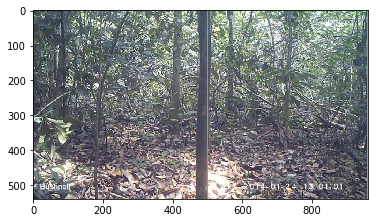

127837.0


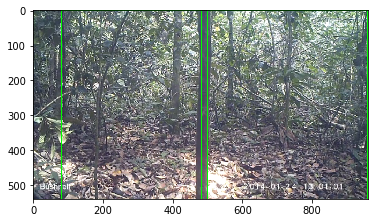

13178.0


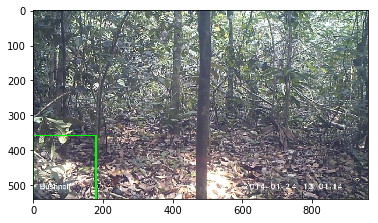

In [47]:
import imageio
import cv2
import numpy as np
import matplotlib.pyplot as plt

# video_id = video_id from the cell above
# reader = imageio.get_reader("../slow_max_space/raw/{}".format(video_id))
clip = mpe.VideoFileClip("../slow_max_space/raw/{}".format(video_id))

min_area = 5000
img_mean = np.zeros((960,540))
total_frames = 0
lastFrame = None

# for i, im in enumerate(reader):
for im in clip.iter_frames(fps=2):
    # if i%15 == 0:
    im = cv2.resize(im,(960,540))
    gray = cv2.cvtColor(im, cv2.COLOR_BGR2GRAY)
    gray = cv2.GaussianBlur(gray, (3, 3), 0)

    if lastFrame is None:
        lastFrame = gray

    # compute the absolute difference between the current frame and
    # first frame
    frameDelta = cv2.absdiff(lastFrame, gray)
    thresh = cv2.threshold(frameDelta, 10, 255, cv2.THRESH_BINARY)[1]

    # dilate the thresholded image to fill in holes, then find contours
    # on thresholded image
    thresh = cv2.dilate(thresh, None, iterations=2)

    im2, cnts, hierarchy  = cv2.findContours(thresh.copy(), cv2.RETR_EXTERNAL,cv2.CHAIN_APPROX_SIMPLE)

    # loop over the contours
    for c in cnts:
        # if the contour is too small, ignore it
        if cv2.contourArea(c) < min_area:
            continue

        # compute the bounding box for the contour, draw it on the frame,
        # and update the text

        print (cv2.contourArea(c) )

        (x, y, w, h) = cv2.boundingRect(c)

        plt.imshow(cv2.rectangle(im, (x, y), (x + w, y + h), (0, 255, 0), 2) )
        plt.show()

    lastFrame = gray

# Random forest models

In [1]:
import pandas as pd

df_train = pd.read_csv('train.csv')
df_submit = pd.read_csv('submission.csv')

ANIMALS = ['bird', 'blank', 'cattle', 'chimpanzee', 'elephant',
       'forest buffalo', 'gorilla', 'hippopotamus', 'human', 'hyena',
       'large ungulate', 'leopard', 'lion', 'other (non-primate)',
       'other (primate)', 'pangolin', 'porcupine', 'reptile', 'rodent',
       'small antelope', 'small cat', 'wild dog', 'duiker', 'hog']
df_train['animal'] = ''
df_train.loc[df_train.sum(axis=1)>1,'animal'] = '2 animals'
df_train.loc[df_train.sum(axis=1)==1, 'animal'] = df_train[df_train.sum(axis=1)==1][ANIMALS].idxmax(axis=1)


In [112]:
df_train.head()

,filename,bird,blank,cattle,chimpanzee,elephant,forest buffalo,gorilla,hippopotamus,human,...,pangolin,porcupine,reptile,rodent,small antelope,small cat,wild dog,duiker,hog,animal
0,000libDc84.mp4,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,blank
1,003TeGtbkD.mp4,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,blank
2,006jFoesFi.mp4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,duiker
3,008uxqP8IN.mp4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,hog
4,0094UxdyyZ.mp4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,other (primate)


In [2]:
import numpy as np
import os
import tqdm 

inception_df = pd.read_csv('train_inception_vids.csv')
del inception_df['Unnamed: 0']
inception_df.columns = ['filename','class']
inception_features = np.load('inception4_features.npy')

inception_df['file_size'] = 0

with tqdm.tqdm(total=df_train.shape[0]) as pbar:
    for i,row in inception_df.iterrows():
        inception_df.loc[i,'file_size'] =  os.path.getsize("micro_chimps/micro/{}".format(row['filename']))
        pbar.update(1)
        
inception_df = inception_df.reset_index()
inception_df = inception_df.merge(df_train[['filename','animal']],on='filename')

animals_dict = {animal:i for i,animal in enumerate(ANIMALS)}

inception_df['animal'] = inception_df['animal'].apply(lambda x: animals_dict[x])

predictors = np.zeros((203756, 1537))
predictors[:,1:1537] = inception_features
# add file size as new feature
predictors[:,0] = inception_df.file_size.values
predictors.shape
        

100%|█████████▉| 203756/204130 [02:40<00:00, 1272.11it/s]


(203756, 1537)

In [5]:
np.save('predictors_inception4',predictors)

In [3]:
inception_df = inception_df.set_index('filename')
inception_df.to_csv('inception_forest.csv')

In [6]:
inception_df.head()

,index,class,file_size,animal
filename,,,,
jSC5bzJQh5.mp4,0,all_animals,6567,1
jH2avJ388o.mp4,1,all_animals,4146,1
qD0iBIuTJC.mp4,2,all_animals,4675,1
YFCAheviex.mp4,3,all_animals,5541,22
VDgHzFODun.mp4,4,all_animals,16294,1


In [7]:
inception_df.shape,inception_features.shape

((203756, 4), (203756, 1536))

In [8]:
target = inception_df.animal.values

In [2]:
import numpy as np
import pandas as pd
import gc

inception_df = pd.read_csv('inception_forest.csv')
inception_features = np.load('inception4_features.npy')

predictors = np.zeros((203756, 1537))
predictors[:,1:1537] = inception_features
# add file size as new feature
predictors[:,0] = inception_df.file_size.values

target = inception_df.animal.values

del inception_df,inception_features
gc.collect()

10

In [ ]:
import warnings
warnings.filterwarnings('ignore')
import numpy as np
import pandas as pd
from sklearn.model_selection import cross_val_score, StratifiedKFold, GridSearchCV
from sklearn.metrics import accuracy_score
from sklearn.ensemble import RandomForestClassifier

skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

train_acc = []
test_acc = []
temp_train_acc = []
temp_test_acc = []
trees_grid = [5,10,100,1000]

for ntrees in trees_grid:
    print('Number of trees - {} is being evaluated' . format (ntrees) ) 
    rfc = RandomForestClassifier(n_estimators=ntrees,
                                 random_state=42,
                                 n_jobs=-1,
                                 oob_score=True,
                                 verbose=1)
    temp_train_acc = []
    temp_test_acc = []
    for train_index, test_index in skf.split(predictors, target):
        X_train, X_test = predictors[train_index], predictors[test_index]
        y_train, y_test = target[train_index], target[test_index]
        rfc.fit(X_train, y_train)
        temp_train_acc.append(rfc.score(X_train, y_train))
        temp_test_acc.append(rfc.score(X_test, y_test))
        print('Train accuracy: {}'.format(temp_train_acc))
        print('Test accuracy: {}'.format(temp_test_acc))
    train_acc.append(temp_train_acc)
    test_acc.append(temp_test_acc)
    gc.collect()

train_acc, test_acc = np.asarray(train_acc), np.asarray(test_acc)
print("Best accuracy on CV is {:.2f}% with {} trees".format(max(test_acc.mean(axis=1))*100, 
                                                        trees_grid[np.argmax(test_acc.mean(axis=1))]))

Number of trees - 5 is being evaluated


[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:   12.7s remaining:   19.1s
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:   15.8s finished
[Parallel(n_jobs=5)]: Done   2 out of   5 | elapsed:    0.2s remaining:    0.3s
[Parallel(n_jobs=5)]: Done   5 out of   5 | elapsed:    0.2s finished
[Parallel(n_jobs=5)]: Done   2 out of   5 | elapsed:    0.0s remaining:    0.1s
[Parallel(n_jobs=5)]: Done   5 out of   5 | elapsed:    0.0s finished


Train accuracy: [0.95703575547866204]
Test accuracy: [0.65284592737978409]


[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:   10.8s remaining:   16.1s
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:   12.9s finished
[Parallel(n_jobs=5)]: Done   2 out of   5 | elapsed:    0.1s remaining:    0.2s
[Parallel(n_jobs=5)]: Done   5 out of   5 | elapsed:    0.2s finished
[Parallel(n_jobs=5)]: Done   2 out of   5 | elapsed:    0.0s remaining:    0.1s
[Parallel(n_jobs=5)]: Done   5 out of   5 | elapsed:    0.0s finished


Train accuracy: [0.95703575547866204, 0.95671832247457089]
Test accuracy: [0.65284592737978409, 0.6518133189380183]


[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:   11.9s remaining:   17.8s
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:   14.8s finished
[Parallel(n_jobs=5)]: Done   2 out of   5 | elapsed:    0.1s remaining:    0.2s
[Parallel(n_jobs=5)]: Done   5 out of   5 | elapsed:    0.1s finished
[Parallel(n_jobs=5)]: Done   2 out of   5 | elapsed:    0.0s remaining:    0.1s
[Parallel(n_jobs=5)]: Done   5 out of   5 | elapsed:    0.0s finished


Train accuracy: [0.95703575547866204, 0.95671832247457089, 0.9571485537253458]
Test accuracy: [0.65284592737978409, 0.6518133189380183, 0.64962822998208636]


[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:   10.9s remaining:   16.4s
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:   13.4s finished
[Parallel(n_jobs=5)]: Done   2 out of   5 | elapsed:    0.2s remaining:    0.2s
[Parallel(n_jobs=5)]: Done   5 out of   5 | elapsed:    0.2s finished
[Parallel(n_jobs=5)]: Done   2 out of   5 | elapsed:    0.0s remaining:    0.1s
[Parallel(n_jobs=5)]: Done   5 out of   5 | elapsed:    0.0s finished


Train accuracy: [0.95703575547866204, 0.95671832247457089, 0.9571485537253458, 0.9585416577202206]
Test accuracy: [0.65284592737978409, 0.6518133189380183, 0.64962822998208636, 0.65292399813492352]


[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:   12.4s remaining:   18.7s
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:   15.4s finished
[Parallel(n_jobs=5)]: Done   2 out of   5 | elapsed:    0.1s remaining:    0.2s
[Parallel(n_jobs=5)]: Done   5 out of   5 | elapsed:    0.2s finished
[Parallel(n_jobs=5)]: Done   2 out of   5 | elapsed:    0.0s remaining:    0.1s
[Parallel(n_jobs=5)]: Done   5 out of   5 | elapsed:    0.0s finished


Train accuracy: [0.95703575547866204, 0.95671832247457089, 0.9571485537253458, 0.9585416577202206, 0.9577214226998908]
Test accuracy: [0.65284592737978409, 0.6518133189380183, 0.64962822998208636, 0.65292399813492352, 0.65534338029551809]
Number of trees - 10 is being evaluated


[Parallel(n_jobs=-1)]: Done   6 out of  10 | elapsed:   12.9s remaining:    8.6s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:   22.8s finished
[Parallel(n_jobs=8)]: Done   6 out of  10 | elapsed:    0.2s remaining:    0.1s
[Parallel(n_jobs=8)]: Done  10 out of  10 | elapsed:    0.3s finished
[Parallel(n_jobs=8)]: Done   6 out of  10 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=8)]: Done  10 out of  10 | elapsed:    0.1s finished


Train accuracy: [0.98669292497975414]
Test accuracy: [0.67539254170755647]


[Parallel(n_jobs=-1)]: Done   6 out of  10 | elapsed:   15.4s remaining:   10.3s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:   25.4s finished
[Parallel(n_jobs=8)]: Done   6 out of  10 | elapsed:    0.2s remaining:    0.2s
[Parallel(n_jobs=8)]: Done  10 out of  10 | elapsed:    0.3s finished
[Parallel(n_jobs=8)]: Done   6 out of  10 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=8)]: Done  10 out of  10 | elapsed:    0.1s finished


Train accuracy: [0.98669292497975414, 0.98614127434019216]
Test accuracy: [0.67539254170755647, 0.67379889090641409]


[Parallel(n_jobs=-1)]: Done   6 out of  10 | elapsed:   12.4s remaining:    8.3s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:   21.7s finished
[Parallel(n_jobs=8)]: Done   6 out of  10 | elapsed:    0.2s remaining:    0.1s
[Parallel(n_jobs=8)]: Done  10 out of  10 | elapsed:    0.3s finished
[Parallel(n_jobs=8)]: Done   6 out of  10 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=8)]: Done  10 out of  10 | elapsed:    0.1s finished


Train accuracy: [0.98669292497975414, 0.98614127434019216, 0.98614152940093858]
Test accuracy: [0.67539254170755647, 0.67379889090641409, 0.67495276189541364]


[Parallel(n_jobs=-1)]: Done   6 out of  10 | elapsed:   14.6s remaining:    9.7s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:   25.3s finished
[Parallel(n_jobs=8)]: Done   6 out of  10 | elapsed:    0.2s remaining:    0.2s
[Parallel(n_jobs=8)]: Done  10 out of  10 | elapsed:    0.3s finished
[Parallel(n_jobs=8)]: Done   6 out of  10 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=8)]: Done  10 out of  10 | elapsed:    0.1s finished


Train accuracy: [0.98669292497975414, 0.98614127434019216, 0.98614152940093858, 0.98616623825970662]
Test accuracy: [0.67539254170755647, 0.67379889090641409, 0.67495276189541364, 0.67761172053301921]


[Parallel(n_jobs=-1)]: Done   6 out of  10 | elapsed:   13.1s remaining:    8.8s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:   21.8s finished
[Parallel(n_jobs=8)]: Done   6 out of  10 | elapsed:    0.2s remaining:    0.1s
[Parallel(n_jobs=8)]: Done  10 out of  10 | elapsed:    0.3s finished
[Parallel(n_jobs=8)]: Done   6 out of  10 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=8)]: Done  10 out of  10 | elapsed:    0.1s finished


Train accuracy: [0.98669292497975414, 0.98614127434019216, 0.98614152940093858, 0.98616623825970662, 0.98616683229661251]
Test accuracy: [0.67539254170755647, 0.67379889090641409, 0.67495276189541364, 0.67761172053301921, 0.67441460900299444]
Number of trees - 100 is being evaluated


[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:  2.9min finished
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.9s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    2.5s finished
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.2s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.6s finished


Train accuracy: [0.99998159464035929]
Test accuracy: [0.68547595682041218]


[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:  1.0min
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:  2.6min finished
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.9s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    2.4s finished
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.2s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.6s finished


Train accuracy: [0.99998159464035929, 0.99995705574164739]
Test accuracy: [0.68547595682041218, 0.68942925847769543]


[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:  2.7min finished
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.9s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    2.3s finished
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.2s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.6s finished


Train accuracy: [0.99998159464035929, 0.99995705574164739, 0.99996319131314992]
Test accuracy: [0.68547595682041218, 0.68942925847769543, 0.68803219552894412]


[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:   59.5s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:  2.6min finished
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.9s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    2.5s finished
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.2s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.6s finished


Train accuracy: [0.99998159464035929, 0.99995705574164739, 0.99996319131314992, 0.99995705705889926]
Test accuracy: [0.68547595682041218, 0.68942925847769543, 0.68803219552894412, 0.68705980514859255]


[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:  1.0min
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:  2.7min finished
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.9s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    2.5s finished
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.2s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.6s finished


Train accuracy: [0.99998159464035929, 0.99995705574164739, 0.99996319131314992, 0.99995705705889926, 0.99995705890291631]
Test accuracy: [0.68547595682041218, 0.68942925847769543, 0.68803219552894412, 0.68705980514859255, 0.68668695694860338]
Number of trees - 1000 is being evaluated


[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:   59.1s
[Parallel(n_jobs=-1)]: Done 184 tasks      | elapsed:  4.8min
[Parallel(n_jobs=-1)]: Done 434 tasks      | elapsed: 11.2min
[Parallel(n_jobs=-1)]: Done 784 tasks      | elapsed: 20.2min


In [3]:
import warnings
warnings.filterwarnings('ignore')
import numpy as np
import pandas as pd
from sklearn.model_selection import cross_val_score, StratifiedKFold, GridSearchCV
from sklearn.metrics import accuracy_score
from sklearn.ensemble import RandomForestClassifier

skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

train_acc = []
test_acc = []
temp_train_acc = []
temp_test_acc = []
trees_grid = [500]

for ntrees in trees_grid:
    print('Number of trees - {} is being evaluated' . format (ntrees) ) 
    rfc = RandomForestClassifier(n_estimators=ntrees,
                                 random_state=42,
                                 n_jobs=-1,
                                 oob_score=True,
                                 verbose=1)
    temp_train_acc = []
    temp_test_acc = []
    for train_index, test_index in skf.split(predictors, target):
        X_train, X_test = predictors[train_index], predictors[test_index]
        y_train, y_test = target[train_index], target[test_index]
        rfc.fit(X_train, y_train)
        temp_train_acc.append(rfc.score(X_train, y_train))
        temp_test_acc.append(rfc.score(X_test, y_test))
        print('Train accuracy: {}'.format(temp_train_acc))
        print('Test accuracy: {}'.format(temp_test_acc))
    train_acc.append(temp_train_acc)
    test_acc.append(temp_test_acc)
    gc.collect()

train_acc, test_acc = np.asarray(train_acc), np.asarray(test_acc)
print("Best accuracy on CV is {:.2f}% with {} trees".format(max(test_acc.mean(axis=1))*100, 
                                                        trees_grid[np.argmax(test_acc.mean(axis=1))]))

Number of trees - 500 is being evaluated


[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:   59.5s
[Parallel(n_jobs=-1)]: Done 184 tasks      | elapsed:  4.8min
[Parallel(n_jobs=-1)]: Done 434 tasks      | elapsed: 11.2min
[Parallel(n_jobs=-1)]: Done 500 out of 500 | elapsed: 12.8min finished
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.9s
[Parallel(n_jobs=8)]: Done 184 tasks      | elapsed:    4.6s
[Parallel(n_jobs=8)]: Done 434 tasks      | elapsed:   10.7s
[Parallel(n_jobs=8)]: Done 500 out of 500 | elapsed:   12.3s finished
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.2s
[Parallel(n_jobs=8)]: Done 184 tasks      | elapsed:    1.1s
[Parallel(n_jobs=8)]: Done 434 tasks      | elapsed:    2.3s
[Parallel(n_jobs=8)]: Done 500 out of 500 | elapsed:    2.7s finished


Train accuracy: [0.99998159464035929]
Test accuracy: [0.68461727183513243]


KeyboardInterrupt: 

In [2]:
# https://www.analyticsvidhya.com/blog/2016/03/complete-guide-parameter-tuning-xgboost-with-codes-python/
#Import libraries:
import pandas as pd
import numpy as np
import xgboost as xgb
from xgboost.sklearn import XGBClassifier
from sklearn import cross_validation, metrics   #Additional scklearn functions
from sklearn.grid_search import GridSearchCV   #Perforing grid search

import matplotlib.pylab as plt
%matplotlib inline
from matplotlib.pylab import rcParams

/opt/conda/lib/python3.5/site-packages/sklearn/cross_validation.py:41: DeprecationWarning: This module was deprecated in version 0.18 in favor of the model_selection module into which all the refactored classes and functions are moved. Also note that the interface of the new CV iterators are different from that of this module. This module will be removed in 0.20.
  "This module will be removed in 0.20.", DeprecationWarning)
/opt/conda/lib/python3.5/site-packages/sklearn/grid_search.py:42: DeprecationWarning: This module was deprecated in version 0.18 in favor of the model_selection module into which all the refactored classes and functions are moved. This module will be removed in 0.20.
  DeprecationWarning)


In [3]:
def modelfit(alg, 
             predictors,
             target,
             useTrainCV=True,
             cv_folds=5,
             early_stopping_rounds=50):
    
    if useTrainCV:
        xgb_param = alg.get_xgb_params()
        xgtrain = xgb.DMatrix(predictors, label=target)
        cvresult = xgb.cv(
            xgb_param,
            xgtrain,
            num_boost_round=alg.get_params()['n_estimators'],
            nfold=cv_folds,
            metrics='merror',
            early_stopping_rounds=early_stopping_rounds,
            verbose_eval = False
        )
        alg.set_params(n_estimators=cvresult.shape[0])
    
    #Fit the algorithm on the data
    alg.fit(predictors, target,eval_metric='merror')
        
    #Predict training set:
    dtrain_predictions = alg.predict(predictors)
    dtrain_predprob = alg.predict_proba(predictors)[:,1]
        
    #Print model report:
    print ("\nModel Report")
    print ("Accuracy : %.4g" % metrics.accuracy_score(target, dtrain_predictions))
                    
    feat_imp = pd.Series(alg.booster().get_fscore()).sort_values(ascending=False)
    feat_imp.plot(kind='bar', title='Feature Importances')
    plt.ylabel('Feature Importance Score')

In [ ]:
xgb1 = XGBClassifier(
 learning_rate =0.1,
 n_estimators=100,
 max_depth=5,
 min_child_weight=1,
 gamma=0,
 subsample=0.8,
 colsample_bytree=0.8,
 objective= 'multi:softprob',
 nthread=1,
 scale_pos_weight=1,
 seed=27)

modelfit(xgb1,predictors,target)

In [113]:
!ls -laht | head

total 19G
-rw-r--r--  1 root  root  1.2G Nov 11 13:54 inception4_features.npy
drwxrwxrwx  9  1001  1001 4.0K Nov 11 13:38 .
-rw-r--r--  1 keras users 6.7M Nov 11 13:38 jungle.ipynb
-rw-r--r--  1 root  root  6.6M Nov 11 12:36 train_inception_vids.csv
drwxr-xr-x  2 keras users 4.0K Nov 11 12:36 __pycache__
-rw-r--r--  1 keras users 2.7K Nov 11 12:36 JungleDataset.py
-rw-r--r--  1 keras users 4.6K Nov 11 12:02 inception4_extractor.py
-rw-r--r--  1 keras users 3.4M Nov 11 11:11 __temp__.mp4
drwxr-xr-x  2 keras users 4.0K Nov 11 10:56 .ipynb_checkpoints


# Unify - CNN + RNN

## Some code munging wo results

In [14]:
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torch.optim
import torch.utils.data
import torchvision.transforms as transforms
import torchvision.datasets as datasets
import torchvision.models as models

import pandas as pd
from PIL import Image

from FineTuneModel import FineTuneModel

model_names = sorted(name for name in models.__dict__
    if name.islower() and not name.startswith("__"))

In [2]:
original_model = models.__dict__['vgg16'](pretrained=True)

In [12]:
import torch
import torch.nn as nn

class FineTuneModel(nn.Module):
    def __init__(self,
                 original_model,
                 arch,
                 num_classes,
                 freeze
                ):
        super(FineTuneModel, self).__init__()


        if arch.startswith('vgg16'):
            self.features = original_model.features
            self.classifier = nn.Sequential(
                nn.Dropout(),
                nn.Linear(512 * 2 * 2, 4096),
                nn.ReLU(inplace=True),
                nn.Dropout(),
                nn.Linear(4096, 4096),
                nn.ReLU(inplace=True),
                nn.Linear(4096, num_classes),
            )
            self.modelName = 'vgg16'         
        else :
            raise("Finetuning not supported on this architecture yet")

        # Freeze those weights
        if freeze == True:
            print('Core model layers are frozen')
            for p in self.features.parameters():
                p.requires_grad = False

    def forward(self, x):
        f = self.features(x)
        if self.modelName == 'vgg16':
            f = f.view(f.size(0), -1)         
        y = self.classifier(f)
        return y


In [14]:
model = FineTuneModel(original_model,
                      'vgg16',
                      23,
                      True)

Core model layers are frozen


In [6]:
model

FineTuneModel (
  (features): Sequential (
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU (inplace)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU (inplace)
    (4): MaxPool2d (size=(2, 2), stride=(2, 2), dilation=(1, 1))
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU (inplace)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU (inplace)
    (9): MaxPool2d (size=(2, 2), stride=(2, 2), dilation=(1, 1))
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU (inplace)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU (inplace)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU (inplace)
    (16): MaxPool2d (size=(2, 2), stride=(2, 2), dilation=(1, 1))
    (17): Conv2d(256, 512, kernel_size=(3, 3), stride=

In [15]:
input = torch.autograd.Variable(torch.randn(1,3, 64, 64))
output = model(input)

In [16]:
output.size()

torch.Size([1, 23])

In [17]:
# Author: Robert Guthrie

import torch
import torch.autograd as autograd
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim

torch.manual_seed(1)

In [20]:
lstm = nn.LSTM(3, 3)  # Input dim is 3, output dim is 3
inputs = [autograd.Variable(torch.randn((1, 3)))
          for _ in range(5)]  # make a sequence of length 5

# initialize the hidden state.
hidden = (autograd.Variable(torch.randn(1, 1, 3)),
          autograd.Variable(torch.randn((1, 1, 3))))



In [27]:
for i in inputs:
    # Step through the sequence one element at a time.
    # after each step, hidden contains the hidden state.
    out, hidden = lstm(i.view(1, 1, -1), hidden)

In [31]:
i.size()

torch.Size([1, 3])

In [ ]:
for i in inputs:
    # Step through the sequence one element at a time.
    # after each step, hidden contains the hidden state.
    out, hidden = lstm(i.view(1, 1, -1), hidden)

# alternatively, we can do the entire sequence all at once.
# the first value returned by LSTM is all of the hidden states throughout
# the sequence. the second is just the most recent hidden state
# (compare the last slice of "out" with "hidden" below, they are the same)
# The reason for this is that:
# "out" will give you access to all hidden states in the sequence
# "hidden" will allow you to continue the sequence and backpropagate,
# by passing it as an argument  to the lstm at a later time
# Add the extra 2nd dimension
inputs = torch.cat(inputs).view(len(inputs), 1, -1)
hidden = (autograd.Variable(torch.randn(1, 1, 3)), autograd.Variable(
    torch.randn((1, 1, 3))))  # clean out hidden state
out, hidden = lstm(inputs, hidden)
print(out)
print(hidden)

In [33]:
training_data

[(['The', 'dog', 'ate', 'the', 'apple'], ['DET', 'NN', 'V', 'DET', 'NN']),
 (['Everybody', 'read', 'that', 'book'], ['NN', 'V', 'DET', 'NN'])]

In [32]:
def prepare_sequence(seq, to_ix):
    idxs = [to_ix[w] for w in seq]
    tensor = torch.LongTensor(idxs)
    return autograd.Variable(tensor)


training_data = [
    ("The dog ate the apple".split(), ["DET", "NN", "V", "DET", "NN"]),
    ("Everybody read that book".split(), ["NN", "V", "DET", "NN"])
]
word_to_ix = {}
for sent, tags in training_data:
    for word in sent:
        if word not in word_to_ix:
            word_to_ix[word] = len(word_to_ix)
print(word_to_ix)
tag_to_ix = {"DET": 0, "NN": 1, "V": 2}

# These will usually be more like 32 or 64 dimensional.
# We will keep them small, so we can see how the weights change as we train.
EMBEDDING_DIM = 6
HIDDEN_DIM = 6

{'the': 3, 'ate': 2, 'dog': 1, 'Everybody': 5, 'that': 7, 'apple': 4, 'read': 6, 'book': 8, 'The': 0}


In [34]:
class LSTMTagger(nn.Module):

    def __init__(self, embedding_dim, hidden_dim, vocab_size, tagset_size):
        super(LSTMTagger, self).__init__()
        self.hidden_dim = hidden_dim

        self.word_embeddings = nn.Embedding(vocab_size, embedding_dim)

        # The LSTM takes word embeddings as inputs, and outputs hidden states
        # with dimensionality hidden_dim.
        self.lstm = nn.LSTM(embedding_dim, hidden_dim)

        # The linear layer that maps from hidden state space to tag space
        self.hidden2tag = nn.Linear(hidden_dim, tagset_size)
        self.hidden = self.init_hidden()

    def init_hidden(self):
        # Before we've done anything, we dont have any hidden state.
        # Refer to the Pytorch documentation to see exactly
        # why they have this dimensionality.
        # The axes semantics are (num_layers, minibatch_size, hidden_dim)
        return (autograd.Variable(torch.zeros(1, 1, self.hidden_dim)),
                autograd.Variable(torch.zeros(1, 1, self.hidden_dim)))

    def forward(self, sentence):
        embeds = self.word_embeddings(sentence)
        lstm_out, self.hidden = self.lstm(
            embeds.view(len(sentence), 1, -1), self.hidden)
        tag_space = self.hidden2tag(lstm_out.view(len(sentence), -1))
        tag_scores = F.log_softmax(tag_space)
        return tag_scores

In [35]:
model = LSTMTagger(EMBEDDING_DIM, HIDDEN_DIM, len(word_to_ix), len(tag_to_ix))
loss_function = nn.NLLLoss()
optimizer = optim.SGD(model.parameters(), lr=0.1)

# See what the scores are before training
# Note that element i,j of the output is the score for tag j for word i.
inputs = prepare_sequence(training_data[0][0], word_to_ix)
tag_scores = model(inputs)
print(tag_scores)

for epoch in range(300):  # again, normally you would NOT do 300 epochs, it is toy data
    for sentence, tags in training_data:
        # Step 1. Remember that Pytorch accumulates gradients.
        # We need to clear them out before each instance
        model.zero_grad()

        # Also, we need to clear out the hidden state of the LSTM,
        # detaching it from its history on the last instance.
        model.hidden = model.init_hidden()

        # Step 2. Get our inputs ready for the network, that is, turn them into
        # Variables of word indices.
        sentence_in = prepare_sequence(sentence, word_to_ix)
        targets = prepare_sequence(tags, tag_to_ix)

        # Step 3. Run our forward pass.
        tag_scores = model(sentence_in)

        # Step 4. Compute the loss, gradients, and update the parameters by
        #  calling optimizer.step()
        loss = loss_function(tag_scores, targets)
        loss.backward()
        optimizer.step()

# See what the scores are after training
inputs = prepare_sequence(training_data[0][0], word_to_ix)
tag_scores = model(inputs)
# The sentence is "the dog ate the apple".  i,j corresponds to score for tag j
#  for word i. The predicted tag is the maximum scoring tag.
# Here, we can see the predicted sequence below is 0 1 2 0 1
# since 0 is index of the maximum value of row 1,
# 1 is the index of maximum value of row 2, etc.
# Which is DET NOUN VERB DET NOUN, the correct sequence!
print(tag_scores)

Variable containing:
-1.1340 -0.9988 -1.1713
-1.2596 -0.8315 -1.2700
-1.1594 -0.9368 -1.2228
-1.0680 -1.0054 -1.2365
-1.1996 -0.8932 -1.2402
[torch.FloatTensor of size 5x3]

Variable containing:
-0.1012 -4.3268 -2.4882
-5.4009 -0.0354 -3.4989
-2.9875 -3.6180 -0.0804
-0.0263 -5.9458 -3.7576
-5.6386 -0.0216 -4.0286
[torch.FloatTensor of size 5x3]



## RNN video model with custom frame window and frame size

In [8]:
int(64 / 224 * 7)

2

In [27]:
import torchvision.models as models
import torch
import torch.nn as nn
from torch.autograd import Variable

original_model = models.__dict__['vgg16'](pretrained=True)

class RNN(nn.Module):
    def __init__(self,
                 input_size,
                 hidden_size,
                 num_layers,
                 num_classes):
        super(RNN, self).__init__()
        self.hidden_size = hidden_size
        self.num_layers = num_layers
        self.lstm = nn.LSTM(input_size, hidden_size, num_layers, batch_first=True)
        self.fc = nn.Linear(hidden_size, num_classes)
    
    def forward(self, x):
        # Set initial states 
        h0 = Variable(torch.zeros(self.num_layers, x.size(0), self.hidden_size)) 
        c0 = Variable(torch.zeros(self.num_layers, x.size(0), self.hidden_size))
        
        # Forward propagate RNN
        out, _ = self.lstm(x, (h0, c0))  
        
        # Decode hidden state of last time step
        out = self.fc(out[:, -1, :])  
        return out


class VideoRnn(nn.Module):
    def __init__(self,
                 original_model,
                 arch,
                 num_classes,
                 freeze,
                 frame_size,
                 lstm_hidden_size,
                 lstm_num_layers                
                ):
        super(VideoRnn, self).__init__()

        # Calculate the VGG16 output filter size for various frame sizes
        # Should be model-dependent
        self.lstm_input_size =  512 * int(frame_size / 224 * 7) * int(frame_size / 224 * 7)
        self.frame_size = frame_size
        self.lstm_hidden_size = lstm_hidden_size        
        self.lstm_num_layers = lstm_num_layers
      
        self.lstm = nn.LSTM(self.lstm_input_size,
                            self.lstm_hidden_size,
                            self.lstm_num_layers,
                            batch_first=True,
                            bidirectional = True)
        
        self.fc = nn.Linear(self.lstm_hidden_size * 2, num_classes)    
        
        if arch.startswith('vgg16'):
            self.encoder = original_model.features
            self.modelName = 'vgg16'         
        else :
            raise("Finetuning not supported on this architecture yet")

        # Freeze those weights
        if freeze == True:
            print('Core model layers are frozen')
            for p in self.encoder.parameters():
                p.requires_grad = False

    def forward(self, x):
        # Make sure that we create a vector with dimensions
        # [batch_size,sequence_length,self.lstm_input_size]
        # This is bit is supposed to ensure this happens 
        # self.lstm_input_size =  512 * int(frame_size / 224 * 7) * int(frame_size / 224 * 7)
        lstm_input = torch.stack ( [self.encoder(img_sequence).view(img_sequence.size(0), self.lstm_input_size) for img_sequence in x] )

        # Set initial states 
        # Do not forget about setting 2 directions
        h0 = Variable(torch.zeros(self.lstm_num_layers * 2, lstm_input.size(0), self.lstm_hidden_size)) 
        c0 = Variable(torch.zeros(self.lstm_num_layers * 2, lstm_input.size(0), self.lstm_hidden_size))        
        
        # Forward propagate RNN
        out, _ = self.lstm(lstm_input, (h0, c0))  
        
        # Decode hidden state of last time step
        out = self.fc(out[:, -1, :])  
        return out

In [28]:
model = VideoRnn(original_model = original_model,
                 arch = 'vgg16',
                 num_classes = 23,
                 freeze = True,
                 frame_size = 64,
                 lstm_hidden_size = 256,
                 lstm_num_layers = 2           
                )

input = torch.autograd.Variable(torch.randn(2,30,3,64,64))
out = model(input)

Core model layers are frozen


In [32]:
model.is_cuda()

NameError: name 'is_cuda' is not defined

In [29]:
(out.size())

torch.Size([2, 23])

In [ ]:
torch.Size([30, 3, 64, 64])
torch.stack ( [( torch.from_numpy(img.transpose((2, 0, 1))) ) for img in video_matrix] ),g

In [21]:
model = VideoRnn(original_model = original_model,
                 arch = 'vgg16',
                 num_classes = 23,
                 freeze = True,
                 frame_size = 128,
                 lstm_hidden_size = 256,
                 lstm_num_layers = 2           
                )

input = torch.autograd.Variable(torch.randn(2,30,3,64,64))
out = model(input)

Core model layers are frozen
torch.Size([2, 512, 4, 4])


In [22]:
model.lstm_input_size

8192

In [26]:
out.size()

torch.Size([2, 23])

In [15]:
import torch 
import torch.nn as nn
import torchvision.datasets as dsets
import torchvision.transforms as transforms
from torch.autograd import Variable


# Hyper Parameters
sequence_length = 28
input_size = 28
hidden_size = 128
num_layers = 2
num_classes = 10
batch_size = 100
num_epochs = 2
learning_rate = 0.01

# MNIST Dataset
train_dataset = dsets.MNIST(root='./data/',
                            train=True, 
                            transform=transforms.ToTensor(),
                            download=True)

test_dataset = dsets.MNIST(root='./data/',
                           train=False, 
                           transform=transforms.ToTensor())

# Data Loader (Input Pipeline)
train_loader = torch.utils.data.DataLoader(dataset=train_dataset,
                                           batch_size=batch_size, 
                                           shuffle=True)

test_loader = torch.utils.data.DataLoader(dataset=test_dataset,
                                          batch_size=batch_size, 
                                          shuffle=False)

# RNN Model (Many-to-One)
class RNN(nn.Module):
    def __init__(self, input_size, hidden_size, num_layers, num_classes):
        super(RNN, self).__init__()
        self.hidden_size = hidden_size
        self.num_layers = num_layers
        self.lstm = nn.LSTM(input_size, hidden_size, num_layers, batch_first=True)
        self.fc = nn.Linear(hidden_size, num_classes)
    
    def forward(self, x):
        # Set initial states 
        h0 = Variable(torch.zeros(self.num_layers, x.size(0), self.hidden_size)) 
        c0 = Variable(torch.zeros(self.num_layers, x.size(0), self.hidden_size))
        
        # Forward propagate RNN
        out, _ = self.lstm(x, (h0, c0))  
        
        # Decode hidden state of last time step
        out = self.fc(out[:, -1, :])  
        return out

rnn = RNN(input_size, hidden_size, num_layers, num_classes)


# Loss and Optimizer
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(rnn.parameters(), lr=learning_rate)
    
# Train the Model
for epoch in range(num_epochs):
    for i, (images, labels) in enumerate(train_loader):
        images = Variable(images.view(-1, sequence_length, input_size))
        labels = Variable(labels)
        
        # Forward + Backward + Optimize
        optimizer.zero_grad()
        outputs = rnn(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        
        if (i+1) % 100 == 0:
            print ('Epoch [%d/%d], Step [%d/%d], Loss: %.4f' 
                   %(epoch+1, num_epochs, i+1, len(train_dataset)//batch_size, loss.data[0]))

# Test the Model
correct = 0
total = 0
for images, labels in test_loader:
    images = Variable(images.view(-1, sequence_length, input_size))
    outputs = rnn(images)
    _, predicted = torch.max(outputs.data, 1)
    total += labels.size(0)
    correct += (predicted == labels).sum()

print('Test Accuracy of the model on the 10000 test images: %d %%' % (100 * correct / total)) 

# Save the Model
# torch.save(rnn.state_dict(), 'rnn.pkl')

Processing...
Done!
Epoch [1/2], Step [100/600], Loss: 0.3592
Epoch [1/2], Step [200/600], Loss: 0.3373
Epoch [1/2], Step [300/600], Loss: 0.2274
Epoch [1/2], Step [400/600], Loss: 0.1410
Epoch [1/2], Step [500/600], Loss: 0.0825
Epoch [1/2], Step [600/600], Loss: 0.0506
Epoch [2/2], Step [100/600], Loss: 0.0810
Epoch [2/2], Step [200/600], Loss: 0.1202
Epoch [2/2], Step [300/600], Loss: 0.0939
Epoch [2/2], Step [400/600], Loss: 0.0705
Epoch [2/2], Step [500/600], Loss: 0.0435
Epoch [2/2], Step [600/600], Loss: 0.0886
Test Accuracy of the model on the 10000 test images: 96 %


In [33]:
predicted.shape

torch.Size([100])

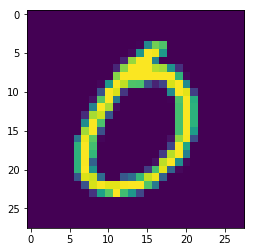

In [40]:
import matplotlib.pyplot as plt

img = images[99].data.cpu().numpy().astype(np.float32)
img += -img.min()
img *= (1/img.max())

plt.imshow(img)
plt.show()

In [34]:
images.size()

torch.Size([100, 28, 28])

In [17]:
for epoch in range(num_epochs):
    for i, (images, labels) in enumerate(train_loader):
        images = Variable(images.view(-1, sequence_length, input_size))
        labels = Variable(labels)
        break

torch.Size([100, 1, 28, 28])
torch.Size([100, 28, 28])
torch.Size([100, 1, 28, 28])
torch.Size([100, 28, 28])


# Plain generator for RNNs

In [1]:
import pandas as pd
from sklearn.model_selection import train_test_split 
import gc

df_train = pd.read_csv('train.csv')
df_submit = pd.read_csv('submission.csv')

ANIMALS = ['bird', 'blank', 'cattle', 'chimpanzee', 'elephant',
       'forest buffalo', 'gorilla', 'hippopotamus', 'human', 'hyena',
       'large ungulate', 'leopard', 'lion', 'other (non-primate)',
       'other (primate)', 'pangolin', 'porcupine', 'reptile', 'rodent',
       'small antelope', 'small cat', 'wild dog', 'duiker', 'hog']

ANIMALS_SUBSET = ['duiker','hog','other (primate)','human''chimpanzee','blank']

df_train['animal'] = ''
df_train.loc[df_train.sum(axis=1)>1,'animal'] = '2 animals'
df_train.loc[df_train.sum(axis=1)==1, 'animal'] = df_train[df_train.sum(axis=1)==1][ANIMALS].idxmax(axis=1)

df_sample = pd.DataFrame()

# just take the dataset as is
for animal in ANIMALS:
    df_sample = df_sample.append(df_train[df_train.animal == animal])

train_vids, valid_vids = train_test_split(df_sample.filename.values, test_size=0.2, random_state=42, stratify = df_sample.animal.values)
video_2_animal_train = dict(zip(df_train[df_train.filename.isin(train_vids)].filename,df_train[df_train.filename.isin(train_vids)].animal))
video_2_animal_valid = dict(zip(df_train[df_train.filename.isin(valid_vids)].filename,df_train[df_train.filename.isin(valid_vids)].animal))

#del df_sample,df_train,df_submit
gc.collect()

0

In [13]:
# import torch
import torch.utils.data as data

# from PIL import Image, ImageDraw, ImageFont
# import cv2
import moviepy.editor as mpe
import numpy as np 
from random import randint
from numpy import random
import os
import torch

class RnnDatasetVideo(data.Dataset):
    def __init__(self,
                 root,
                 video_dict,
                 transform=None,
                 dataset_name='micro_chimps',
                 fps = 2,
                 target_size = 64):
        self.root = root
        self.video_dict = video_dict
        self.transform = transform
        self.name = dataset_name
        self.video_ids = list(self.video_dict.keys())
        self.fps = fps
        self.target_size = target_size
        

        unique_values = sorted(list(set([x for x in self.video_dict.values()])))
        print(unique_values)
        self.idx_2_value = {i:value for i,value in enumerate(unique_values) }
        self.value_2_idx = {value:i for i,value in enumerate(unique_values) }
        del unique_values

    def __getitem__(self, index):
        video_id = self.video_ids[index]
    
        try:
            clip = mpe.VideoFileClip(filename = os.path.join(self.root, video_id),
                                    audio = False,
                                    target_resolution = (self.target_size,self.target_size))

            video_matrix = None

            # loop over the extracted images 
            for im in clip.iter_frames(fps=self.fps): 
                
                im = im[np.newaxis, ...]
                
                if video_matrix is None:
                    video_matrix = im
                else:
                    video_matrix = np.append(video_matrix,im, axis=0)
            
            if self.transform is not None:
                for i,im in enumerate(video_matrix):
                    video_matrix[i,...] = self.transform(im)
     
        except Exception as e:
            print ('Video open exception triggered with video {}'.format(video_id))
            print(str(e))
            # size is 299x299 to be compatible with most models
            video_matrix = random.random((self.fps * 15,self.target_size,self.target_size,3))
            video_matrix = video_matrix.astype('uint8')
            
            if self.transform is not None:
                for i,im in enumerate(video_matrix):
                    video_matrix[i,...] = self.transform(im)          

        gt = self.value_2_idx[self.video_dict[video_id]]
        
        print (type(video_matrix[0,0,0,0]))
        return  torch.stack ( [( torch.from_numpy(img.transpose((2, 0, 1))) ) for img in video_matrix] ),gt

    def __len__(self):
        return len(self.video_ids)

In [ ]:
torch.Size([30, 3, 64, 64])

torch.stack ( [( torch.from_numpy(img.transpose((2, 0, 1))) ) for img in video_matrix] ),g

In [14]:
# from JungleDataset import JungleDatasetVideo
from RnnAugmentation import CustomAugmentation

rnnDataset = RnnDatasetVideo(root = 'micro_chimps/micro',
                 video_dict = video_2_animal_train,
                 transform=CustomAugmentation(crop=64,size=64),
                 dataset_name='micro_chimps')

['bird', 'blank', 'cattle', 'chimpanzee', 'duiker', 'elephant', 'forest buffalo', 'gorilla', 'hippopotamus', 'hog', 'human', 'hyena', 'large ungulate', 'leopard', 'lion', 'other (non-primate)', 'other (primate)', 'pangolin', 'porcupine', 'reptile', 'rodent', 'small antelope', 'small cat', 'wild dog']


In [5]:
video_matrix, gt = rnnDataset.__getitem__(0)


In [7]:
video_matrix.type()

'torch.ByteTensor'

In [4]:
for i,im in enumerate(video_matrix):
    print (i,im.shape)
    break

NameError: name 'video_matrix' is not defined

In [9]:
video_matrix.size()

torch.Size([30, 3, 64, 64])

In [15]:
import matplotlib.pyplot as plt

video_matrix, gt = rnnDataset.__getitem__(0)

plt.imshow(video_matrix)
plt.show()

<class 'numpy.uint8'>


TypeError: Image data can not convert to float

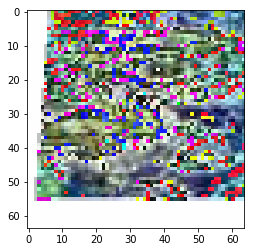

In [9]:
import matplotlib.pyplot as plt

video_matrix, gt = rnnDataset.__getitem__(0)

img = video_matrix[15].cpu().numpy().astype(np.float32).transpose((1, 2, 0))
img += -img.min()
img *= (1/img.max())

plt.imshow(img)
plt.show()

# Video-level extractor model based on Inception4 architecture

## Extend and test the classes

In [2]:
1+1

2

In [1]:
# standard pytorch imports
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torch.distributed as dist
import torch.optim
import torch.utils.data
import torch.utils.data.distributed
import torchvision.transforms as transforms
import torchvision.datasets as datasets
import torchvision.models as models

from JungleDataset import JungleDatasetVideo
from CustomAugmentation import CustomAugmentation,ValidAugmentation
from FineTuneModel import FineTuneModel
from Inception4 import inceptionv4

class Inceptionv4VideoExtractor(nn.Module):
    def __init__(self, inception):
        super(Inceptionv4VideoExtractor, self).__init__()

        # Manually calculated input size assuming  
        self.lstm_input_size =  1536
        # Everything except the last linear layer
        self.encoder = inception.features
            
    def forward(self, x):
        
        embedding = torch.stack ( [self.encoder(img_sequence).view(img_sequence.size(0), self.lstm_input_size) for img_sequence in x] )        

        return embedding
    
class Inceptionv4Extractor(nn.Module):
    def __init__(self, inception):
        super(Inceptionv4Extractor, self).__init__()

        # Everything except the last linear layer
        self.features = inception.features
            
    def forward(self, x):
        x = self.features(x).view(x.size(0), -1)
        return x
    


In [2]:
inception = inceptionv4(pretrained=True)
model = Inceptionv4VideoExtractor(inception) 

In [ ]:
input = torch.autograd.Variable(torch.randn(2,3,299,299))
out = model(input)

In [3]:
input = torch.autograd.Variable(torch.randn(2,2,3,299,299))
out = model(input)

In [7]:
out[0].data.cpu().numpy()

array([[ 0.07997134,  0.51145089,  0.30373362, ...,  0.03916373,
         0.5295155 ,  0.24550906],
       [ 0.49960881,  0.1203026 ,  0.25469777, ...,  0.67634642,
         0.1694521 ,  0.49253255]], dtype=float32)

In [11]:
out.size()

torch.Size([2, 2, 1536])

In [23]:
import pandas as pd

def get_train_videos():

    from sklearn.model_selection import train_test_split     

    df_train = pd.read_csv('train.csv')
    df_submit = pd.read_csv('submission.csv')

    # remove lion - because it cannot be split
    ANIMALS = ['bird', 'blank', 'cattle', 'chimpanzee', 'elephant',
           'forest buffalo', 'gorilla', 'hippopotamus', 'human', 'hyena',
           'large ungulate', 'leopard', 'other (non-primate)',
           'other (primate)', 'pangolin', 'porcupine', 'reptile', 'rodent',
           'small antelope', 'small cat', 'wild dog', 'duiker', 'hog']

    df_train['animal'] = ''
    df_train.loc[df_train.sum(axis=1)>1,'animal'] = '2 animals'
    df_train.loc[df_train.sum(axis=1)==1, 'animal'] = df_train[df_train.sum(axis=1)==1][ANIMALS].idxmax(axis=1)

    df_sample = pd.DataFrame()

    # just take the dataset as is w/o any limitations
    for animal in ANIMALS:
        df_sample = df_sample.append(df_train[df_train.animal == animal])

    df_sample = df_sample[0:16]
    # video_2_animal_train = dict(zip(df_sample.filename.values,['all_animals'] * len(list( df_sample.filename.values )) ))     
    video_2_animal_train = dict(zip(df_sample.filename.values,['all_animals'] * 16 )) 
    
    return video_2_animal_train

predict_dict = get_train_videos()
df_predict = pd.DataFrame(list(predict_dict.items()))

In [24]:
predict_dict

{'00wTpdyJzd.mp4': 'all_animals',
 '04ZSB561OY.mp4': 'all_animals',
 '04dKjZZn9s.mp4': 'all_animals',
 '04tUyUuIo1.mp4': 'all_animals',
 '07Rgpmvi83.mp4': 'all_animals',
 '089I2CcWBX.mp4': 'all_animals',
 '08D1IifSeI.mp4': 'all_animals',
 '08UzLe9e1J.mp4': 'all_animals',
 '0BNRQBPjvO.mp4': 'all_animals',
 '0BPgJCcZ2U.mp4': 'all_animals',
 '0BYgNR78jY.mp4': 'all_animals',
 '0BZHZuQ30t.mp4': 'all_animals',
 '0CVFLmYtdz.mp4': 'all_animals',
 '0DxuzTNJIj.mp4': 'all_animals',
 '0EPUUadkQj.mp4': 'all_animals',
 '0IUzKoYO4h.mp4': 'all_animals'}

In [16]:
df_predict

,0,1
0,00wTpdyJzd.mp4,all_animals


In [11]:
len(predict_dict),df_predict.shape

(203756, (203756, 2))

In [25]:
from ExtractDataset import ExtractDataset
import torchvision.transforms as transforms
from torchvision.transforms import Compose
from PIL import Image
import numpy as np
import torch

mean = (0.485, 0.456, 0.406)
std = (0.229, 0.224, 0.225)


class ConvertFromInts(object):
    def __call__(self, image, boxes=None, labels=None):
        return image.astype(np.float32)    

class Normalize(object):
    def __init__(self,mean,std):
        self.mean = np.array(mean, dtype=np.float32)
        self.std = np.array(std, dtype=np.float32)
    def __call__(self, image):
        image = image.astype(np.float32)
        image[:,:,0:3] -= self.mean
        image[:,:,0:3] *= (1/self.std)
        return image.astype(np.float32)       
    
extract_augs = Compose([
    ConvertFromInts(),            
    Normalize(mean,std),       
])

predict_folder = ExtractDataset(root = 'micro_chimps/micro/',
                           video_dict = predict_dict,
                           transform = extract_augs,
                           dataset_name = 'predict_chimps',
                           fps = 2,
                           target_size = (404, 720)
                       )
   
predict_loader = torch.utils.data.DataLoader(
    dataset = predict_folder,
    batch_size=2,
    shuffle=False,
    num_workers=2,
    pin_memory=True)

['all_animals']


In [26]:
for i, (input, target) in enumerate(predict_loader):
    print(target)
    break

['0BNRQBPjvO.mp4', '0CVFLmYtdz.mp4']


In [6]:
target

['Idk6jms4gO.mp4', 'QYYDdACZd3.mp4']

In [5]:
input

torch.Size([2, 30, 3, 404, 720])

## Test what we got

In [27]:
predict_folder.video_ids[0:16]

['0BNRQBPjvO.mp4',
 '0CVFLmYtdz.mp4',
 '08D1IifSeI.mp4',
 '0DxuzTNJIj.mp4',
 '07Rgpmvi83.mp4',
 '04dKjZZn9s.mp4',
 '04ZSB561OY.mp4',
 '0BPgJCcZ2U.mp4',
 '089I2CcWBX.mp4',
 '0BYgNR78jY.mp4',
 '0EPUUadkQj.mp4',
 '04tUyUuIo1.mp4',
 '00wTpdyJzd.mp4',
 '0IUzKoYO4h.mp4',
 '0BZHZuQ30t.mp4',
 '08UzLe9e1J.mp4']

In [28]:
!ls hd_inception_features/

00wTpdyJzd.mp4.npy  07Rgpmvi83.mp4.npy	0BNRQBPjvO.mp4.npy  0CVFLmYtdz.mp4.npy
04ZSB561OY.mp4.npy  089I2CcWBX.mp4.npy	0BPgJCcZ2U.mp4.npy  0DxuzTNJIj.mp4.npy
04dKjZZn9s.mp4.npy  08D1IifSeI.mp4.npy	0BYgNR78jY.mp4.npy  0EPUUadkQj.mp4.npy
04tUyUuIo1.mp4.npy  08UzLe9e1J.mp4.npy	0BZHZuQ30t.mp4.npy  0IUzKoYO4h.mp4.npy


In [35]:
import numpy as np

%time arr = np.load('hd_inception_features/04dKjZZn9s.mp4.npy')
arr.shape

CPU times: user 4 ms, sys: 0 ns, total: 4 ms
Wall time: 1.72 ms


(30, 3072)

In [36]:
arr.sum(axis=0)

array([  7.15906830e+01,   6.13335419e+01,   2.66913045e-02, ...,
         1.00426309e-01,   6.08593784e-02,   1.68253231e+00], dtype=float32)

In [32]:
arr.sum(axis=0)

array([  4.92849884e+01,   7.39309921e+01,   1.38281137e-01, ...,
         5.43627357e+00,   6.01242520e-02,   9.80895042e+00], dtype=float32)

## Iterate over videos to get their real sizes

In [49]:
import moviepy.editor as mpe
import os
import tqdm

root = 'micro_chimps/micro/'

with tqdm.tqdm(total=len(predict_dict.keys())) as pbar:
    for i,video_id in enumerate(predict_dict.keys()):

        clip = mpe.VideoFileClip(filename = os.path.join(root, video_id))
        # loop over the extracted images 
        for im in clip.iter_frames(fps=1):
            break

        pbar.update(1)
        if i>500:
            break
        

100%|██████████| 16/16 [00:02<00:00,  6.15it/s]


In [50]:
df = pd.read_csv('video_sizes.csv')
df

,0CVFLmYtdz.mp4,1,4040IUzKoYO4h.mp4,1.1,4040DxuzTNJIj.mp4,1.2,40404dKjZZn9s.mp4,1.3,4040BNRQBPjvO.mp4,1.4,...,1.11,40404ZSB561OY.mp4,1.12,404089I2CcWBX.mp4,1.13,40400wTpdyJzd.mp4,1.14,4040BYgNR78jY.mp4,1.15,404


In [ ]:
'../slow_max_space/raw/'

## Test classes

In [1]:
# standard pytorch imports
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torch.distributed as dist
import torch.optim
import torch.utils.data
import torch.utils.data.distributed
import torchvision.transforms as transforms
import torchvision.datasets as datasets
import torchvision.models as models

# standard ds and os tools
import pandas as pd
import numpy as np
import tqdm
import os

# custom written classes and imports
from ExtractDataset import ExtractDataset
from Inception4 import inceptionv4
from ExtractAugs import ConvertFromInts,Normalize
from torchvision.transforms import Compose

# garbage collector
import gc

# stupid hack - add params instead of doing a proper CLI parsing
# also works with jupyter notebooks
args = type('test', (), {})()
args.finetune = False
args.resume = False
args.batch_size = 2
args.workers = 6
args.lognumber = 'inception4_features_rnn'
args.save_path = 'hd_inception_features'
args.numclasses = 23
args.arch = 'inception4'
args.evaluate = False
args.data = '../slow_max_space/raw'

def get_train_videos():
    from sklearn.model_selection import train_test_split     

    df_train = pd.read_csv('train.csv')
    df_submit = pd.read_csv('submission.csv')
    
    # remove lion - because it cannot be split properly
    ANIMALS = ['bird', 'blank', 'cattle', 'chimpanzee', 'elephant',
           'forest buffalo', 'gorilla', 'hippopotamus', 'human', 'hyena',
           'large ungulate', 'leopard', 'other (non-primate)',
           'other (primate)', 'pangolin', 'porcupine', 'reptile', 'rodent',
           'small antelope', 'small cat', 'wild dog', 'duiker', 'hog']
    df_train['animal'] = ''
    df_train.loc[df_train.sum(axis=1)>1,'animal'] = '2 animals'
    df_train.loc[df_train.sum(axis=1)==1, 'animal'] = df_train[df_train.sum(axis=1)==1][ANIMALS].idxmax(axis=1)

    df_sample = pd.DataFrame()

    # just take the dataset as is w/o any limitations
    # do not take 2 animals because of ambiguity
    for animal in ANIMALS:
        df_sample = df_sample.append(df_train[df_train.animal == animal])

    df_sample = df_sample[0:128]
    # video_2_animal_train = dict(zip(df_sample.filename.values,['all_animals'] * len(list( df_sample.filename.values )) ))     
    video_2_animal_train = dict(zip(df_sample.filename.values,['all_animals'] * 128 ))     
    
    return video_2_animal_train

predict_dict = get_train_videos()
df_predict = pd.DataFrame(list(predict_dict.items()))
df_predict.to_csv('{}.csv'.format(args.lognumber))


print('Total dictionary length is {}'.format( len(predict_dict) ) )

mean = (0.485, 0.456, 0.406)
std = (0.229, 0.224, 0.225)

extract_augs = Compose([
    ConvertFromInts(),            
    # Normalize(mean,std),       
])

predict_folder = ExtractDataset(root = args.data,
                           video_dict = predict_dict,
                           transform = extract_augs,
                           dataset_name = 'predict_chimps',
                           fps = 2,
                           target_size = (404, 720)
                       )
   
predict_loader = torch.utils.data.DataLoader(
    dataset = predict_folder,
    batch_size=args.batch_size,
    shuffle=False,
    num_workers=args.workers,
    pin_memory=True)

mean = (0.485, 0.456, 0.406)
std = (0.229, 0.224, 0.225)






Total dictionary length is 128
['all_animals']


In [ ]:
for i, (input, target) in enumerate(predict_loader):
    break

In [28]:
input.size()

torch.Size([2, 30, 3, 404, 720])

In [ ]:
import matplotlib.pyplot as plt

img = input[0,5,...].cpu().numpy().astype(np.float32).transpose((1, 2, 0))

img += -img.min()
img *= (1/img.max())

plt.imshow(img)
plt.show()

In [25]:
img

array([[[ 88,  93,  95],
        [145, 151, 152],
        [ 71,  75,  55],
        ..., 
        [160,  36, 107],
        [168,  45, 107],
        [219,  91, 203]],

       [[219, 227, 228],
        [133, 145, 145],
        [ 29,  37,  16],
        ..., 
        [107, 238,  94],
        [116, 247, 103],
        [ 29, 158,  14]],

       [[105, 128, 126],
        [129, 158, 154],
        [125, 154, 127],
        ..., 
        [241, 113, 225],
        [ 15, 145,   0],
        [180,  51, 163]],

       ..., 
       [[124, 203,  44],
        [120, 198,  39],
        [133, 207,  71],
        ..., 
        [185,   5, 164],
        [181,   9, 133],
        [181,   9, 133]],

       [[137, 203,  39],
        [133, 198,  35],
        [141, 203,  79],
        ..., 
        [ 38, 139,  46],
        [233,  76, 239],
        [168,   9, 173]],

       [[150, 216,  53],
        [159, 225,  62],
        [181, 243, 119],
        ..., 
        [156,   3, 166],
        [ 38, 139,  46],
        [168,   9,

# Extract video meta-data

In [ ]:
import glob as glob
import pandas as pd
import tqdm
import skvideo.io as skv

g = glob.glob('../slow_max_space/raw/*.mp4')
# g = glob.glob('micro_chimps/micro/*.mp4')
video_ids = [(video.split('/')[-1]) for video in g]

widths = []
heights = []
nb_frames = []
avg_frame_rates = []

df = pd.DataFrame(columns=['video_id','height','width','nb_frames','avg_frame_rate'])

chunk = 0

with tqdm.tqdm(total=len(g)) as pbar:
    for i,video_id,video_path in zip(range(0,len(g)),video_ids,g):
        try:
            probe = skv.ffprobe(g[i])
            width = probe['video']['@width']
            height = probe['video']['@height']
            nb_frame = probe['video']['@nb_frames']       
            avg_frame_rate = probe['video']['@avg_frame_rate']        
        except Exception as e:
            print(str(e))
            probe = 0
            width = 0
            height = 0
            nb_frame = 0
            avg_frame_rate = 0
        

        df.loc[i] = video_id,height,width,nb_frame,avg_frame_rate
        
        if (i+1)%50000 == 0:
            print('Save initiated, iteration {}'.format(i) )
            df.to_csv('video_metadata_chunk_{}.csv'.format(chunk) )
            chunk+=1
            df = pd.DataFrame(columns=['video_id','height','width','nb_frames','avg_frame_rate'])

        pbar.update(1)

df.to_csv('video_metadata_chunk_{}.csv'.format(chunk) )

  0%|          | 485/456002 [00:30<6:56:54, 18.21it/s] 

In [1]:
1+1

2

In [2]:
df

,video_id,height,width,nb_frames,avg_frame_rate
0,jSk1yCQqhj.mp4,480,720,360,24/1
1,InjpKYfkAU.mp4,404,720,360,24/1
2,E1wrRLRzBA.mp4,404,720,360,24/1
3,FPHVgihuCT.mp4,404,720,360,24/1
4,TWyDyB3z2w.mp4,480,720,360,24/1
5,WcrMFV3MtH.mp4,404,720,360,24/1
6,AcQ876Wow0.mp4,404,720,360,24/1
7,P6seYTaxCs.mp4,540,960,360,24/1
8,qnvW5jcMzM.mp4,404,720,360,24/1
9,EOnK3CS7nO.mp4,404,720,360,24/1


In [15]:
df['video_id'] = video_ids[0]

In [25]:
df

,video_id,height,width,nb_frames,avg_frame_rate
0,jSk1yCQqhj.mp4,720,480,360,24/1
1,InjpKYfkAU.mp4,720,404,360,24/1
2,E1wrRLRzBA.mp4,720,404,360,24/1
3,FPHVgihuCT.mp4,720,404,360,24/1
4,TWyDyB3z2w.mp4,720,480,360,24/1
5,WcrMFV3MtH.mp4,720,404,360,24/1
6,AcQ876Wow0.mp4,720,404,360,24/1
7,P6seYTaxCs.mp4,960,540,360,24/1
8,qnvW5jcMzM.mp4,720,404,360,24/1
9,EOnK3CS7nO.mp4,720,404,360,24/1


In [21]:
x = torch.tensor((3))

TypeError: 'module' object is not callable

In [23]:
probe['video']

OrderedDict([('@index', '0'),
             ('@codec_name', 'h264'),
             ('@codec_long_name', 'H.264 / AVC / MPEG-4 AVC / MPEG-4 part 10'),
             ('@profile', 'High'),
             ('@codec_type', 'video'),
             ('@codec_time_base', '1/48'),
             ('@codec_tag_string', 'avc1'),
             ('@codec_tag', '0x31637661'),
             ('@width', '720'),
             ('@height', '480'),
             ('@coded_width', '720'),
             ('@coded_height', '480'),
             ('@has_b_frames', '2'),
             ('@sample_aspect_ratio', '0:1'),
             ('@display_aspect_ratio', '0:1'),
             ('@pix_fmt', 'yuv420p'),
             ('@level', '30'),
             ('@chroma_location', 'left'),
             ('@refs', '4'),
             ('@is_avc', '1'),
             ('@nal_length_size', '4'),
             ('@r_frame_rate', '24/1'),
             ('@avg_frame_rate', '24/1'),
             ('@time_base', '1/12288'),
             ('@start_pts', '0'),
        

# Numpy generator

## Write generator

In [1]:
import pandas as pd
from sklearn.model_selection import train_test_split 
import gc

df_train = pd.read_csv('train.csv')
df_submit = pd.read_csv('submission.csv')

ANIMALS = ['bird', 'blank', 'cattle', 'chimpanzee', 'elephant',
       'forest buffalo', 'gorilla', 'hippopotamus', 'human', 'hyena',
       'large ungulate', 'leopard', 'lion', 'other (non-primate)',
       'other (primate)', 'pangolin', 'porcupine', 'reptile', 'rodent',
       'small antelope', 'small cat', 'wild dog', 'duiker', 'hog']

ANIMALS_SUBSET = ['duiker','hog','other (primate)','human''chimpanzee','blank']

df_train['animal'] = ''
df_train.loc[df_train.sum(axis=1)>1,'animal'] = '2 animals'
df_train.loc[df_train.sum(axis=1)==1, 'animal'] = df_train[df_train.sum(axis=1)==1][ANIMALS].idxmax(axis=1)

df_sample = pd.DataFrame()

# just take the dataset as is
for animal in ANIMALS:
    df_sample = df_sample.append(df_train[df_train.animal == animal])

train_vids, valid_vids = train_test_split(df_sample.filename.values, test_size=0.2, random_state=42, stratify = df_sample.animal.values)
video_2_animal_train = dict(zip(df_train[df_train.filename.isin(train_vids)].filename,df_train[df_train.filename.isin(train_vids)].animal))
# video_2_animal_valid = dict(zip(df_train[df_train.filename.isin(valid_vids)].filename,df_train[df_train.filename.isin(valid_vids)].animal))

del df_sample,df_train,train_vids,valid_vids,df_submit
gc.collect()

76

In [5]:
len(numpyDataset)

163004

In [2]:
from NumpyGenerator import NumpyDataset

numpyDataset = NumpyDataset(root = 'hd_inception_features/',
                 video_dict = video_2_animal_train,
                 dataset_name='micro_chimps')

['bird', 'blank', 'cattle', 'chimpanzee', 'duiker', 'elephant', 'forest buffalo', 'gorilla', 'hippopotamus', 'hog', 'human', 'hyena', 'large ungulate', 'leopard', 'lion', 'other (non-primate)', 'other (primate)', 'pangolin', 'porcupine', 'reptile', 'rodent', 'small antelope', 'small cat', 'wild dog']


In [7]:
inception_features, gt = numpyDataset.__getitem__(163004-1)

In [8]:
inception_features.shape

(30, 3072)

In [1]:
!rm -rf tb_logs/*

rm: cannot remove 'tb_logs/inc4_bof_fcn3/events.out.tfevents.1510847804.9bf56873b8bd': Permission denied


## Test that all the files are present

In [3]:
import pandas as pd

df_train = pd.read_csv('train.csv')
df_submit = pd.read_csv('submission.csv')

# remove lion - because it cannot be split
ANIMALS = ['bird', 'blank', 'cattle', 'chimpanzee', 'elephant',
       'forest buffalo', 'gorilla', 'hippopotamus', 'human', 'hyena',
       'large ungulate', 'leopard', 'other (non-primate)',
       'other (primate)', 'pangolin', 'porcupine', 'reptile', 'rodent',
       'small antelope', 'small cat', 'wild dog', 'duiker', 'hog']

ANIMALS_SUBSET = ['duiker','hog','other (primate)','human''chimpanzee','blank']

df_train['animal'] = ''
df_train.loc[df_train.sum(axis=1)>1,'animal'] = '2 animals'
df_train.loc[df_train.sum(axis=1)==1, 'animal'] = df_train[df_train.sum(axis=1)==1][ANIMALS].idxmax(axis=1)


df_sample = pd.DataFrame()

# just take the dataset as is w/o any limitations
for animal in ANIMALS:
    df_sample = df_sample.append(df_train[df_train.animal == animal])


In [7]:
df_sample.head()

,filename,bird,blank,cattle,chimpanzee,elephant,forest buffalo,gorilla,hippopotamus,human,...,pangolin,porcupine,reptile,rodent,small antelope,small cat,wild dog,duiker,hog,animal
43,00wTpdyJzd.mp4,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,bird
241,04ZSB561OY.mp4,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,bird
245,04dKjZZn9s.mp4,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,bird
257,04tUyUuIo1.mp4,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,bird
408,07Rgpmvi83.mp4,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,bird


In [11]:
import glob as glob

g = glob.glob('hd_inception_features/*.mp4.npy')
video_ids = [(video.split('/')[-1].split('.np')[0]) for video in g]
len(g)

203756

In [12]:
video_ids[0]

'zFzDtdWAIb.mp4'

In [15]:
len(df_sample.filename),len(video_ids)

(203756, 203756)

In [13]:
set(df_sample.filename) - set(video_ids)

set()

In [14]:
set(video_ids) - set(df_sample.filename)

set()

# BOF and LSTM models

In [8]:
import torchvision.models as models
import torch
import torch.nn as nn
from torch.autograd import Variable

class BOF_FCN_3(nn.Module):
    def __init__(self,
                 sequence_length,
                 feature_vector_length,
                 hidden_layer_length,
                 num_classes):
        super(BOF_FCN_3, self).__init__()

        self.classifier = nn.Sequential(
            nn.Linear(sequence_length * feature_vector_length, hidden_layer_length),
            nn.ReLU(True),
            nn.Dropout(),
            nn.Linear(hidden_layer_length, hidden_layer_length),
            nn.ReLU(True),
            nn.Dropout(),
            nn.Linear(hidden_layer_length, num_classes),
        )

    def forward(self, x):
        x = x.view(x.size(0), -1)
        x = self.classifier(x)
        return x
class BOF_MAXPOOL(nn.Module):
    def __init__(self,
                 sequence_length,
                 feature_vector_length,
                 hidden_layer_length,
                 num_classes):
        super(BOF_MAXPOOL, self).__init__()

        # avg pooling over all of the frames
        self.m = nn.MaxPool1d(kernel_size = sequence_length)
        
        # should be careful here with pooling dimensions
        self.classifier = nn.Sequential(
            nn.Linear(feature_vector_length, hidden_layer_length),
            nn.ReLU(True),
            nn.Dropout(),
            nn.Linear(hidden_layer_length, hidden_layer_length),
            nn.ReLU(True),
            nn.Dropout(),
            nn.Linear(hidden_layer_length, num_classes),
        )
    def forward(self, x):
        # reshape vector if dimensions demand that 
        x = x.permute(0,2,1)
        x = self.m(x)
        x = x.view(x.size(0), -1)
        x = self.classifier(x)
        return x    
class BOF_AVGPOOL(nn.Module):
    def __init__(self,
                 sequence_length,
                 feature_vector_length,
                 hidden_layer_length,
                 num_classes):
        super(BOF_AVGPOOL, self).__init__()

        
        self.bn = nn.BatchNorm1d(sequence_length)
        
        # avg pooling over all of the frames
        self.a = nn.AvgPool1d(kernel_size = sequence_length)

        # should be careful here with pooling dimensions
        self.classifier = nn.Sequential(
            nn.Linear(feature_vector_length, hidden_layer_length),
            nn.BatchNorm1d(hidden_layer_length),            
            nn.ReLU(True),
            nn.Dropout(),
            nn.Linear( hidden_layer_length, int(hidden_layer_length/2) ),
            nn.BatchNorm1d( int( hidden_layer_length/2) ),            
            nn.ReLU(True),
            nn.Dropout(),
            nn.Linear( int(hidden_layer_length/2) , num_classes),
        )

    def forward(self, x):
        print(x.size())
        # reshape vector if dimensions demand that 
        x = x.permute(0,2,1)
        print(x.size())
        x = self.a(x)
        print(x.size())
        x = x.view(x.size(0), -1)
        print(x.size())        
        x = self.classifier(x)
        return x  
 

    # class BOF_LSTM(nn.Module):  
class BOF_LSTM(nn.Module):
    def __init__(self,
                 input_size,
                 hidden_size,
                 num_layers,
                 num_classes):
        super(RNN, self).__init__()
        self.hidden_size = hidden_size
        self.num_layers = num_layers
        self.lstm = nn.LSTM(input_size, hidden_size, num_layers, batch_first=True)
        self.fc = nn.Linear(hidden_size, num_classes)
    
    def forward(self, x):
        # Set initial states 
        h0 = Variable(torch.zeros(self.num_layers, x.size(0), self.hidden_size)) 
        c0 = Variable(torch.zeros(self.num_layers, x.size(0), self.hidden_size))
        
        # Forward propagate RNN
        out, _ = self.lstm(x, (h0, c0))  
        
        # Decode hidden state of last time step
        out = self.fc(out[:, -1, :])  
        return out

    
    
class RNN(nn.Module):
    def __init__(self,
                 input_size,
                 hidden_size,
                 num_layers,
                 num_classes):
        super(RNN, self).__init__()
        self.hidden_size = hidden_size
        self.num_layers = num_layers
        self.lstm = nn.LSTM(input_size, hidden_size, num_layers, batch_first=True)
        self.fc = nn.Linear(hidden_size, num_classes)
    
    def forward(self, x):
        # Set initial states 
        h0 = Variable(torch.zeros(self.num_layers, x.size(0), self.hidden_size)) 
        c0 = Variable(torch.zeros(self.num_layers, x.size(0), self.hidden_size))
        
        # Forward propagate RNN
        out, _ = self.lstm(x, (h0, c0))  
        
        # Decode hidden state of last time step
        out = self.fc(out[:, -1, :])  
        return out

class VideoRnn(nn.Module):
    def __init__(self,
                 original_model,
                 arch,
                 num_classes,
                 freeze,
                 frame_size,
                 lstm_hidden_size,
                 lstm_num_layers                
                ):
        super(VideoRnn, self).__init__()

        # Calculate the VGG16 output filter size for various frame sizes
        # Should be model-dependent
        self.lstm_input_size =  512 * int(frame_size / 224 * 7) * int(frame_size / 224 * 7)
        self.frame_size = frame_size
        self.lstm_hidden_size = lstm_hidden_size        
        self.lstm_num_layers = lstm_num_layers
      
        self.lstm = nn.LSTM(self.lstm_input_size,
                            self.lstm_hidden_size,
                            self.lstm_num_layers,
                            batch_first=True,
                            bidirectional = True)
        
        self.fc = nn.Linear(self.lstm_hidden_size * 2, num_classes)    
        
        if arch.startswith('vgg16'):
            self.encoder = original_model.features
            self.modelName = 'vgg16'         
        else :
            raise("Finetuning not supported on this architecture yet")

        # Freeze those weights
        if freeze == True:
            print('Core model layers are frozen')
            for p in self.encoder.parameters():
                p.requires_grad = False

    def forward(self, x):
        # Make sure that we create a vector with dimensions
        # [batch_size,sequence_length,self.lstm_input_size]
        # This is bit is supposed to ensure this happens 
        # self.lstm_input_size =  512 * int(frame_size / 224 * 7) * int(frame_size / 224 * 7)
        lstm_input = torch.stack ( [self.encoder(img_sequence).view(img_sequence.size(0), self.lstm_input_size) for img_sequence in x] )

        # Set initial states 
        # Do not forget about setting 2 directions
        h0 = Variable(torch.zeros(self.lstm_num_layers * 2, lstm_input.size(0), self.lstm_hidden_size)) 
        c0 = Variable(torch.zeros(self.lstm_num_layers * 2, lstm_input.size(0), self.lstm_hidden_size))        
        
        # Forward propagate RNN
        out, _ = self.lstm(lstm_input, (h0, c0))  
        
        # Decode hidden state of last time step
        out = self.fc(out[:, -1, :])  
        return out

In [9]:
model = BOF_AVGPOOL(sequence_length = 30,
                 feature_vector_length = 3072,
                 hidden_layer_length = 1024,
                 num_classes = 23)


In [10]:
input = torch.autograd.Variable(torch.randn(3,30,3072))
out = model(input)
out.size()

torch.Size([3, 30, 3072])
torch.Size([3, 3072, 30])
torch.Size([3, 3072, 1])
torch.Size([3, 3072])


torch.Size([3, 23])

In [18]:
input.permute(0,2,1).size()

torch.Size([2, 3072, 30])

torch.Size([2, 23])

# Broken vids and short vids

In [1]:
broken_vids = ['MI7v02DWLA.mp4','JFygPk4SIw.mp4','YXxHeMuaUo.mp4','6SZwA7zetq.mp4','9gOstO4Ofd.mp4','FJeuHSOZEF.mp4',
'KCWzbpP3Wg.mp4','cuA3mWU5RB.mp4','bQ8qIoPOwl.mp4','ki4sjH4C2h.mp4','h6cXzZTvlC.mp4','KLqEGYpMYP.mp4','1EH94uTNUw.mp4',
'9R8EEISgSK.mp4','2IHuPjHtsO.mp4','kZwN5n7mTK.mp4','FRwBWw3Tkc.mp4','UgN3uLtbVH.mp4','8ksWd8WIYI.mp4','2xxUx0PMA7.mp4',
'OHfOvpxk4Q.mp4','qVpNgxDGTv.mp4','MmdijsmW5Q.mp4','tbn2TgTPuz.mp4','x66gKw6KXV.mp4','tBQ9Jg3Q1G.mp4','DXTsqLOuHz.mp4',
'nFJSYD8GEa.mp4','QQ52q0Mrlv.mp4','PUe04xXuFP.mp4','QQ52q0Mrlv.mp4','PUe04xXuFP.mp4','BGWWWXmC7y.mp4','Sjj4T5E3W4.mp4',
'uE9D2GLMzx.mp4','ejw4doMD1j.mp4','RBJt6mX6HT.mp4','mmkWUnJJCR.mp4','cpp8t5hRxo.mp4','ZdROQPK1jV.mp4','JFygPk4SIw.mp4',
'l1l7KgejiY.mp4','w2KgPlgssp.mp4','ajSo47NvfR.mp4','vjPEmMiEDW.mp4','SxiyzCGx8z.mp4','QMZvVaW9JO.mp4','81VZJV7NeM.mp4',
'AVqxN7b5Vl.mp4','5tEYNZYGxr.mp4','MKHLIKipFW.mp4','PbMAeuMfez.mp4','1HRLtETX0o.mp4','6cIrjN8Lvg.mp4','RtEegMG0JH.mp4']

In [2]:
len(broken_vids)

55

In [3]:
broken_vids = ['MI7v02DWLA.mp4','JFygPk4SIw.mp4','YXxHeMuaUo.mp4','6SZwA7zetq.mp4','9gOstO4Ofd.mp4','FJeuHSOZEF.mp4',
'KCWzbpP3Wg.mp4','cuA3mWU5RB.mp4','bQ8qIoPOwl.mp4','ki4sjH4C2h.mp4','h6cXzZTvlC.mp4','KLqEGYpMYP.mp4','1EH94uTNUw.mp4',
'9R8EEISgSK.mp4','2IHuPjHtsO.mp4','kZwN5n7mTK.mp4','FRwBWw3Tkc.mp4','UgN3uLtbVH.mp4','8ksWd8WIYI.mp4','2xxUx0PMA7.mp4',
'OHfOvpxk4Q.mp4','qVpNgxDGTv.mp4','MmdijsmW5Q.mp4','tbn2TgTPuz.mp4','x66gKw6KXV.mp4','tBQ9Jg3Q1G.mp4','DXTsqLOuHz.mp4',
'nFJSYD8GEa.mp4','QQ52q0Mrlv.mp4','PUe04xXuFP.mp4','QQ52q0Mrlv.mp4','PUe04xXuFP.mp4','BGWWWXmC7y.mp4','Sjj4T5E3W4.mp4',
'uE9D2GLMzx.mp4','ejw4doMD1j.mp4','RBJt6mX6HT.mp4','mmkWUnJJCR.mp4','cpp8t5hRxo.mp4','ZdROQPK1jV.mp4','JFygPk4SIw.mp4',
'l1l7KgejiY.mp4','w2KgPlgssp.mp4','ajSo47NvfR.mp4','vjPEmMiEDW.mp4','SxiyzCGx8z.mp4','QMZvVaW9JO.mp4','81VZJV7NeM.mp4',
'AVqxN7b5Vl.mp4','5tEYNZYGxr.mp4','MKHLIKipFW.mp4','PbMAeuMfez.mp4','1HRLtETX0o.mp4','6cIrjN8Lvg.mp4','RtEegMG0JH.mp4']

video_2_animal_train = dict(zip(broken_vids ,['all_animals'] * len(broken_vids) ))  

In [5]:
# check short video
import numpy as np

vid = np.load('hd_inception_features/Yek1Hl36QZ.mp4.npy')


In [12]:
vid.sum(axis=1)

array([ 426.92010498,  482.77331543,  552.38726807,  531.5123291 ,
        491.56945801,  423.8085022 ,  455.85769653,  370.30661011,
        423.04693604,  437.80371094,  439.93743896,  593.45739746,
        744.4987793 ,  572.78015137,  297.63412476,  307.09143066,
        452.847229  ,  299.44268799,  317.77523804,  272.52523804,
        296.75106812,  311.35861206,  282.86611938,  273.59725952,
        323.55523682,  277.76809692,  279.14898682,  280.02072144,
        282.9302063 ,  282.9302063 ], dtype=float32)

In [10]:
vid[-1].sum()

282.93021

In [13]:
vid = np.load('hd_inception_features/5tEYNZYGxr.mp4.npy')

In [14]:
vid.sum(axis=1)

array([ 376.18289185,  376.18289185,  376.18289185,  376.18289185,
        376.18289185,  376.18289185,  376.18289185,  376.18289185,
        376.18289185,  376.18289185,  376.18289185,  376.18289185,
        376.18289185,  376.18289185,  376.18289185,  376.18289185,
        376.18289185,  376.18289185,  376.18289185,  376.18289185,
        376.18289185,  376.18289185,  376.18289185,  376.18289185,
        376.18289185,  376.18289185,  376.18289185,  376.18289185,
        376.18289185,  376.18289185], dtype=float32)

In [ ]:
import os
import glob as glob
import pandas as pd
import tqdm 

g = glob.glob('hd_inception_features/*.mp4.npy')
size_df = pd.DataFrame(columns=['filename','size'])
video_ids = [(video.split('/')[-1]) for video in g]

with tqdm.tqdm(total=len(g)) as pbar:
    for i,video_id,video_path in zip(range(0,len(g)),video_ids,g):

        file_size = os.stat(video_path).st_size
        size_df.loc[i] = video_id,file_size

        pbar.update(1)

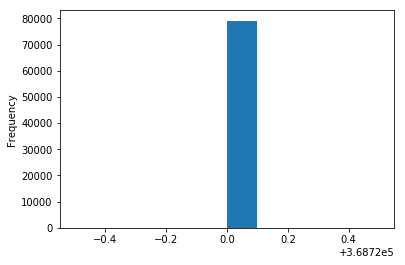

In [29]:
import matplotlib.pyplot as plt

size_df['size'].plot(kind='hist')
plt.show()


In [31]:
size_df['size'].describe()

count      79089
unique         1
top       368720
freq       79089
Name: size, dtype: int64

In [16]:
statinfo

368720

# Extract lions and multi label

In [3]:
import pandas as pd

def train_test_split():
    from sklearn.model_selection import train_test_split     
    df_train = pd.read_csv('train.csv')
    df_submit = pd.read_csv('submission.csv')

    # remove lion - because it cannot be split
    ANIMALS = ['bird', 'blank', 'cattle', 'chimpanzee', 'elephant',
           'forest buffalo', 'gorilla', 'hippopotamus', 'human', 'hyena',
           'large ungulate', 'leopard', 'other (non-primate)',
           'other (primate)', 'pangolin', 'porcupine', 'reptile', 'rodent',
           'small antelope', 'small cat', 'wild dog', 'duiker', 'hog']

    ANIMALS_SUBSET = ['duiker','hog','other (primate)','human''chimpanzee','blank']

    df_train['animal'] = ''
    df_train.loc[df_train.sum(axis=1)>1,'animal'] = '2 animals'
    df_train.loc[df_train.sum(axis=1)==1, 'animal'] = df_train[df_train.sum(axis=1)==1][ANIMALS].idxmax(axis=1)


    df_sample = pd.DataFrame()

    # just take the dataset as is w/o any limitations
    df_sample = df_sample.append(df_train[df_train.animal == '2 animals'])
    df_sample = df_sample.append(df_train[df_train.animal == 'lion'])
    

    train_vids, valid_vids = train_test_split(df_sample.filename.values,
                                              test_size=0.2,
                                              random_state=42,
                                              stratify = df_sample.animal.values)

    video_2_animal_train = dict(zip(df_sample.filename.values,['all_animals'] * len(list( df_sample.filename.values )) ))    

    return video_2_animal_train

video_2_animal_train = train_test_split()

In [5]:
len(video_2_animal_train)

374

# Unify and analyze the meta-data

In [20]:
from torch.optim.lr_scheduler import ReduceLROnPlateau

In [27]:
!rm -f video_metadata_chunk_*
!rm -f video_size_chunk_*

In [19]:
import glob as glob
import pandas as pd

g = glob.glob('video_size_small_chunk_*.csv')
g

['video_size_small_chunk_5.csv',
 'video_size_small_chunk_9.csv',
 'video_size_small_chunk_6.csv',
 'video_size_small_chunk_2.csv',
 'video_size_small_chunk_4.csv',
 'video_size_small_chunk_8.csv',
 'video_size_small_chunk_7.csv',
 'video_size_small_chunk_0.csv',
 'video_size_small_chunk_1.csv',
 'video_size_small_chunk_3.csv']

In [22]:
import glob as glob
import pandas as pd

g = glob.glob('video_size_chunk_*.csv')
g

['video_size_chunk_0.csv',
 'video_size_chunk_8.csv',
 'video_size_chunk_4.csv',
 'video_size_chunk_5.csv',
 'video_size_chunk_2.csv',
 'video_size_chunk_3.csv',
 'video_size_chunk_7.csv',
 'video_size_chunk_1.csv',
 'video_size_chunk_9.csv',
 'video_size_chunk_6.csv']

In [20]:
df = pd.DataFrame()
for file in g:
    df2 = pd.read_csv(file)
    df = df.append(df2)

In [22]:
df.head()

,Unnamed: 0,video_id,size
0,250000,QMfqkRhZcd.mp4,4530
1,250001,cDCnwj4OD2.mp4,7491
2,250002,Yomz46OEZx.mp4,6012
3,250003,WN44dRxDFA.mp4,7312
4,250004,YYFMmpMlha.mp4,4352


In [23]:
df.to_csv('file_sizes_small.csv')

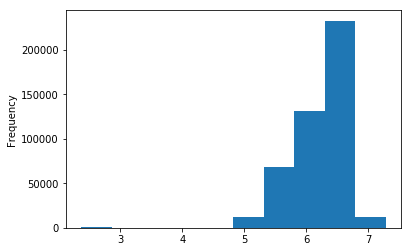

In [33]:
import numpy as np 

df[df['size']>100]['size'].apply(lambda x: np.log10(x+1)).plot(kind='hist')
plt.show()

In [2]:
df = pd.DataFrame()
for file in g:
    df2 = pd.read_csv(file)
    df = df.append(df2)

In [4]:
df.to_csv('video_metadata.csv')


In [3]:
df.head()

,Unnamed: 0,video_id,height,width,nb_frames,avg_frame_rate
0,300000,OKuO3dgXzI.mp4,404,720,360,24/1
1,300001,yE3rvyBR7S.mp4,480,720,360,24/1
2,300002,160TW50Z3v.mp4,404,720,360,24/1
3,300003,VbiJqobm33.mp4,480,720,351,24/1
4,300004,roxyLSMzPU.mp4,404,720,360,24/1


In [6]:
len(df.video_id.unique())

456441

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

g = (sns.jointplot(df[df.height>400].height, df.width, kind="hex", stat_func=None, xlim=(400,500),ylim=(400,600)))
plt.show()


In [12]:
df.nb_frames.value_counts()

360    436162
359      9491
351      6482
358      1515
0         442
357       441
354       121
356        90
353        40
355        32
352        29
350        24
346        19
210        16
26         15
345        15
154        13
202        12
184        12
348        12
322        11
330        11
73         11
192        11
82         11
34         11
178        11
134        11
38         11
62         11
        ...  
335         1
5           1
176         1
328         1
6           1
4           1
247         1
2           1
179         1
39          1
227         1
110         1
11          1
111         1
129         1
20          1
51          1
19          1
311         1
57          1
133         1
16          1
153         1
297         1
321         1
280         1
119         1
327         1
267         1
61          1
Name: nb_frames, Length: 348, dtype: int64

In [13]:
df.avg_frame_rate.value_counts()

24/1    455999
0          442
Name: avg_frame_rate, dtype: int64

In [16]:
df[['height','width']].apply(lambda row: str(row['height'])+' x '+str(row['width']),axis=1).value_counts()

404 x 720    379249
480 x 720     48869
540 x 960     16840
720 x 960      9227
540 x 720      1748
0 x 0           442
640 x 960        66
dtype: int64

# Play with bidirectional LSTM

In [4]:
import torch
import torch.nn as nn
from torch.autograd import Variable

class BOF_LSTM_REG(nn.Module):
    def __init__(self,
                 input_size,
                 hidden_size,
                 num_layers,
                 num_classes,
                 dropout,
                 use_bnorm,
                 use_bidirectional,
                 use_all_sequence):
        super(BOF_LSTM_REG, self).__init__()
        
        self.hidden_size = hidden_size
        self.num_layers = num_layers
        self.use_bidirectional = use_bidirectional
        
        self.bnorm = nn.BatchNorm1d(input_size)
        
        if use_all_sequence==False:
            if use_bidirectional==True:
                self.lstm = nn.LSTM(input_size,
                                    hidden_size,
                                    num_layers,
                                    batch_first=True,
                                    dropout=dropout,
                                    bidirectional=True)
                self.fc = nn.Linear(hidden_size*2, num_classes)
            else:
                self.lstm = nn.LSTM(input_size,
                                    hidden_size,
                                    num_layers,
                                    batch_first=True,
                                    dropout=dropout,
                                    bidirectional=False)
                self.fc = nn.Linear(hidden_size, num_classes)
    
    def forward(self, x):
        # Set initial states 
        
        if self.use_bidirectional==True:
            h0 = Variable(torch.zeros(self.num_layers*2, x.size(0), self.hidden_size).cuda()) 
            c0 = Variable(torch.zeros(self.num_layers*2, x.size(0), self.hidden_size).cuda())
        else:
            h0 = Variable(torch.zeros(self.num_layers, x.size(0), self.hidden_size)) 
            c0 = Variable(torch.zeros(self.num_layers, x.size(0), self.hidden_size))
        
        x = x.permute(0,2,1).contiguous()
        x = self.bnorm(x)
        x = x.permute(0,2,1)
        # Forward propagate RNN
        out, _ = self.lstm(x, (h0, c0))  
        
        # Decode hidden state of last time step
        # out = self.fc(out[:, -1, :])  
        return out

In [5]:
model = BOF_LSTM_REG(input_size = 20,
       hidden_size = 16,
       num_layers = 3,
       num_classes = 23,
       dropout = 0.4,
       use_bnorm = True,
       use_bidirectional = False,
       use_all_sequence = False)

In [39]:
input = torch.autograd.Variable(torch.randn(3,30,20))
out = model(input)
out.size()

torch.Size([3, 30, 16])

In [62]:
import numpy as np

weights = torch.from_numpy( np.array( [(i/out.size(1)) for i in range(1,out.size(1)+1)] ) ).float()
weights = Variable(weights, requires_grad=False)

In [8]:
torch.sum(out, dim = 1)

Variable containing:

Columns 0 to 9 
-0.6703  0.8653 -0.4320 -1.2963  4.1714  2.8321  4.6580  1.0954 -4.6503 -1.5246
-0.4790  0.7597 -0.7063 -1.0480  4.7884  3.2388  4.6207  1.2650 -4.8616 -1.3920
-0.2566  0.4555 -0.8268 -1.1986  4.8897  3.1039  4.5815  1.2730 -4.9915 -1.1755

Columns 10 to 15 
-2.0758  4.1182  0.2653  2.6904  1.9563 -0.5039
-1.4178  3.6559  0.1933  2.7255  1.7069 -0.4925
-1.2779  3.5283 -0.1601  2.8488  1.8205 -0.7733
[torch.FloatTensor of size 3x16]

In [71]:
out[0].sum()

Variable containing:
 11.3898
[torch.FloatTensor of size 1]

In [80]:
test = torch.stack ( [torch.matmul (weights.view(1,-1), video) for video in out] )

In [82]:
test.size()

torch.Size([3, 1, 16])

In [76]:
test.sum()a

Variable containing:
 6.3475
[torch.FloatTensor of size 1]

In [35]:
out = Variable(weights, requires_grad=False)

In [36]:
out.size()

torch.Size([30])

In [38]:
out

Variable containing:
 0.0333
 0.0667
 0.1000
 0.1333
 0.1667
 0.2000
 0.2333
 0.2667
 0.3000
 0.3333
 0.3667
 0.4000
 0.4333
 0.4667
 0.5000
 0.5333
 0.5667
 0.6000
 0.6333
 0.6667
 0.7000
 0.7333
 0.7667
 0.8000
 0.8333
 0.8667
 0.9000
 0.9333
 0.9667
 1.0000
[torch.FloatTensor of size 30]

In [37]:
out * weights

AssertionError: 

In [7]:
out.size()

torch.Size([3, 30, 16])

# End-to-end full res. models

## Inception4 based

- Load the pre-trained inception4 network
- Load pre-trained LSTM classifier
- Train together with low lr (inception 1e-10, classofier - 1e-5)

In [5]:
import torchvision.models as models
import torch
import torch.nn as nn
from torch.autograd import Variable

from BOFModels import BOF_LSTM_REG
from Inception4 import inceptionv4

# Load the imagenet pre-trained inception4 model
inception4 = inceptionv4(pretrained=True)

# Load the dataset pre-trained LSTM model 
saved_weights = 'weights/inc4_ltsm_reg_adlr_best.pth.tar'
model_params =    {'input_size' : 1536,
     'hidden_size' : 2048,
     'num_layers' : 3,
     'num_classes' : 23,
     'dropout' : 0.4,
     'use_bnorm' : True,
     'use_bidirectional' : False,
     'use_all_sequence' : False,
     'sequence_length' : 2}
    
rnn_model = BOF_LSTM_REG(**model_params)
# rnn_model = torch.nn.DataParallel(rnn_model)

print("=> loading checkpoint '{}'".format(saved_weights))
# checkpoint = torch.load(saved_weights)
# rnn_model.load_state_dict(checkpoint['state_dict'])


class INCEPTION_LSTM(nn.Module):
    def __init__(self,
                 encoder_model,
                 rnn_model,
                 input_size,
                 freeze,
                 skip_connection,
                 sequence_length,
                 hidden_size,
                 num_classes,
                 num_layers):
        
        super(INCEPTION_LSTM, self).__init__()
        
        self.input_size = input_size
        self.skip_connection = skip_connection
        self.hidden_size = hidden_size
        self.num_classes = num_classes
        self.num_layers = num_layers        
        
        # Inherit the pre-trained inception model
        self.encoder = encoder_model.features
        self.modelName = 'inception4'         

        # Freeze those weights
        if freeze == True:
            print('Core model layers are frozen')
            for p in self.encoder.parameters():
                p.requires_grad = False        

        # Inherit the pre-trained lstm model
        # Skip connection to avoid the LSTM eating the whole gradients
        if skip_connection == True:
            
            self.a = nn.AvgPool1d(kernel_size = sequence_length)

            self.bnorm = rnn_model.bnorm
            self.rnn_model =  rnn_model.lstm                

            self.fc = nn.Linear(input_size+hidden_size, num_classes)
        else:
            self.rnn_model = rnn_model
                
    def forward(self, x):
        # Set initial states 
        rnn_input = torch.stack ( [self.encoder(img_sequence).view(img_sequence.size(0), self.input_size) for img_sequence in x] )        

        
        # Skip connection to avoid the LSTM eating the whole gradients
        if self.skip_connection == True:
           
            # Average the encoder features over the input frames
            rnn_cat = rnn_input.permute(0,2,1)
            rnn_cat = self.a(rnn_cat)
            rnn_cat = rnn_cat.view(rnn_cat.size(0), -1)
         

            h0 = Variable(torch.zeros(self.num_layers, rnn_input.size(0), self.hidden_size)) 
            c0 = Variable(torch.zeros(self.num_layers, rnn_input.size(0), self.hidden_size))

            rnn_input = rnn_input.permute(0,2,1).contiguous()
            rnn_input = self.bnorm(rnn_input)
            rnn_input = rnn_input.permute(0,2,1)
            rnn_output, _ = self.rnn_model(rnn_input, (h0, c0))  
            out = torch.cat((rnn_output[:, -1, :],rnn_cat),1)        
            out = self.fc(out)
        else:
            out = self.rnn_model(rnn_input)
        
        return out

=> loading checkpoint 'weights/inc4_ltsm_reg_adlr_best.pth.tar'


In [6]:
e2e_model = INCEPTION_LSTM(encoder_model = inception4,
                           rnn_model = rnn_model,
                           hidden_size = 2048,
                           input_size = 1536,
                           freeze=False,
                           sequence_length = 2,
                           skip_connection = False,
                           num_classes = 23,
                           num_layers = 3
                           )

# e2e_model = torch.nn.DataParallel(e2e_model)

In [3]:
e2e_model

INCEPTION_LSTM (
  (encoder): Sequential (
    (0): BasicConv2d (
      (conv): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), bias=False)
      (bn): BatchNorm2d(32, eps=0.001, momentum=0, affine=True)
      (relu): ReLU (inplace)
    )
    (1): BasicConv2d (
      (conv): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), bias=False)
      (bn): BatchNorm2d(32, eps=0.001, momentum=0, affine=True)
      (relu): ReLU (inplace)
    )
    (2): BasicConv2d (
      (conv): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn): BatchNorm2d(64, eps=0.001, momentum=0, affine=True)
      (relu): ReLU (inplace)
    )
    (3): Mixed_3a (
      (maxpool): MaxPool2d (size=(3, 3), stride=(2, 2), dilation=(1, 1))
      (conv): BasicConv2d (
        (conv): Conv2d(64, 96, kernel_size=(3, 3), stride=(2, 2), bias=False)
        (bn): BatchNorm2d(96, eps=0.001, momentum=0, affine=True)
        (relu): ReLU (inplace)
      )
    )
    (4): Mixed_4a (
      (block0): Se

In [7]:
input = torch.autograd.Variable(torch.randn(1,2,3,299,299))
out = e2e_model(input)

TypeError: torch.addmm received an invalid combination of arguments - got (int, torch.FloatTensor, int, torch.cuda.FloatTensor, torch.FloatTensor, out=torch.FloatTensor), but expected one of:
 * (torch.FloatTensor source, torch.FloatTensor mat1, torch.FloatTensor mat2, *, torch.FloatTensor out)
 * (torch.FloatTensor source, torch.SparseFloatTensor mat1, torch.FloatTensor mat2, *, torch.FloatTensor out)
 * (float beta, torch.FloatTensor source, torch.FloatTensor mat1, torch.FloatTensor mat2, *, torch.FloatTensor out)
 * (torch.FloatTensor source, float alpha, torch.FloatTensor mat1, torch.FloatTensor mat2, *, torch.FloatTensor out)
 * (float beta, torch.FloatTensor source, torch.SparseFloatTensor mat1, torch.FloatTensor mat2, *, torch.FloatTensor out)
 * (torch.FloatTensor source, float alpha, torch.SparseFloatTensor mat1, torch.FloatTensor mat2, *, torch.FloatTensor out)
 * (float beta, torch.FloatTensor source, float alpha, torch.FloatTensor mat1, torch.FloatTensor mat2, *, torch.FloatTensor out)
      didn't match because some of the arguments have invalid types: ([32;1mint[0m, [32;1mtorch.FloatTensor[0m, [32;1mint[0m, [31;1mtorch.cuda.FloatTensor[0m, [32;1mtorch.FloatTensor[0m, [32;1mout=torch.FloatTensor[0m)
 * (float beta, torch.FloatTensor source, float alpha, torch.SparseFloatTensor mat1, torch.FloatTensor mat2, *, torch.FloatTensor out)
      didn't match because some of the arguments have invalid types: ([32;1mint[0m, [32;1mtorch.FloatTensor[0m, [32;1mint[0m, [31;1mtorch.cuda.FloatTensor[0m, [32;1mtorch.FloatTensor[0m, [32;1mout=torch.FloatTensor[0m)


## Resnet

In [2]:
import torchvision.models as models
import torch
import torch.nn as nn
from torch.autograd import Variable

from BOFModels import BOF_GRU_REG
from Inception4 import inceptionv4

# Load the imagenet pre-trained inception4 model
resnet = models.resnet152(pretrained=True)

# Create the RNN
model_params =    {'input_size' : 2048*1*1,
     'hidden_size' : 32,
     'num_layers' : 2,
     'num_classes' : 23,
     'dropout' : 0.5,
     'use_bnorm' : True,
     'use_bidirectional' : False,
     'use_all_sequence' : False,
     'sequence_length' : 2}
    
rnn_model = BOF_GRU_REG(**model_params)
# rnn_model = torch.nn.DataParallel(rnn_model)

# print("=> loading checkpoint '{}'".format(saved_weights))
# checkpoint = torch.load(saved_weights)
# rnn_model.load_state_dict(checkpoint['state_dict'])


class RESNET_RNN(nn.Module):
    def __init__(self,
                 resnet,
                 rnn_model,
                 input_size,
                 freeze,
                 skip_connection,
                 sequence_length,
                 hidden_size,
                 num_classes,
                 num_layers):
        
        super(RESNET_RNN, self).__init__()
        
        self.input_size = input_size
        self.skip_connection = skip_connection
        self.hidden_size = hidden_size
        self.num_classes = num_classes
        self.num_layers = num_layers        
        
        # Inherit the pre-trained inception model
        self.encoder = nn.Sequential(*list(resnet.children())[:-1])
        self.modelName = 'resnet_rnn'         

        # Freeze those weights
        if freeze == True:
            print('Core model layers are frozen')
            for p in self.encoder.parameters():
                p.requires_grad = False        

        # Inherit the pre-trained lstm model
        # Skip connection to avoid the RNN eating the whole gradients
        if skip_connection == True:
            self.a = nn.AvgPool1d(kernel_size = sequence_length)
            self.bnorm = rnn_model.bnorm
            self.rnn_model =  rnn_model.rnn                
            self.fc = nn.Linear(input_size+hidden_size, num_classes)
        else:
            self.rnn_model = rnn_model
                
    def forward(self, x):
        # Set initial states 
        rnn_input = torch.stack ( [self.encoder(img_sequence).view(img_sequence.size(0), self.input_size) for img_sequence in x] )        

        # Skip connection to avoid the LSTM eating the whole gradients
        if self.skip_connection == True:
           
            # Average the encoder features over the input frames
            rnn_cat = rnn_input.permute(0,2,1)
            rnn_cat = self.a(rnn_cat)
            rnn_cat = rnn_cat.view(rnn_cat.size(0), -1)

            # This line is for GRU
            h0 = Variable(torch.zeros(self.num_layers, rnn_input.size(0), self.hidden_size)) 
            # Commented out line for LSTM
            # c0 = Variable(torch.zeros(self.num_layers, rnn_input.size(0), self.hidden_size))

            rnn_input = rnn_input.permute(0,2,1).contiguous()
            rnn_input = self.bnorm(rnn_input)
            rnn_input = rnn_input.permute(0,2,1)
            # This line is for GRU
            rnn_output, _ = self.rnn_model(rnn_input, h0)  
            # Commented out line for LSTM      
            # rnn_output, _ = self.rnn_model(rnn_input, (h0, c0))              
            out = torch.cat((rnn_output[:, -1, :],rnn_cat),1)        
            out = self.fc(out)
        else:
            out = self.rnn_model(rnn_input)
        
        return out

In [10]:
e2e_model

RESNET_RNN (
  (encoder): Sequential (
    (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True)
    (2): ReLU (inplace)
    (3): MaxPool2d (size=(3, 3), stride=(2, 2), padding=(1, 1), dilation=(1, 1))
    (4): Sequential (
      (0): Bottleneck (
        (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True)
        (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True)
        (relu): ReLU (inplace)
        (downsample): Sequential (
          (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (1): BatchNorm2d(256, eps=1e-05, momentum=0.1

In [9]:
e2e_model = RESNET_RNN(resnet = resnet,
                           rnn_model = rnn_model,
                           hidden_size = 32,
                           input_size = 2048*1*1,
                           freeze=False,
                           sequence_length = 2,
                           skip_connection = False,
                           num_classes = 23,
                           num_layers = 2
                           )

# e2e_model = torch.nn.DataParallel(e2e_model)

In [8]:
input = torch.autograd.Variable(torch.randn(2,2,3,202,360))
out = e2e_model(input)
out.size()

torch.Size([2, 23])

torch.Size([1, 23])

In [123]:
class ResnetVideoExtractor(nn.Module):
    def __init__(self, resnet):
        super(ResnetVideoExtractor, self).__init__()
        self.encoder = nn.Sequential(*list(resnet.children())[:-1])
            
    def forward(self, x):
        return self.encoder(x)

resnet = models.resnet152(pretrained=True)
model = ResnetVideoExtractor(resnet) 

In [124]:
input = torch.autograd.Variable(torch.randn(2,3,202,360))
out = model(input)
print(out.size())

torch.Size([2, 2048, 1, 1])


In [125]:
input = torch.autograd.Variable(torch.randn(2,3,404,720))
out = model(input)
print(out.size())

torch.Size([2, 2048, 1, 3])


# Stack various LSTMs

In [ ]:
import pandas as pd
import numpy as np 
from torch.nn import Softmax
import torch

def prepare_preds(submit_file,numpy_preds,predict_log):
    
    submit_df = pd.read_csv(submit_file)

    preds = np.load(numpy_preds)
    
    predict_log = pd.read_csv(predict_log)
    del predict_log['Unnamed: 0'],predict_log['1']
    predict_log.columns = ['filename']
    
    m = Softmax()
    ANIMALS = ['bird', 'blank', 'cattle', 'chimpanzee', 'elephant',
               'forest buffalo', 'gorilla', 'hippopotamus', 'human', 'hyena',
               'large ungulate', 'leopard', 'lion', 'other (non-primate)',
               'other (primate)', 'pangolin', 'porcupine', 'reptile', 'rodent',
               'small antelope', 'small cat', 'wild dog', 'duiker', 'hog']
    
    preds = m(torch.from_numpy(preds)).data.numpy()
    
    for key,value in map_dict.items():
        predict_log[value+'_pred'] = preds[:,key]    
    
    return submit_df,preds,predict_log
    
submit_df,preds,predict_log = prepare_preds('submission.csv','lstm_reg_submit.npy','blstm_reg_submit_train.csv')

from NumpyGenerator import NumpyDataset

def train_test_split():
    from sklearn.model_selection import train_test_split     
    df_train = pd.read_csv('train.csv')
    df_submit = pd.read_csv('submission.csv')

    # remove lion - because it cannot be split
    ANIMALS = ['bird', 'blank', 'cattle', 'chimpanzee', 'elephant',
           'forest buffalo', 'gorilla', 'hippopotamus', 'human', 'hyena',
           'large ungulate', 'leopard', 'other (non-primate)',
           'other (primate)', 'pangolin', 'porcupine', 'reptile', 'rodent',
           'small antelope', 'small cat', 'wild dog', 'duiker', 'hog']

    ANIMALS_SUBSET = ['duiker','hog','other (primate)','human''chimpanzee','blank']

    df_train['animal'] = ''
    df_train.loc[df_train.sum(axis=1)>1,'animal'] = '2 animals'
    df_train.loc[df_train.sum(axis=1)==1, 'animal'] = df_train[df_train.sum(axis=1)==1][ANIMALS].idxmax(axis=1)


    df_sample = pd.DataFrame()

    # just take the dataset as is w/o any limitations
    for animal in ANIMALS:
        df_sample = df_sample.append(df_train[df_train.animal == animal])

    train_vids, valid_vids = train_test_split(df_sample.filename.values,
                                              test_size=0.2,
                                              random_state=42,
                                              stratify = df_sample.animal.values)

    video_2_animal_train = dict(zip(df_train[df_train.filename.isin(train_vids)].filename,df_train[df_train.filename.isin(train_vids)].animal))
    video_2_animal_valid = dict(zip(df_train[df_train.filename.isin(valid_vids)].filename,df_train[df_train.filename.isin(valid_vids)].animal))

    return video_2_animal_train,video_2_animal_valid

video_2_animal_train,video_2_animal_valid = train_test_split()
numpyDataset = NumpyDataset(root = '..',
                 video_dict = video_2_animal_train,
                 dataset_name='extracted_features')


In [16]:
preds.shape

(87484, 23)

In [34]:
len(set(df_submit.filename)) , len(set(df_predict.filename))

(87484, 87484)

In [33]:
set(df_submit.filename) - set(df_predict.filename),set(df_predict.filename)-set(df_submit.filename)

(set(), set())

In [36]:
for key,value in map_dict.items():
    print(key,value)

blank 1
gorilla 7
other (primate) 15
small cat 21
hog 9
chimpanzee 3
pangolin 16
bird 0
forest buffalo 6
cattle 2
wild dog 22
porcupine 17
hippopotamus 8
large ungulate 12
human 10
leopard 13
small antelope 20
elephant 5
duiker 4
other (non-primate) 14
hyena 11
reptile 18
rodent 19


In [1]:
import pandas as pd
import numpy as np
from torch.nn import Softmax
import torch

def prepare_lstm_preds(submission_format_file, numpy_preds, predict_log):
    map_dict = {0: 'bird',
         1: 'blank',
         2: 'cattle',
         3: 'chimpanzee',
         4: 'duiker',
         5: 'elephant',
         6: 'forest buffalo',
         7: 'gorilla',
         8: 'hippopotamus',
         9: 'hog',
         10: 'human',
         11: 'hyena',
         12: 'large ungulate',
         13: 'leopard',
         14: 'other (non-primate)',
         15: 'other (primate)',
         16: 'pangolin',
         17: 'porcupine',
         18: 'reptile',
         19: 'rodent',
         20: 'small antelope',
         21: 'small cat',
         22: 'wild dog'}

    df_submit = pd.read_csv(submission_format_file)
    preds = np.load(numpy_preds)

    df_predict = pd.read_csv(predict_log)
    
    del df_predict['Unnamed: 0'],df_predict['1']
    df_predict.columns = ['filename']

    m = Softmax()
    preds = m(torch.from_numpy(preds)).data.numpy()

    ANIMALS = ['bird', 'blank', 'cattle', 'chimpanzee', 'elephant',
               'forest buffalo', 'gorilla', 'hippopotamus', 'human', 'hyena',
               'large ungulate', 'leopard', 'lion', 'other (non-primate)',
               'other (primate)', 'pangolin', 'porcupine', 'reptile', 'rodent',
               'small antelope', 'small cat', 'wild dog', 'duiker', 'hog']

    for key,value in map_dict.items():
        df_predict[value+'_pred'] = preds[:,key]    
    
    df_submit = df_submit.merge(df_predict, how='left', on='filename')
    
    # Round values
    for column in ANIMALS:
        if column!='lion':
            df_submit[column] = df_submit[column+'_pred']
            del df_submit[column+'_pred']

    df_submit = df_submit.set_index('filename')        
    df_submit = df_submit.clip(0.001,0.99)    
    df_submit = df_submit.round(decimals=3)  
    
    return df_submit


In [57]:
df_submit1 = prepare_lstm_preds('submission.csv', 'lstm_reg_submit.npy', 'lstm_reg_submit_train.csv')
df_submit1.to_csv('submissions/lstm_reg_2048.csv')

df_submit2 = prepare_lstm_preds('submission.csv', 'blstm_reg_submit.npy', 'blstm_reg_submit_train.csv')
df_submit2.to_csv('submissions/blstm_reg_2048.csv')

df_submit3 = prepare_lstm_preds('submission.csv', 'lstm_full_seq_submit.npy', 'lstm_full_seq_submit_train.csv')
df_submit3.to_csv('submissions/lstm_full_seq_2048.csv')

df_submit4 = prepare_lstm_preds('submission.csv', 'lstm_reg_submit_256.npy', 'lstm_reg_submit_256_train.csv')
df_submit4.to_csv('submissions/lstm_reg_256.csv')

df_submit5 = prepare_lstm_preds('submission.csv', 'blstm_reg_submit_256.npy', 'blstm_reg_submit_256_train.csv')
df_submit5.to_csv('submissions/blstm_reg_seq_256.csv')

df_submit6 = prepare_lstm_preds('submission.csv', 'lstm_full_seq_submit_256.npy', 'lstm_full_seq_submit_256_train.csv')
df_submit6.to_csv('submissions/lstm_full_seq_256.csv')


In [4]:
!ls  -laht resnet*npy | wc -l

20


In [12]:
!ls  -t resnet_*csv

resnet_bgru512_epoch4_train.csv       resnet_blstm256_epoch6_train.csv
resnet_gru1024_2_epoch4_train.csv     resnet_lstm128_2_epoch6_train.csv
resnet_gru512_2_epoch4_train.csv      resnet_lstm512_2_epoch6_train.csv
resnet_gru256_2_epoch4_train.csv      resnet_lstm1024_2_epoch6_train.csv
resnet_bgru512_best_train.csv	      resnet_lstm_best_train.csv
resnet_gru1024_2_best_train.csv       resnet_lstm256_2_best_train.csv
resnet_gru512_2_best_train.csv	      resnet_lstm256_full_best_train.csv
resnet_gru256_2_best_train.csv	      resnet_blstm256_best_train.csv
resnet_lstm_epoch6_train.csv	      resnet_lstm128_2_best_train.csv
resnet_lstm256_2_epoch6_train.csv     resnet_lstm512_2_best_train.csv
resnet_lstm256_full_epoch6_train.csv  resnet_lstm1024_2_best_train.csv


In [14]:
len(npy_list),len(csv_list),len(submission_names)

(22, 22, 22)

In [13]:
npy_list = [
    'resnet_bgru512_epoch4.npy',
    'resnet_blstm256_epoch6.npy',
    'resnet_gru1024_2_epoch4.npy',
    'resnet_lstm128_2_epoch6.npy',
    'resnet_gru512_2_epoch4.npy',
    'resnet_lstm512_2_epoch6.npy',
    'resnet_gru256_2_epoch4.npy',
    'resnet_lstm1024_2_epoch6.npy',
    'resnet_bgru512_best.npy',
    'resnet_lstm_best.npy',
    'resnet_gru1024_2_best.npy',
    'resnet_lstm256_2_best.npy',
    'resnet_gru512_2_best.npy',
    'resnet_lstm256_full_best.npy',
    'resnet_gru256_2_best.npy',
    'resnet_blstm256_best.npy',
    'resnet_lstm_epoch6.npy',
    'resnet_lstm128_2_best.npy',
    'resnet_lstm256_2_epoch6.npy',
    'resnet_lstm512_2_best.npy',
    'resnet_lstm256_full_epoch6.npy',
    'resnet_lstm1024_2_best.npy',
]
csv_list = [
    'resnet_bgru512_epoch4_train.csv',
    'resnet_blstm256_epoch6_train.csv',
    'resnet_gru1024_2_epoch4_train.csv',
    'resnet_lstm128_2_epoch6_train.csv',
    'resnet_gru512_2_epoch4_train.csv',
    'resnet_lstm512_2_epoch6_train.csv',
    'resnet_gru256_2_epoch4_train.csv',
    'resnet_lstm1024_2_epoch6_train.csv',
    'resnet_bgru512_best_train.csv',
    'resnet_lstm_best_train.csv',
    'resnet_gru1024_2_best_train.csv',
    'resnet_lstm256_2_best_train.csv',
    'resnet_gru512_2_best_train.csv',
    'resnet_lstm256_full_best_train.csv',
    'resnet_gru256_2_best_train.csv',
    'resnet_blstm256_best_train.csv',
    'resnet_lstm_epoch6_train.csv',
    'resnet_lstm128_2_best_train.csv',
    'resnet_lstm256_2_epoch6_train.csv',
    'resnet_lstm512_2_best_train.csv',
    'resnet_lstm256_full_epoch6_train.csv',
    'resnet_lstm1024_2_best_train.csv',
]
submission_names = [
    'resnet_bgru512_epoch4',
    'resnet_blstm256_epoch6',
    'resnet_gru1024_2_epoch4',
    'resnet_lstm128_2_epoch6',
    'resnet_gru512_2_epoch4',
    'resnet_lstm512_2_epoch6',
    'resnet_gru256_2_epoch4',
    'resnet_lstm1024_2_epoch6',
    'resnet_bgru512_best',
    'resnet_lstm_best',
    'resnet_gru1024_2_best',
    'resnet_lstm256_2_best',
    'resnet_gru512_2_best',
    'resnet_lstm256_full_best',
    'resnet_gru256_2_best',
    'resnet_blstm256_best',
    'resnet_lstm_epoch6',
    'resnet_lstm128_2_best',
    'resnet_lstm256_2_epoch6',
    'resnet_lstm512_2_best',
    'resnet_lstm256_full_epoch6',
    'resnet_lstm1024_2_best',    
]

In [17]:
import tqdm

with tqdm.tqdm(total=len(npy_list) ) as pbar:

    for np_array,csv_log,subm_name in zip(npy_list,csv_list,submission_names):
        df_submit = prepare_lstm_preds('submission.csv', np_array, csv_log)
        df_submit.to_csv('submissions/{}'.format(subm_name))

        pbar.update(1)

100%|██████████| 22/22 [00:41<00:00,  1.87s/it]


In [18]:
!ls -laht submissions

total 571M
drwxrwxrwx 14  1001  1001  12K Nov 26 06:05 ..
-rw-r--r--  1 keras users  14M Nov 26 06:04 resnet_lstm1024_2_best
drwxr-xr-x  2 keras users 4.0K Nov 26 06:04 .
-rw-r--r--  1 keras users  14M Nov 26 06:04 resnet_lstm256_full_epoch6
-rw-r--r--  1 keras users  14M Nov 26 06:04 resnet_lstm512_2_best
-rw-r--r--  1 keras users  14M Nov 26 06:04 resnet_lstm256_2_epoch6
-rw-r--r--  1 keras users  14M Nov 26 06:04 resnet_lstm128_2_best
-rw-r--r--  1 keras users  14M Nov 26 06:04 resnet_lstm_epoch6
-rw-r--r--  1 keras users  14M Nov 26 06:04 resnet_blstm256_best
-rw-r--r--  1 keras users  14M Nov 26 06:04 resnet_gru256_2_best
-rw-r--r--  1 keras users  14M Nov 26 06:04 resnet_lstm256_full_best
-rw-r--r--  1 keras users  14M Nov 26 06:04 resnet_gru512_2_best
-rw-r--r--  1 keras users  14M Nov 26 06:04 resnet_lstm256_2_best
-rw-r--r--  1 keras users  14M Nov 26 06:04 resnet_gru1024_2_best
-rw-r--r--  1 keras users  14M Nov 26 06:04 resnet_lstm_best
-rw-r--r--  1 keras users  14M Nov 26 

In [20]:
submission_list_lstm_ep6 = [
    'resnet_blstm256_epoch6',
    'resnet_lstm128_2_epoch6',
    'resnet_lstm512_2_epoch6',
    'resnet_lstm1024_2_epoch6',
    'resnet_lstm_epoch6',
    'resnet_lstm256_2_epoch6',
    'resnet_lstm256_full_epoch6',
]
submission_list_lstm_best = [
    'resnet_lstm_best',
    'resnet_lstm256_2_best',
    'resnet_lstm256_full_best',
    'resnet_blstm256_best',
    'resnet_lstm128_2_best',
    'resnet_lstm512_2_best',
    'resnet_lstm1024_2_best',    
]
submission_list_gru_ep4 = [
    'resnet_bgru512_epoch4',
    'resnet_gru1024_2_epoch4',
    'resnet_gru512_2_epoch4',
    'resnet_gru256_2_epoch4',
]
submission_list_gru_best = [
    'resnet_bgru512_best',
    'resnet_gru1024_2_best',
    'resnet_gru512_2_best',
    'resnet_gru256_2_best',  
]

In [22]:
df_resnet_lstm_best =  average_submissions(submission_list_lstm_best) 
df_resnet_lstm_best.to_csv('submissions/resnet_lstm_best.csv')

df_resnet_lstm_ep6 =  average_submissions(submission_list_lstm_ep6)  
df_resnet_lstm_ep6.to_csv('submissions/resnet_lstm_ep6.csv')

df_resnet_gru_best =  average_submissions(submission_list_gru_best) 
df_resnet_gru_best.to_csv('submissions/resnet_gru_best.csv')

df_resnet_gru_ep4 =  average_submissions(submission_list_gru_ep4)  
df_resnet_gru_ep4.to_csv('submissions/resnet_gru_ep4.csv')

df_resnet_gru_lstm_best =  average_submissions(['resnet_lstm_best.csv','resnet_gru_best.csv']) 
df_resnet_gru_lstm_best.to_csv('submissions/resnet_gru_lstm_best.csv')

df_resnet_gru_lstm_ep =  average_submissions(['resnet_lstm_ep6.csv','resnet_gru_ep4.csv'])
df_resnet_gru_lstm_ep.to_csv('submissions/resnet_gru_lstm_ep.csv')


In [68]:
df_submit = pd.read_csv('submission.csv')

In [70]:
print ( df_submit.filename.values[0:10] )

print ( df_submit1.index.values[0:10] )
print ( df_submit2.index.values[0:10] )
print ( df_submit3.index.values[0:10] )
print ( df_submit4.index.values[0:10] )
print ( df_submit5.index.values[0:10] )
print ( df_submit6.index.values[0:10] )

print ( df_submit.filename.values[-10:] )
print ( df_submit1.index.values[-10:] )
print ( df_submit2.index.values[-10:] )
print ( df_submit3.index.values[-10:] )
print ( df_submit4.index.values[-10:] )
print ( df_submit5.index.values[-10:] )
print ( df_submit6.index.values[-10:] )

['001Ay6nkVD.mp4' '009Of0AOw7.mp4' '00BqeS6Kmm.mp4' '00L6LKgIh9.mp4'
 '00QNcIeaMT.mp4' '00QsaMLbPW.mp4' '00WsHACCUm.mp4' '00XTOzsHav.mp4'
 '00XbLwBfXD.mp4' '00cte5GeiC.mp4']
['001Ay6nkVD.mp4' '009Of0AOw7.mp4' '00BqeS6Kmm.mp4' '00L6LKgIh9.mp4'
 '00QNcIeaMT.mp4' '00QsaMLbPW.mp4' '00WsHACCUm.mp4' '00XTOzsHav.mp4'
 '00XbLwBfXD.mp4' '00cte5GeiC.mp4']
['001Ay6nkVD.mp4' '009Of0AOw7.mp4' '00BqeS6Kmm.mp4' '00L6LKgIh9.mp4'
 '00QNcIeaMT.mp4' '00QsaMLbPW.mp4' '00WsHACCUm.mp4' '00XTOzsHav.mp4'
 '00XbLwBfXD.mp4' '00cte5GeiC.mp4']
['001Ay6nkVD.mp4' '009Of0AOw7.mp4' '00BqeS6Kmm.mp4' '00L6LKgIh9.mp4'
 '00QNcIeaMT.mp4' '00QsaMLbPW.mp4' '00WsHACCUm.mp4' '00XTOzsHav.mp4'
 '00XbLwBfXD.mp4' '00cte5GeiC.mp4']
['001Ay6nkVD.mp4' '009Of0AOw7.mp4' '00BqeS6Kmm.mp4' '00L6LKgIh9.mp4'
 '00QNcIeaMT.mp4' '00QsaMLbPW.mp4' '00WsHACCUm.mp4' '00XTOzsHav.mp4'
 '00XbLwBfXD.mp4' '00cte5GeiC.mp4']
['001Ay6nkVD.mp4' '009Of0AOw7.mp4' '00BqeS6Kmm.mp4' '00L6LKgIh9.mp4'
 '00QNcIeaMT.mp4' '00QsaMLbPW.mp4' '00WsHACCUm.mp4' '00XTOzsH

In [71]:
!ls submissions/

blstm_reg_2048.csv
blstm_reg_seq_256.csv
lstm_full_seq_2048.csv
lstm_full_seq_256.csv
lstm_reg_2048.csv
lstm_reg_256.csv
vgg16_6_classes_round_2.csv
vgg16_6_classes_round_2_clip0595.csv
vgg16_all_classes_round_2.csv
vgg16_all_classes_round_2_clip.csv
vgg16_all_classes_round_2_order.csv
vgg16_all_classes_round_2_order_clip.csv
vgg16_augs_ft_add_less_augs.csv
vgg16_augs_ft_add_less_augs_clip_003_9.csv
vgg16_best.csv


In [5]:
submission_list1 = ['blstm_reg_2048.csv','lstm_full_seq_2048.csv','lstm_reg_2048.csv']
submission_list2 = ['blstm_reg_seq_256.csv','lstm_full_seq_256.csv','lstm_reg_256.csv']
submission_list3 = ['2048_lstms_stacked.csv','256_lstms_stacked.csv']

In [19]:
import pandas as pd

def average_submissions(submission_list):
    df_submit = pd.read_csv('submission.csv')
    df_submit = df_submit.set_index('filename')

    
    ANIMALS = ['bird', 'blank', 'cattle', 'chimpanzee', 'elephant',
               'forest buffalo', 'gorilla', 'hippopotamus', 'human', 'hyena',
               'large ungulate', 'leopard', 'lion', 'other (non-primate)',
               'other (primate)', 'pangolin', 'porcupine', 'reptile', 'rodent',
               'small antelope', 'small cat', 'wild dog', 'duiker', 'hog']
    
    for submission_item in submission_list:
        df_submit_iter = pd.read_csv('submissions/'+submission_item)
        df_submit_iter = df_submit_iter.set_index('filename')
        
        df_submit[ANIMALS] = df_submit[ANIMALS] + df_submit_iter[ANIMALS] / len(submission_list)

        
    return df_submit


In [6]:
df_lstms_256_2048 =  average_submissions(submission_list3)  

In [4]:
df_lstms_2048.to_csv('submissions/2048_lstms_stacked.csv')
df_lstms_256.to_csv('submissions/256_lstms_stacked.csv')

In [7]:
df_lstms_256_2048.to_csv('submissions/256_2048_lstms_stacked.csv')

In [3]:
df_lstms_2048.sum()

bird                    1159.192000
blank                  52380.441667
cattle                   229.747333
chimpanzee              2147.792667
elephant                 582.288000
forest buffalo            88.234333
gorilla                  141.566667
hippopotamus             139.143667
human                   8266.375000
hyena                     88.820667
large ungulate           184.621333
leopard                  128.879667
lion                      87.484000
other (non-primate)      705.326333
other (primate)         9483.851000
pangolin                 106.148333
porcupine                366.915333
reptile                   87.505667
rodent                  1445.238667
small antelope           164.836333
small cat                 99.205000
wild dog                  96.193667
duiker                  8947.400000
hog                     1598.821333
dtype: float64

In [54]:
df_submit.sum()



    





bird                    1764.101
blank                  52330.757
cattle                  1011.612
chimpanzee              2415.207
elephant                1334.209
forest buffalo           875.091
gorilla                  944.477
hippopotamus             909.073
human                   8918.226
hyena                    875.227
large ungulate           985.789
leopard                  886.312
lion                     874.840
other (non-primate)     1348.073
other (primate)         9094.852
pangolin                 879.961
porcupine               1025.195
reptile                  874.844
rodent                  2007.748
small antelope           906.022
small cat                875.654
wild dog                 878.294
duiker                  9702.596
hog                     2046.844
dtype: float64

# Resnet extractor

In [10]:
# standard pytorch imports
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torch.distributed as dist
import torch.optim
import torch.utils.data
import torch.utils.data.distributed
import torchvision.transforms as transforms
import torchvision.datasets as datasets
import torchvision.models as models

from JungleDataset import JungleDatasetVideo
from CustomAugmentation import CustomAugmentation,ValidAugmentation
from FineTuneModel import FineTuneModel
from Inception4 import inceptionv4


# resnet = models.resnet152(pretrained=True)
# resnet152 = models.resnet152(pretrained=True)
densenet = models.densenet161(pretrained=True)

In [19]:
 nn.Sequential(*list(resnet152.children())[:7])

Sequential (
  (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True)
  (2): ReLU (inplace)
  (3): MaxPool2d (size=(3, 3), stride=(2, 2), padding=(1, 1), dilation=(1, 1))
  (4): Sequential (
    (0): Bottleneck (
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True)
      (relu): ReLU (inplace)
      (downsample): Sequential (
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True)
      )
    )
    (1): Bottleneck (
      (

In [18]:
class DenseNetExtractor(nn.Module):
    def __init__(self, densenet):
        super(DenseNetExtractor, self).__init__()
        # Manually calculated input size assuming that input image is resized to 404 x 720 (most popular video size)
        # Use 1536 for 299x299 (standard inception)
        self.lstm_input_size =  2208*1*1
        # Everything except the last linear layer
        self.encoder = nn.Sequential(
            densenet.features,
            nn.AvgPool2d(kernel_size=2, stride=1)
        ) 
    def forward(self, x):
         
        embedding = torch.stack ( [self.encoder(img_sequence).view(img_sequence.size(0), self.lstm_input_size) for img_sequence in x] )

        return embedding  

In [2]:
class FineTuneModel(nn.Module):
    def __init__(self, original_model):
        super(FineTuneModel, self).__init__()

        # Everything except the last linear layer
        self.features = nn.Sequential(*list(original_model.children())[:-1])

    def forward(self, x):
        f = self.features(x)

        return f

In [19]:
densenet_ft = DenseNetExtractor(densenet)

In [3]:
resnet_ft = FineTuneModel(resnet152)

In [20]:
input = torch.autograd.Variable(torch.randn(2,2,3,202,64))
out = densenet_ft(input)
out.size()

torch.Size([2, 2, 2208])

In [28]:
class ResnetVideoExtractor(nn.Module):
    def __init__(self, resnet):
        super(ResnetVideoExtractor, self).__init__()

        # Manually calculated input size assuming that input image is resized to 404 x 720 (most popular video size)
        # Use 1536 for 299x299 (standard inception)
        
        # resnet output size
        self.lstm_input_size =  2048*1*3
        # Everything except the last linear layer
        self.encoder = nn.Sequential(*list(resnet.children())[:-1])
            
    def forward(self, x):
        embedding = torch.stack ( [self.encoder(img_sequence).view(img_sequence.size(0), self.lstm_input_size) for img_sequence in x] )   
        return embedding

In [29]:
model = ResnetVideoExtractor(resnet)

In [30]:
input = torch.autograd.Variable(torch.randn(2,2,3,404,720))
out = model(input)
out.size()

torch.Size([2, 2, 6144])

In [23]:
import pandas as pd
def get_train_videos():
    from sklearn.model_selection import train_test_split     

    df_train = pd.read_csv('train.csv')
    df_submit = pd.read_csv('submission.csv')
    
    # remove lion - because it cannot be split properly
    # bring lion back - for savva
    ANIMALS = ['bird', 'blank', 'cattle', 'chimpanzee', 'elephant',
           'forest buffalo', 'gorilla', 'hippopotamus', 'human', 'hyena', 'lion',
           'large ungulate', 'leopard', 'other (non-primate)',
           'other (primate)', 'pangolin', 'porcupine', 'reptile', 'rodent',
           'small antelope', 'small cat', 'wild dog', 'duiker', 'hog']
    
    df_train['animal'] = ''
    df_train.loc[df_train.sum(axis=1)>1,'animal'] = '2 animals'
    df_train.loc[df_train.sum(axis=1)==1, 'animal'] = df_train[df_train.sum(axis=1)==1][ANIMALS].idxmax(axis=1)

    df_sample = pd.DataFrame()

    # just take the dataset as is w/o any limitations
    # do not take 2 animals because of ambiguity
    for animal in ANIMALS:
        df_sample = df_sample.append(df_train[df_train.animal == animal])

    for animal in ['2 animals']:
        df_sample = df_sample.append(df_train[df_train.animal == animal])        
        
    # df_sample = df_sample[0:128]
    video_2_animal_train = dict(zip(df_sample.filename.values,['all_animals'] * len(list( df_sample.filename.values )) ))     
    # video_2_animal_train = dict(zip(df_sample.filename.values,['all_animals'] * 128 ))     
    return video_2_animal_train
predict_dict = get_train_videos()

In [26]:
len(predict_dict)

204130

In [36]:
import imageio
imageio.plugins.ffmpeg.download()

Imageio: 'ffmpeg.linux64' was not found on your computer; downloading it now.
Try 1. Download from https://github.com/imageio/imageio-binaries/raw/master/ffmpeg/ffmpeg.linux64 (27.2 MB)
Downloading: 8192/28549024 bytes (0.065536/28549024 bytes (0.2%393216/28549024 bytes (1.4868352/28549024 bytes (3.01392640/28549024 bytes (4.9%1974272/28549024 bytes (6.9%2596864/28549024 bytes (9.1%3309568/28549024 bytes (11.64112384/28549024 bytes (14.44997120/28549024 bytes (17.55996544/28549024 bytes (21.07069696/28549024 bytes (24.88282112/28549024 bytes (29.09322496/28549024 bytes (32.710731520/28549024 bytes (37.6%11845632/28549024 bytes (41.5%12550144/28549024 bytes (44.0%13287424/28549024 bytes (46.5%14057472/28549024 bytes (49.2%14794752/28549024 bytes (51.8%15548416/28549024 bytes (54.5%16343040/28549024 bytes (57.2%17104896/28549024 bytes (59.9%17891328/28549024 bytes (62.7%18677760/28549024 bytes (65.4%19464192/28549024 bytes (68.2%20283392/28549024 bytes (71.0%21086208/28549024 bytes (73.9

In [4]:
from ExtractDataset import ExtractDataset
# from ExtractAugs import Normalize
from torchvision.transforms import Compose


mean = (0.485, 0.456, 0.406)
std = (0.229, 0.224, 0.225)

extract_augs = Compose([
    Normalize(mean,std),       
])

predict_folder = ExtractDataset(root = '../slow_max_space/raw',
                           video_dict = predict_dict,
                           transform = extract_augs,
                           dataset_name = 'predict_chimps',
                           fps = 1,
                           target_size = (404, 720) )


['all_animals']


In [3]:
import numpy as np
 
class Normalize(object):
    def __init__(self,mean,std):
        self.mean = np.array(mean, dtype=np.float32)
        self.std = np.array(std, dtype=np.float32)
    def __call__(self, image):
        image = image.astype(np.float32)
        image[:,:,0:3] *= (1/255)
        image[:,:,0:3] -= self.mean
        image[:,:,0:3] *= (1/self.std)
        return image.astype(np.float32)       
    

In [5]:
output.size()

torch.Size([15, 3, 404, 720])

In [21]:
output[0].size()

torch.Size([3, 404, 720])

In [ ]:
output[0,3].mean()

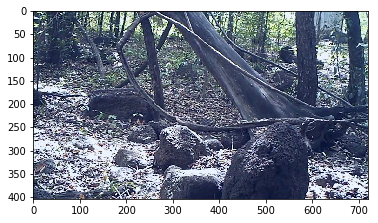

In [11]:
import matplotlib.pyplot as plt

img = output[5].cpu().numpy().astype(np.float32).transpose((1, 2, 0))
img += -img.min()
img *= (1/img.max())

plt.imshow(img)
plt.show()

In [6]:
!chmod 777 short_videos.csv

chmod: changing permissions of 'short_videos.csv': Operation not permitted


In [7]:
!chmod 777 broken_videos.csv

chmod: changing permissions of 'broken_videos.csv': Operation not permitted


In [8]:
!> short_videos.csv
!> broken_videos.csv

/bin/sh: 1: cannot create short_videos.csv: Permission denied
/bin/sh: 1: cannot create broken_videos.csv: Permission denied


In [5]:
output,gt = predict_folder.__getitem__(1)

In [6]:
output[0]


( 0 ,.,.) = 
 -1.2617 -1.2617 -1.2103  ...  -0.5938 -0.5253  1.0673
 -1.3130 -1.2959 -1.2788  ...   0.8447  0.4508  2.0263
 -1.3987 -1.3987 -1.3644  ...   1.3927  0.1939  1.8208
           ...             ⋱             ...          
 -0.7479 -0.7822 -0.8849  ...  -0.6281 -0.0801 -0.1486
 -0.5938 -0.6623 -0.8678  ...  -1.3130 -1.1418 -1.0048
 -0.5082 -0.6109 -0.8507  ...  -1.3644 -1.1589 -1.0219

( 1 ,.,.) = 
 -1.1253 -1.1253 -1.0728  ...  -0.0574  0.0126  1.6408
 -1.1779 -1.1604 -1.1429  ...   1.4132  1.0105  2.4286
 -1.2654 -1.2654 -1.2304  ...   1.9909  0.7654  2.4286
           ...             ⋱             ...          
 -0.4426 -0.4776 -0.5826  ...  -0.4251  0.1352  0.0651
 -0.2850 -0.3550 -0.5651  ...  -1.1253 -0.9503 -0.8102
 -0.1975 -0.3025 -0.5476  ...  -1.1779 -0.9678 -0.8277

( 2 ,.,.) = 
 -0.6193 -0.6193 -0.5670  ...  -0.0267  0.0953  1.7163
 -0.6715 -0.6541 -0.6367  ...   1.4374  1.0888  2.6400
 -0.7587 -0.7587 -0.7238  ...   1.8905  0.6705  2.3263
           ...         

In [13]:
output[0]


( 0 ,.,.) = 
   42   42   41  ...    89   84   77
   42   42   41  ...   104   97   89
   42   42   41  ...    99   90   83
      ...         ⋱        ...      
   32   32   32  ...    94   98  100
   32   32   32  ...    93   96   99
   32   32   32  ...    93   96   99

( 1 ,.,.) = 
   45   45   44  ...   108  103   96
   45   45   44  ...   123  116  108
   45   45   44  ...   118  109  102
      ...         ⋱        ...      
   27   27   27  ...   110  114  116
   27   27   27  ...   109  112  115
   27   27   27  ...   109  112  115

( 2 ,.,.) = 
   37   37   36  ...    97   92   85
   37   37   36  ...   112  105   97
   37   37   36  ...   107   98   91
      ...         ⋱        ...      
   43   43   43  ...   146  150  152
   43   43   43  ...   145  148  151
   43   43   43  ...   145  148  151
[torch.ByteTensor of size 3x404x720]

In [3]:
!ls small_densenet_features | head

008uxqP8IN.mp4.npy
00m1THnvdf.mp4.npy
022FTx3qdv.mp4.npy
03uRLtBapG.mp4.npy
044sMEMWRt.mp4.npy
04O3Epj1r5.mp4.npy
04VqWIVszm.mp4.npy
04h7jLMJiw.mp4.npy
05wb5YuXJ4.mp4.npy
05zPxtYV1b.mp4.npy
ls: write error: Broken pipe


In [4]:
import numpy as np

vid = np.load('small_densenet_features/044sMEMWRt.mp4.npy')
vid.shape

(15, 8832)

In [10]:
output[0]


( 0 ,.,.) = 
  255  255  255  ...     0    0    0
  255  255  255  ...     0    0    0
  255  255  255  ...     0    0    0
      ...         ⋱        ...      
  255  255  255  ...     0    0    0
  255  255  255  ...     0    0    0
  255  255  255  ...     0    0    0

( 1 ,.,.) = 
  255  255  255  ...     0    0    0
  255  255  255  ...     0    0    0
  255  255  255  ...     0    0    0
      ...         ⋱        ...      
  255  255  255  ...     0    0    0
  255  255  255  ...     0    0    0
  255  255  255  ...     0    0    0

( 2 ,.,.) = 
  255  255  255  ...     0    0    0
  255  255  255  ...     0    0    0
  255  255  255  ...     0    0    0
      ...         ⋱        ...      
  255  255  255  ...     0    0    0
  255  255  255  ...     0    0    0
  255  255  255  ...     0    0    0
[torch.ByteTensor of size 3x404x720]

# Extract images for e2e model

In [49]:
# import torch
import torch.utils.data as data

# from PIL import Image, ImageDraw, ImageFont
import cv2
import moviepy.editor as mpe
import numpy as np 
from random import randint
from numpy import random
import os
import torch
from itertools import repeat
    
class ExtractFrames(data.Dataset):
    def __init__(self,
                 root,
                 video_dict,
                 dataset_name='micro_chimps',
                 fps = 2,
                 target_size = (64,64),
                 target_folder = '../slow_max_space/video_frames'):
        
        self.root = root
        self.video_dict = video_dict
        self.name = dataset_name
        self.video_ids = list(self.video_dict.keys())
        self.fps = fps
        self.target_size = target_size
        self.target_folder = target_folder
        
        unique_values = sorted(list(set([x for x in self.video_dict.values()])))
        print(unique_values)
        self.idx_2_value = {i:value for i,value in enumerate(unique_values) }
        self.value_2_idx = {value:i for i,value in enumerate(unique_values) }
        del unique_values

    def __getitem__(self, index):
        video_id = self.video_ids[index]
    
        try:
            clip = mpe.VideoFileClip(filename = os.path.join(self.root, video_id),
                                    audio = False,
                                    target_resolution = (self.target_size[0],self.target_size[1]))
           
            frame_counter = 0
            # loop over the extracted images 
            for im in clip.iter_frames(fps=self.fps): 
                
                # Videos mostly give 31 frames, but sometimes 30
                if frame_counter < self.fps * 15:
                    cv2.imwrite('{}_{}.jpg'.format( os.path.join(self.target_folder, video_id), frame_counter), im)
                else:
                    # break out of the loop if there are more than 15 * fps frames
                    break
                    
                frame_counter += 1
            
            if frame_counter != self.fps * 15:
                print ('Short video detected - {} - {} frames'.format(video_id,str(frame_counter)) )
                
                # write the size of the first frame to the file
                with open("short_videos.csv", "a") as myfile:
                    myfile.write('{},{}\n'.format(video_id,frame_counter ))
                
                # save the last frame
                for append_frames in repeat(None, self.fps*15 - frame_counter):
                    # append the last image number of times we need to get 30 frames
                    cv2.imwrite('{}_{}.jpg'.format( os.path.join(self.target_folder, video_id), frame_counter), im)
                    frame_counter += 1
     
        except Exception as e:
            print ('Video open exception triggered with video {}'.format(video_id))
            print(str(e))

            # write the size of the first frame to the file
            with open("broken_videos.csv", "a") as myfile:
                myfile.write('{},{}\n'.format(video_id,str(e) ))
                        
            video_matrix = random.random((self.fps * 15,self.target_size[0],self.target_size[1],3))
            
            frame_counter = 0
            for frame in video_matrix:
                cv2.imwrite('{}_{}.jpg'.format( os.path.join(self.target_folder, video_id), frame_counter), frame)  
                frame_counter += 1

        return 1,1
                
    def __len__(self):
        return len(self.video_ids)

In [95]:
# import torch
import torch.utils.data as data

# from PIL import Image, ImageDraw, ImageFont
import cv2
import moviepy.editor as mpe
import numpy as np 
from random import randint
from numpy import random
import os
import torch
from itertools import repeat
    
class ExtractNpyArrs(data.Dataset):
    def __init__(self,
                 root,
                 video_dict,
                 dataset_name='micro_chimps',
                 fps = 2,
                 target_size = (64,64),
                 target_folder = '../slow_max_space/video_frames'):
        
        self.root = root
        self.video_dict = video_dict
        self.name = dataset_name
        self.video_ids = list(self.video_dict.keys())
        self.fps = fps
        self.target_size = target_size
        self.target_folder = target_folder
        
        unique_values = sorted(list(set([x for x in self.video_dict.values()])))
        print(unique_values)
        self.idx_2_value = {i:value for i,value in enumerate(unique_values) }
        self.value_2_idx = {value:i for i,value in enumerate(unique_values) }
        del unique_values

    def __getitem__(self, index):
        video_id = self.video_ids[index]
    
        try:
            clip = mpe.VideoFileClip(filename = os.path.join(self.root, video_id),
                                    audio = False,
                                    target_resolution = (self.target_size[0],self.target_size[1]))
           
            video_matrix = None
            frame_counter = 0
            # loop over the extracted images 
            for im in clip.iter_frames(fps=self.fps): 
                # Videos mostly give 31 frames, but sometimes 30
                if frame_counter < self.fps * 15:
                    im = im[np.newaxis, ...]
                    if video_matrix is None:
                        video_matrix = im
                    else:
                        video_matrix = np.append(video_matrix,im, axis=0)
                else:
                    # break out of the loop if there are more than 15 * fps frames
                    break
                    
                frame_counter += 1
            
            if frame_counter != self.fps * 15:
                print ('Short video detected - {} - {} frames'.format(video_id,str(frame_counter)) )
                
                # write the size of the first frame to the file
                with open("short_videos.csv", "a") as myfile:
                    myfile.write('{},{}\n'.format(video_id,frame_counter ))
                    
                for append_frames in repeat(None, self.fps*15 - frame_counter):
                    # append the last image number of times we need to get 30 frames
                    video_matrix = np.append(video_matrix,im, axis=0)
            
            np.save( os.path.join(self.target_folder, video_id), video_matrix)    
            
        except Exception as e:
            print ('Video open exception triggered with video {}'.format(video_id))
            print(str(e))

            # write the size of the first frame to the file
            with open("broken_videos.csv", "a") as myfile:
                myfile.write('{},{}\n'.format(video_id,str(e) ))
                        
            video_matrix = random.random((self.fps * 15,self.target_size[0],self.target_size[1],3))
            np.save( os.path.join(self.target_folder, video_id), video_matrix)


        return 1,1
                
    def __len__(self):
        return len(self.video_ids)

In [ ]:
д

In [96]:
ExtractFrames = ExtractNpyArrs(root = '../slow_max_space/raw',
                           video_dict = predict_dict,
                           dataset_name = 'predict_chimps',
                           fps = 1,
                           target_size = (404, 720),
                           target_folder = '../slow_max_space/video_frames'
                       )

['all_animals']


In [50]:
ExtractFrames = ExtractFrames(root = '../slow_max_space/raw',
                           video_dict = predict_dict,
                           dataset_name = 'predict_chimps',
                           fps = 1,
                           target_size = (404, 720),
                           target_folder = '../slow_max_space/video_frames'
                       )

['all_animals']


In [76]:
df = pd.read_csv('train.csv')
df.head()

,filename,bird,blank,cattle,chimpanzee,elephant,forest buffalo,gorilla,hippopotamus,human,...,other (primate),pangolin,porcupine,reptile,rodent,small antelope,small cat,wild dog,duiker,hog
0,000libDc84.mp4,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,003TeGtbkD.mp4,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,006jFoesFi.mp4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
3,008uxqP8IN.mp4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
4,0094UxdyyZ.mp4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [79]:
df[df.leopard==1].head()

,filename,bird,blank,cattle,chimpanzee,elephant,forest buffalo,gorilla,hippopotamus,human,...,other (primate),pangolin,porcupine,reptile,rodent,small antelope,small cat,wild dog,duiker,hog
621,0BAXu18xcf.mp4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
860,0GFVOpmeax.mp4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1217,0N8B9H0JPU.mp4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2950,0sIeFzacy1.mp4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3217,0xTUwM4ZJI.mp4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [81]:
ExtractFrames.video_ids.index('0GFVOpmeax.mp4')

169827

In [ ]:
3GREuPkaOh.mp4	

In [107]:
ExtractFrames.__getitem__(169828)

(1, 1)

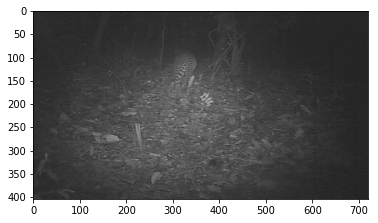

In [91]:
import matplotlib.pyplot as plt

img = cv2.imread('../slow_max_space/video_frames/0GFVOpmeax.mp4_1.jpg')

plt.imshow(img)
plt.show()

In [108]:
!ls -laht ../slow_max_space/video_frames/

total 26M
-rw-r--r-- 1 keras users  13M Nov 26 09:06 NL2APtDueU.mp4.npy
drwxrwxrwx 2  1001  1001 980K Nov 26 09:06 .
-rw-r--r-- 1 keras users  13M Nov 26 09:03 0GFVOpmeax.mp4.npy
drwxr-xr-x 5  1001  1001 4.0K Nov 26 08:08 ..


In [99]:
arr = np.load('../slow_max_space/video_frames/0GFVOpmeax.mp4.npy')

In [104]:
type(arr[0,0,0,0])

numpy.uint8

In [101]:
arr.shape

(15, 404, 720, 3)

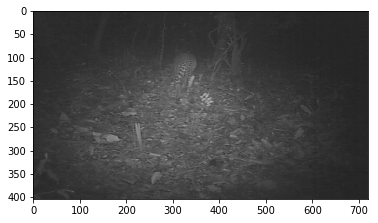

In [106]:
plt.imshow(arr[1])
plt.show()

# Check that id sequence in the generators is valid

In [3]:
import pandas as pd

def get_predict_videos():
    df_submit = pd.read_csv('submission.csv')
    predict_dict = dict(zip(list(df_submit.filename.values),['all_animals'] * len(list(df_submit.filename.values)) ))
    return predict_dict

predict_dict = get_predict_videos()
df_predict = pd.DataFrame(list(predict_dict.items()))

In [5]:
from NumpyGenerator import NumpyDataset
import torch.utils.data

predict_folder = NumpyDataset(root = 'hd_resnet_features_test/',
                         video_dict = predict_dict,
                         dataset_name='extracted_features')

predict_loader = torch.utils.data.DataLoader(
    dataset = predict_folder,
    batch_size=2,
    shuffle=False,
    num_workers=2,
    pin_memory=False)


['all_animals']


In [6]:
predict_dict

{'gQn67G5NnN.mp4': 'all_animals',
 'SSHsCKF1G1.mp4': 'all_animals',
 'ZzQwC8DUSh.mp4': 'all_animals',
 'X01w9Zg0qL.mp4': 'all_animals',
 'gfnzMyM4ju.mp4': 'all_animals',
 'n3zzMDrokR.mp4': 'all_animals',
 '73inbbGthV.mp4': 'all_animals',
 '4TW3JaudJO.mp4': 'all_animals',
 'RhgaqZSWAC.mp4': 'all_animals',
 '5DrPyyHYiF.mp4': 'all_animals',
 'rplRHIPRgf.mp4': 'all_animals',
 'kTycwTx5Wd.mp4': 'all_animals',
 'GtnmEQOyLT.mp4': 'all_animals',
 'dx3zzKXeoo.mp4': 'all_animals',
 'd1RakNTGL5.mp4': 'all_animals',
 'KzR8Y2O1YO.mp4': 'all_animals',
 't4yFp0mUBs.mp4': 'all_animals',
 'RAYmlx9GYE.mp4': 'all_animals',
 'f2Pldox4Ki.mp4': 'all_animals',
 'lnkVh0u2FM.mp4': 'all_animals',
 'Zq0uNEAhvo.mp4': 'all_animals',
 'AApfFGJwEj.mp4': 'all_animals',
 'K6MOswGOYu.mp4': 'all_animals',
 'EsRSgeisNZ.mp4': 'all_animals',
 '6s39SuI9i1.mp4': 'all_animals',
 'teabvxQyeF.mp4': 'all_animals',
 'nt23FM1S7e.mp4': 'all_animals',
 'Z4uvWYzh9O.mp4': 'all_animals',
 'rTyWrYUU0x.mp4': 'all_animals',
 'LVGWd9quWD.m

In [10]:
df_predict.tail()

,0,1
87479,BZ2OPo67Ue.mp4,all_animals
87480,nkPDiK7Z1P.mp4,all_animals
87481,cld96r2hBH.mp4,all_animals
87482,h6JkOSTDvq.mp4,all_animals
87483,r4fmsbzF76.mp4,all_animals


In [9]:
predict_folder.video_ids[-10:]

['Ji6L8LEzLV.mp4',
 '3EYo4c4EyB.mp4',
 'ZbO7RqgYnw.mp4',
 'q6XrYTJLT5.mp4',
 'EQjskjzEwY.mp4',
 'BZ2OPo67Ue.mp4',
 'nkPDiK7Z1P.mp4',
 'cld96r2hBH.mp4',
 'h6JkOSTDvq.mp4',
 'r4fmsbzF76.mp4']

# Generator for multiple data sources

In [2]:
!ls -laht *meta*

-rw-r--r-- 1 keras users  20M Nov 18 10:06 video_metadata.csv
-rw-r--r-- 1 keras users 1.4K Nov 17 06:11 extract_meta_data.py
-rw-r--r-- 1 keras users  458 Nov 15 13:22 video_meta_data.csv


In [3]:
!rm video_meta_data.csv 

In [9]:
!ls -laht *sizes*

-rw-r--r-- 1 keras users 16M Nov 18 13:20 file_sizes.csv
-rw-r--r-- 1 keras users 871 Nov 18 12:24 extract_file_sizes.py
-rw-rw-r-- 1  1001  1001   0 Nov 15 04:39 video_sizes.csv


In [5]:
import pandas as pd

meta_df = pd.read_csv('video_metadata.csv')
meta_df.head()

,Unnamed: 0,Unnamed: 0.1,video_id,height,width,nb_frames,avg_frame_rate
0,0,300000,OKuO3dgXzI.mp4,404,720,360,24/1
1,1,300001,yE3rvyBR7S.mp4,480,720,360,24/1
2,2,300002,160TW50Z3v.mp4,404,720,360,24/1
3,3,300003,VbiJqobm33.mp4,480,720,351,24/1
4,4,300004,roxyLSMzPU.mp4,404,720,360,24/1


In [8]:
meta_df.shape,size_df.shape

((456441, 7), (456441, 4))

In [ ]:
size_dict 

In [26]:
size_df = pd.read_csv('file_sizes.csv')
size_df['size'] = size_df['size'].apply(lambda x: np.log10(x+1))

size_dict = dict(zip(size_df['video_id'],size_df['size']))
del size_df

meta_df = pd.read_csv('video_metadata.csv')
meta_df['dims'] = meta_df[['height','width']].values.tolist()
meta_dict = dict(zip(meta_df['video_id'],meta_df['dims']))
del meta_df

In [27]:
meta_dict

{'cyLogJPcv2.mp4': [480, 720],
 'Qm11wSCENM.mp4': [404, 720],
 'noQrrna4We.mp4': [404, 720],
 'A7Qgx9Lc5T.mp4': [404, 720],
 '2pWl6nHi5U.mp4': [404, 720],
 'Dmi075h7ox.mp4': [404, 720],
 'tzk2VTO33Q.mp4': [404, 720],
 'HpzWnivU8w.mp4': [404, 720],
 'FjIKNTqRVU.mp4': [404, 720],
 'yBHJGJ0PPc.mp4': [404, 720],
 'FtyMZ0feZP.mp4': [404, 720],
 '8r02SOAMWy.mp4': [404, 720],
 'MfQWe847bR.mp4': [404, 720],
 'N1pdGey2sd.mp4': [404, 720],
 '9EQt2pKpLu.mp4': [404, 720],
 'IWU8TheQHD.mp4': [404, 720],
 'zUu19fY8RS.mp4': [404, 720],
 'oBpafGnFJV.mp4': [404, 720],
 'ley4m2XFtz.mp4': [404, 720],
 'oUoqhRgHq6.mp4': [404, 720],
 '6ZQTTc2Lo3.mp4': [404, 720],
 'sI6hFqyEPb.mp4': [404, 720],
 'uSuOaNCtcI.mp4': [404, 720],
 'TdaSK0VH1d.mp4': [404, 720],
 'gpnlexG1M0.mp4': [404, 720],
 'ncXHFHmPKd.mp4': [404, 720],
 '0ylvZ6anI1.mp4': [404, 720],
 '5cczD0Chq7.mp4': [404, 720],
 'cGW9niUVmE.mp4': [404, 720],
 'toBRqtIm7U.mp4': [404, 720],
 'OBxhtgqu9L.mp4': [404, 720],
 'prw1FLfCQJ.mp4': [404, 720],
 'ZcjnZp

In [20]:
size_dict

{'cyLogJPcv2.mp4': 6.417129437294073,
 'Qm11wSCENM.mp4': 6.5801605834199801,
 'Pf9i0fizbV.mp4': 6.5659717165438192,
 'A7Qgx9Lc5T.mp4': 6.4711644852241745,
 '2pWl6nHi5U.mp4': 6.7331827348632753,
 'fQfxxV0pin.mp4': 5.7120036712363227,
 'FjIKNTqRVU.mp4': 6.6303293084886636,
 'uWDYleCkRC.mp4': 5.689640004503957,
 'FtyMZ0feZP.mp4': 6.0647966816990726,
 '8r02SOAMWy.mp4': 5.9908301555113113,
 'MfQWe847bR.mp4': 5.9960074754101846,
 '9EQt2pKpLu.mp4': 6.4215152493603052,
 'IWU8TheQHD.mp4': 6.9408872698746054,
 'zUu19fY8RS.mp4': 5.33184215830269,
 'bLDYoiZGLb.mp4': 6.4215764535847848,
 'ley4m2XFtz.mp4': 6.1885041014813904,
 'oUoqhRgHq6.mp4': 5.7782561922034779,
 '1Ts5q1Luib.mp4': 6.4506024063624219,
 'uSuOaNCtcI.mp4': 5.9224202550117244,
 'TdaSK0VH1d.mp4': 6.2138682386044781,
 'gpnlexG1M0.mp4': 6.4845671685404431,
 'ncXHFHmPKd.mp4': 6.0534522370289228,
 '0ylvZ6anI1.mp4': 6.5034760800278502,
 'toBRqtIm7U.mp4': 6.5417449431002375,
 'OBxhtgqu9L.mp4': 6.0393264582013755,
 'prw1FLfCQJ.mp4': 6.04511556

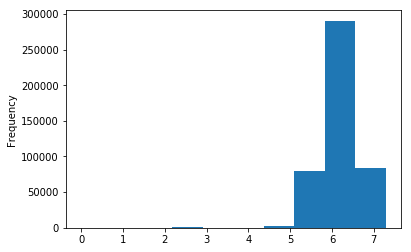

In [16]:
import matplotlib.pyplot as plt
import numpy as np

size_df['size'].apply(lambda x: np.log10(x+1)).plot(kind='hist')
plt.show()

In [12]:
!ls -ls small_densenet_features | wc -l

204131


In [11]:
!ls -ls inception4_features_train/ | wc -l

204131


In [28]:
import pandas as pd
from random import randint

def train_test_split():
    from sklearn.model_selection import train_test_split     
    df_train = pd.read_csv('train.csv')
    df_submit = pd.read_csv('submission.csv')

    # remove lion - because it cannot be split
    ANIMALS = ['bird', 'blank', 'cattle', 'chimpanzee', 'elephant',
           'forest buffalo', 'gorilla', 'hippopotamus', 'human', 'hyena',
           'large ungulate', 'leopard', 'other (non-primate)',
           'other (primate)', 'pangolin', 'porcupine', 'reptile', 'rodent',
           'small antelope', 'small cat', 'wild dog', 'duiker', 'hog']

    ANIMALS_SUBSET = ['duiker','hog','other (primate)','human''chimpanzee','blank']

    df_train['animal'] = ''
    df_train.loc[df_train.sum(axis=1)>1,'animal'] = '2 animals'
    df_train.loc[df_train.sum(axis=1)==1, 'animal'] = df_train[df_train.sum(axis=1)==1][ANIMALS].idxmax(axis=1)


    df_sample = pd.DataFrame()

    # just take the dataset as is w/o any limitations
    for animal in ANIMALS:
        df_sample = df_sample.append(df_train[df_train.animal == animal])

    train_vids, valid_vids = train_test_split(df_sample.filename.values,
                                              test_size=0.2,
                                              random_state=randint(0, 9),
                                              stratify = df_sample.animal.values)

    video_2_animal_train = dict(zip(df_train[df_train.filename.isin(train_vids)].filename,df_train[df_train.filename.isin(train_vids)].animal))
    video_2_animal_valid = dict(zip(df_train[df_train.filename.isin(valid_vids)].filename,df_train[df_train.filename.isin(valid_vids)].animal))

    return video_2_animal_train,video_2_animal_valid
video_2_animal_train,video_2_animal_valid = train_test_split()

In [8]:
!ls -U  resnet_half_res_train | head -4

QwXRMX0dtK.mp4.npy
luxE15rYPH.mp4.npy
3mLZUS9v9q.mp4.npy
5Ut87bgV9I.mp4.npy


In [9]:
import numpy as np 

arr = np.load('resnet_half_res_train/QwXRMX0dtK.mp4.npy')
arr.shape

(30, 2048)

In [32]:
from NumpyGeneratorMultiple import NumpyDatasetBce
import torch.utils.data

train_loader = torch.utils.data.DataLoader(
    NumpyDatasetBce(root = ['inception4_features_train/',
                         'small_densenet_features/',
                         'resnet152_features_train/',
                         'resnet_half_res_train/'],
                     video_dict = video_2_animal_train,
                     feature_vector_length = [3072,2208,6144,2048],
                     dataset_name='extracted_features',
                     sequence_length = [15,15,15,30]),  
    batch_size=2,
    shuffle=True,
    num_workers=2,
    pin_memory=False)


['bird', 'blank', 'cattle', 'chimpanzee', 'duiker', 'elephant', 'forest buffalo', 'gorilla', 'hippopotamus', 'hog', 'human', 'hyena', 'large ungulate', 'leopard', 'other (non-primate)', 'other (primate)', 'pangolin', 'porcupine', 'reptile', 'rodent', 'small antelope', 'small cat', 'wild dog']


In [33]:
for i, (input, target,target_one,size,size_small,meta) in enumerate(train_loader):
    break

In [34]:
len(input)

4

In [41]:
input[0].size(),input[1].size(),input[2].size(),input[3].size()

(torch.Size([2, 15, 3072]),
 torch.Size([2, 15, 2208]),
 torch.Size([2, 15, 6144]),
 torch.Size([2, 30, 2048]))

In [35]:
target



Columns 0 to 12 
    0     1     0     0     0     0     0     0     0     0     0     0     0
    0     0     0     0     0     0     0     0     0     0     0     0     0

Columns 13 to 22 
    0     0     0     0     0     0     0     0     0     0
    0     0     1     0     0     0     0     0     0     0
[torch.DoubleTensor of size 2x23]

In [38]:
size_small


 3.7035
 4.2801
[torch.DoubleTensor of size 2]

In [37]:
size


 6.1019
 6.7725
[torch.DoubleTensor of size 2]

In [36]:
target_one


  1
 15
[torch.LongTensor of size 2]

In [6]:
target


 1
 5
[torch.LongTensor of size 2]

In [9]:
input[0].size(),input[1].size()

(torch.Size([2, 15, 3072]), torch.Size([2, 15, 8832]))

In [25]:
size_df = pd.read_csv('file_sizes_small.csv')
size_df['size'] = size_df['size'].apply(lambda x: np.log10(x+1))

self.size_dict_small = dict(zip(size_df['video_id'],size_df['size']))
del size_df

# Multiple skip model

In [1]:
1+1

2

In [5]:
import torch
import torch.nn as nn
from torch.autograd import Variable
import numpy as np

class BOF_SKIP_MODEL(nn.Module):
    def __init__(self,
                 input_size,
                 hidden_size,
                 num_layers,
                 num_classes,
                 dropout,
                 use_bnorm,
                 use_bidirectional,
                 use_all_sequence,
                 sequence_length):
        super(BOF_SKIP_MODEL, self).__init__()
        
        # these model settings are lists for several stacked encoders
        # each rnn model should have it's own set of settings
        self.sequence_length = sequence_length
        self.input_size = input_size
        
        # these model settings are shared across all the different rnn models
        self.hidden_size = hidden_size
        self.num_layers = num_layers
        self.use_bidirectional = use_bidirectional
        self.use_all_sequence = use_all_sequence
        
        if use_bidirectional==True:
            self.classifier = nn.Sequential(
                nn.Linear(hidden_size*len(input_size)*2+128, 1024),
                nn.ReLU(inplace=True),
                nn.Dropout(),
                nn.Linear(1024, 1024),
                nn.ReLU(inplace=True),
                nn.Linear(1024, num_classes),
            )
        else:
             self.classifier = nn.Sequential(
                nn.Linear(hidden_size*len(input_size)+128, 1024),
                nn.ReLU(inplace=True),
                nn.Dropout(),
                nn.Linear(1024, 1024),
                nn.ReLU(inplace=True),
                nn.Linear(1024, num_classes)
            )           
 
        self.meta_classifier = nn.Sequential(
            nn.Linear(1+1+2, 128),
            nn.ReLU(inplace=True),
        )   
        
        for i,(sequence_length,input_size) in enumerate(zip(self.sequence_length,self.input_size)):
            
            setattr(self, 'bnorm{}'.format(i+1), nn.BatchNorm1d(input_size))
            
            if use_bidirectional==True:
                setattr(self, 'rnn{}'.format(i+1), nn.GRU(input_size,
                                                        hidden_size,
                                                        num_layers,
                                                        batch_first=True,
                                                        dropout=dropout,
                                                        bidirectional=True))                
            else:
                setattr(self, 'rnn{}'.format(i+1), nn.GRU(input_size,
                                                        hidden_size,
                                                        num_layers,
                                                        batch_first=True,
                                                        dropout=dropout,
                                                        bidirectional=False))                
       
    def forward(self, x1,
                    x2,
                    x3,
                    video_size_small,
                    video_size_full_res,
                    video_dims):
        # Set initial states 
        
        meta_data = torch.cat([video_size_small,video_size_full_res,video_dims],dim=1)
        meta_data = self.meta_classifier(meta_data)

        
        # forward pass for model1
        if self.use_bidirectional==True:
            h0 = Variable(torch.zeros(self.num_layers*2, x1.size(0), self.hidden_size)) 
        else:
            h0 = Variable(torch.zeros(self.num_layers, x1.size(0), self.hidden_size))
        x1 = x1.permute(0,2,1).contiguous()    
        x1 = self.bnorm1(x1)
        x1 = x1.permute(0,2,1)
        # Forward propagate RNN 1
        out1, _ = self.rnn1(x1, h0)  
        # out1 = self.fc1(out1[:, -1, :])              
            
        # forward pass for model2
        if self.use_bidirectional==True:
            h0 = Variable(torch.zeros(self.num_layers*2, x2.size(0), self.hidden_size)) 
        else:
            h0 = Variable(torch.zeros(self.num_layers, x2.size(0), self.hidden_size))
        x2 = x2.permute(0,2,1).contiguous()    
        x2 = self.bnorm2(x2)
        x2 = x2.permute(0,2,1)
        # Forward propagate RNN 1
        out2, _ = self.rnn2(x2, h0)  
        # out2 = self.fc2(out2[:, -1, :])   
        
        # forward pass for model3
        if self.use_bidirectional==True:
            h0 = Variable(torch.zeros(self.num_layers*2, x3.size(0), self.hidden_size)) 
        else:
            h0 = Variable(torch.zeros(self.num_layers, x3.size(0), self.hidden_size))

        x3 = x3.permute(0,2,1).contiguous()    
        x3 = self.bnorm3(x3)
        x3 = x3.permute(0,2,1)
        # Forward propagate RNN 1
        out3, _ = self.rnn3(x3, h0)  
        # out3 = self.fc3(out3[:, -1, :])   
                 
        out = torch.cat([out1[:, -1, :],out2[:, -1, :],out3[:, -1, :],meta_data],dim=1)
        out = self.classifier(out)
        # out = self.classifier(out)
        # print(out.shape)
        return out    

In [15]:
import torch
import torch.nn as nn
from torch.autograd import Variable
import numpy as np

class BOF_SKIP_MODEL_CONCAT(nn.Module):
    def __init__(self,
                 input_size,
                 hidden_size,
                 num_layers,
                 num_classes,
                 dropout,
                 use_bnorm,
                 use_bidirectional,
                 use_all_sequence,
                 sequence_length):
        super(BOF_SKIP_MODEL_CONCAT, self).__init__()
        
        # these model settings are lists for several stacked encoders
        # each rnn model should have it's own set of settings
        self.sequence_length = sequence_length
        self.input_size = input_size
        
        # these model settings are shared across all the different rnn models
        self.hidden_size = hidden_size
        self.num_layers = num_layers
        self.use_bidirectional = use_bidirectional
        self.use_all_sequence = use_all_sequence
        
        if use_bidirectional==True:
            self.classifier = nn.Sequential(
                nn.Linear(hidden_size*len(input_size)*2+128, 1024),
                nn.ReLU(inplace=True),
                nn.Dropout(),
                nn.Linear(1024, 1024),
                nn.ReLU(inplace=True),
                nn.Linear(1024, num_classes),
            )
        else:
             self.classifier = nn.Sequential(
                nn.Linear(hidden_size*len(input_size)+128, 1024),
                nn.ReLU(inplace=True),
                nn.Dropout(),
                nn.Linear(1024, 1024),
                nn.ReLU(inplace=True),
                nn.Linear(1024, num_classes)
            )           
 
        self.meta_classifier = nn.Sequential(
            nn.Linear(1+1+2, 128),
            nn.ReLU(inplace=True),
        )   
        
        for i,(sequence_length,input_size) in enumerate(zip(self.sequence_length,self.input_size)):
            
            setattr(self, 'bnorm{}'.format(i+1), nn.BatchNorm1d(input_size))
            
            if use_bidirectional==True:
                setattr(self, 'rnn{}'.format(i+1), nn.GRU(input_size,
                                                        hidden_size,
                                                        num_layers,
                                                        batch_first=True,
                                                        dropout=dropout,
                                                        bidirectional=True))                
            else:
                setattr(self, 'rnn{}'.format(i+1), nn.GRU(input_size,
                                                        hidden_size,
                                                        num_layers,
                                                        batch_first=True,
                                                        dropout=dropout,
                                                        bidirectional=False))                
       
    def forward(self, x1,
                    x2,
                    x3,
                    video_size_small,
                    video_size_full_res,
                    video_dims):
        # Set initial states 
        
        # Process the video features
        meta_data = torch.cat([video_size_small,video_size_full_res,video_dims],dim=1)
        meta_data = self.meta_classifier(meta_data)

        # concat vectors with the same dimensions
        x1 = torch.cat([x1,x2],dim=2)
        print(x1.size())
        
        # forward pass for model1
        if self.use_bidirectional==True:
            h0 = Variable(torch.zeros(self.num_layers*2, x1.size(0), self.hidden_size)) 
        else:
            h0 = Variable(torch.zeros(self.num_layers, x1.size(0), self.hidden_size))
        x1 = x1.permute(0,2,1).contiguous()    
        x1 = self.bnorm1(x1)
        x1 = x1.permute(0,2,1)
        # Forward propagate RNN 1
        out1, _ = self.rnn1(x1, h0)  
        # out1 = self.fc1(out1[:, -1, :])              
            
        # forward pass for model2
        if self.use_bidirectional==True:
            h0 = Variable(torch.zeros(self.num_layers*2, x3.size(0), self.hidden_size)) 
        else:
            h0 = Variable(torch.zeros(self.num_layers, x3.size(0), self.hidden_size))
        x3 = x3.permute(0,2,1).contiguous()    
        x3 = self.bnorm2(x3)
        x3 = x3.permute(0,2,1)
        # Forward propagate RNN 1
        out3, _ = self.rnn2(x3, h0)  
        # out2 = self.fc2(out2[:, -1, :])   
        
                 
        out = torch.cat([out1[:, -1, :],out3[:, -1, :],meta_data],dim=1)
        out = self.classifier(out)

        return out    

In [4]:
model

BOF_SKIP_MODEL (
  (classifier): Sequential (
    (0): Linear (480 -> 1024)
    (1): ReLU (inplace)
    (2): Dropout (p = 0.5)
    (3): Linear (1024 -> 1024)
    (4): ReLU (inplace)
    (5): Linear (1024 -> 23)
  )
  (size_small_classifier): Sequential (
    (0): Linear (1 -> 128)
    (1): ReLU (inplace)
  )
  (size_big_classifier): Sequential (
    (0): Linear (1 -> 128)
    (1): ReLU (inplace)
  )
  (dims_classifier): Sequential (
    (0): Linear (2 -> 128)
    (1): ReLU (inplace)
  )
  (bnorm1): BatchNorm1d(256, eps=1e-05, momentum=0.1, affine=True)
  (rnn1): GRU(256, 32, num_layers=2, batch_first=True, dropout=0.5)
  (bnorm2): BatchNorm1d(256, eps=1e-05, momentum=0.1, affine=True)
  (rnn2): GRU(256, 32, num_layers=2, batch_first=True, dropout=0.5)
  (bnorm3): BatchNorm1d(256, eps=1e-05, momentum=0.1, affine=True)
  (rnn3): GRU(256, 32, num_layers=2, batch_first=True, dropout=0.5)
)

In [16]:
model = BOF_SKIP_MODEL_CONCAT(                           
                         input_size = [512,256],
                         hidden_size = 32,
                         num_layers = 2,
                         num_classes = 23,
                         dropout = 0.5,
                         use_bnorm = True,
                         use_bidirectional = False,
                         use_all_sequence = False,
                         sequence_length = [2,3]
                           )


In [ ]:
model = BOF_SKIP_MODEL(                           
                         input_size = [256,256,256],
                         hidden_size = 32,
                         num_layers = 2,
                         num_classes = 23,
                         dropout = 0.5,
                         use_bnorm = True,
                         use_bidirectional = False,
                         use_all_sequence = False,
                         sequence_length = [2,2,2]
                           )


In [7]:
x1 = torch.autograd.Variable(torch.randn(2,2,256))
x2 = torch.autograd.Variable(torch.randn(2,2,256))
x3 = torch.autograd.Variable(torch.randn(2,2,256))
video_size_small = torch.autograd.Variable(torch.randn(2,1))
video_size_full_res = torch.autograd.Variable(torch.randn(2,1))
video_dims = torch.autograd.Variable(torch.randn(2,2))
            
out = model(x1,x2,x3,video_size_small,video_size_full_res,video_dims)
print(out.size())

torch.Size([2, 32])
torch.Size([2, 32])
torch.Size([2, 32])
torch.Size([2, 128])
torch.Size([2, 23])


In [17]:
x1 = torch.autograd.Variable(torch.randn(2,2,256))
x2 = torch.autograd.Variable(torch.randn(2,2,256))
x3 = torch.autograd.Variable(torch.randn(2,3,256))
video_size_small = torch.autograd.Variable(torch.randn(2,1))
video_size_full_res = torch.autograd.Variable(torch.randn(2,1))
video_dims = torch.autograd.Variable(torch.randn(2,2))
            
out = model(x1,x2,x3,video_size_small,video_size_full_res,video_dims)
print(out.size())

torch.Size([2, 2, 512])
torch.Size([2, 23])


In [ ]:
video_meta_df = pd.read_csv(data_dir + 'video_metadata.csv', index_col='video_id')[['height', 'width']]
file_sizes_df = pd.read_csv(data_dir + 'file_sizes.csv', index_col='video_id')[['size']]

meta_df = video_meta_df.join(file_sizes_df)

del video_meta_df
del file_sizes_df

meta_df = meta_df[meta_df.index.isin(list(video_names) + list(test_video_names))]
meta_df['size'] = meta_df.groupby(['height', 'width']).transform(lambda x: (x - x.mean()) / x.std())
meta_df = pd.get_dummies(meta_df, columns=['height', 'width'], drop_first=True)
meta_df.head()

In [3]:
import pickle as pickle

# X_meta = meta_df[meta_df.index.isin(video_names)].sort_index().values
# test_X_meta = meta_df[meta_df.index.isin(test_video_names)].sort_index().values

meta_data = pickle.load(open('meta_data.pkl', 'rb'))
test_meta_data = pickle.load(open('test_meta_data.pkl', 'rb'))

# meta_mean = np.concatenate((meta_data, test_meta_data)).mean(axis=0)
# meta_std = np.concatenate((meta_data, test_meta_data)).std(axis=0)

# X_meta = np.concatenate([X_meta, (meta_data - meta_mean)/meta_std], axis=-1)
# test_X_meta = np.concatenate([test_X_meta, (test_meta_data - meta_mean)/meta_std], axis=-1)

# print(X_meta.shape)
# print(test_X_meta.shape)

In [7]:
meta_data[0]

array([2482, 5849])